# SETUP

In [1]:
import sys
sys.path.append('../')

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [79]:
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import pickle

import matplotlib.pyplot as plt
from gemininn import (
    data,
    learners,
    custom_loss,
    models,
    reports
)
from util import label_to_tuple, tuple_to_label


AUX_COLS = ["velocity","mass","deceleration_average"]
AUX_COLS_EXT = AUX_COLS  + [f'PCA_{i}' for i in range(10)]

NUM_LABELS = 4
NUM_CLASSES = 12

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [626]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score
)

metrics_labels = {
    'micro_f1': lambda y_true, y_pred, y_score: f1_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'macro_f1': lambda y_true, y_pred, y_score: f1_score(
        y_true, y_pred, average='macro', zero_division=0
    ),
    'micro_precision': lambda y_true, y_pred, y_score: precision_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'micro_recall': lambda y_true, y_pred, y_score: recall_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'roc_auc_macro': lambda y_true, y_pred, y_score: roc_auc_score(
        y_true, y_score, average='macro'
    ),
    'roc_auc_micro': lambda y_true, y_pred, y_score: roc_auc_score(
        y_true, y_score, average='micro'
    )
}


metrics_multiclass = {
    'accuracy': lambda y_true, y_pred, y_score: accuracy_score(
        y_true, y_pred
    ),
    'micro_f1': lambda y_true, y_pred, y_score: f1_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'macro_f1': lambda y_true, y_pred, y_score: f1_score(
        y_true, y_pred, average='macro', zero_division=0
    ),
    'micro_precision': lambda y_true, y_pred, y_score: precision_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'micro_recall': lambda y_true, y_pred, y_score: recall_score(
        y_true, y_pred, average='micro', zero_division=0
    ),
    'roc_auc_ovo_macro': lambda y_true, y_pred, y_score: roc_auc_score(
        y_true, y_score, multi_class='ovo', average='macro'
    ),
    'roc_auc_ovr_macro': lambda y_true, y_pred, y_score: roc_auc_score(
        y_true, y_score, multi_class='ovr', average='macro'
    )
}

In [5]:
with open("../../data/data_2.0/X_ext_ttrain.pickle", "rb") as f:
    X_train = pickle.load(f)
with open("../../data/data_2.0/y_ttrain.pickle", "rb") as f:
    y_train = pickle.load(f)
    
with open("../../data/data_2.0/X_ext_val.pickle", "rb") as f:
    X_val = pickle.load(f)
with open("../../data/data_2.0/y_val.pickle", "rb") as f:
    y_val = pickle.load(f)
    
with open("../../data/data_2.0/X_ext_test.pickle", "rb") as f:
    X_test = pickle.load(f)
with open("../../data/data_2.0/y_test.pickle", "rb") as f:
    y_test = pickle.load(f)
    



In [935]:
with open("../../data/train.pickle", "rb") as f:
    train = pickle.load(f)
with open("../../data/test.pickle", "rb") as f:
    test = pickle.load(f)

In [6]:
splits = [
    ("train", X_train, y_train),
    ("val",   X_val,   y_val),
    ("test",  X_test,  y_test)
]

for name, X, y in splits:
    try:
        x_shape = X.shape
    except:
        x_shape = (len(X),)
    try:
        y_shape = y.shape
    except:
        y_shape = (len(y),)
    print(f"{name:5s} — X: {x_shape},  y: {y_shape}")

    if isinstance(X, (pd.DataFrame, pd.Series)):
        x_missing = X.isnull().sum().sum()
    else:
        x_missing = np.isnan(X).sum()
    if isinstance(y, (pd.DataFrame, pd.Series)):
        y_missing = y.isnull().sum().sum()
    else:
        y_missing = np.isnan(y).sum()

    print(f"       missing → X: {x_missing},  y: {y_missing}")
    print("-" * 50)

train — X: (2837, 15),  y: (2837,)
       missing → X: 0,  y: 0
--------------------------------------------------
val   — X: (1216, 15),  y: (1216,)
       missing → X: 0,  y: 0
--------------------------------------------------
test  — X: (1001, 15),  y: (1001,)
       missing → X: 0,  y: 0
--------------------------------------------------


In [7]:
def laberer(label):
    return np.array(label_to_tuple(label), dtype=np.int64)

In [8]:
def tupler(tuple_):
    try:
        return tuple_to_label(list(map(bool, tuple_)))
    except ValueError:
        return -1

In [9]:
y_train_v = np.vstack(y_train.apply(laberer).values)
y_val_v = np.vstack(y_val.apply(laberer).values)
y_test_v = np.vstack(y_test.apply(laberer).values)

In [10]:
X_train

,sensor_data,velocity,mass,deceleration_average,pers_image,PCA_0,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9
3155,"[[0.3876606527124275, -0.026084632184585135, -...",-0.000498,1.391025,0.260426,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",-1.517884,-0.687601,-0.667113,-1.248161,1.027690,0.067388,-0.708696,-0.019250,0.702197,3.148221
1547,"[[0.5547995564163138, 0.011370024885155844, -1...",-0.000498,-0.775847,0.956733,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",1.450392,-2.639045,0.221335,-0.737965,-1.252346,-0.913344,0.160065,0.365248,0.145504,-0.095069
613,"[[0.4239629597613565, 0.41239457890716713, -0....",-0.000498,-0.775847,0.526533,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",-0.364908,0.859516,1.516531,0.458322,0.328915,-0.881104,-0.525514,1.670284,-0.531452,-1.046616
529,"[[0.3782915534461624, 0.12570568490043546, -0....",-0.000498,-0.775847,0.491874,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",0.690291,1.887112,0.971861,-0.076722,0.686232,-0.161818,-0.839805,-0.096894,0.420214,-0.074385
2515,"[[-0.3167419273727305, 0.8673165414222888, 0.1...",-0.672642,1.391025,-2.465268,"[[[0.0, 0.0, 0.0, 0.0, 0.0, 6.764095403536788,...",-0.736409,1.857166,-1.093303,-0.826073,0.272821,-0.291772,0.342363,1.420675,2.188579,0.199956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1770,"[[1.0477169331223113, 0.3585603478354039, 0.03...",-0.000498,-0.775847,1.201261,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",-0.321867,0.675280,1.501437,0.795112,-0.851003,2.206035,-1.415846,-0.076621,0.934056,0.375965
1343,"[[1.948274568208287, 0.7035874252441324, 0.289...",-0.672642,-0.775847,1.873418,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",1.049568,0.996742,0.567708,-1.460560,-1.263797,1.035430,1.227598,0.006017,-0.448277,0.437895
1135,"[[-0.24180063210411554, 0.16762527520040357, 0...",0.671647,-0.775847,-0.703090,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",0.018150,1.696513,-0.861983,-0.628609,0.769523,-0.624822,-0.453522,-0.538281,-0.952854,-1.247349
808,"[[0.36754211413104504, 0.5251391141426658, 0.0...",-0.000498,-0.775847,0.758959,"[[[0.0, 0.0, 0.0, 0.0, 0.0, -0.037736206799955...",2.112255,-0.544550,-0.131979,-0.402064,-0.744641,-0.124624,-0.972739,-0.701564,0.582201,-0.502839


In [584]:
loaders_class = data.build_all_loaders(X_train, y_train.values,
                                       X_val, y_val.values,
                                       X_test, y_test,
                                       sensor_key='sensor_data', 
                                       pers_key='pers_image',
                                       aux_cols=AUX_COLS, 
                                       ext_aux_cols=AUX_COLS_EXT)

In [12]:
loaders_class.keys()

dict_keys(['train', 'val', 'test', 'train_ext', 'val_ext', 'test_ext', 'train_pers', 'val_pers', 'test_pers', 'train_ext_pers', 'val_ext_pers', 'test_ext_pers'])

In [13]:
loaders_label = data.build_all_loaders(X_train, y_train_v,
                                       X_val, y_val_v,
                                       X_test, y_test_v,
                                       sensor_key='sensor_data', 
                                       pers_key='pers_image',
                                       aux_cols=AUX_COLS, 
                                       ext_aux_cols=AUX_COLS_EXT)

In [14]:
loaders_label.keys()

dict_keys(['train', 'val', 'test', 'train_ext', 'val_ext', 'test_ext', 'train_pers', 'val_pers', 'test_pers', 'train_ext_pers', 'val_ext_pers', 'test_ext_pers'])

In [139]:
all_labels = torch.cat([labs for _, labs in loaders_label['train']]).float()
pos_cnt    = all_labels.sum(0)
neg_cnt    = len(all_labels) - pos_cnt
pos_weight = (neg_cnt / (pos_cnt+1e-5)).to(device)


# SIMPLE 2D CNN

## Standart Case 1

In [163]:
simple_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     in_channels=1)

In [164]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2)

optimizer = optim.Adam(simple_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 cooldown=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)

simple_cnn = learners.MultiLabelLearner(simple_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label['train'],
                                        loaders_label['val'],
                                        metrics=metrics_labels,
                                        scheduler=scheduler,
                                        model_name='SimpleCNNStandartData')
                                        
                                        

In [165]:
history_simple_cnn = simple_cnn.fit(500)

Starting run 'SimpleCNNStandartData_space_falcon_20250613_154853' with parameters:
  run_name: SimpleCNNStandartData_space_falcon_20250613_154853
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.1673/0.1559 — lr 1.0e-05
                                              micro_f1       :  0.0037 | macro_f1       :  0.0037 | micro_precision:  0.4000
                                              micro_recall   :  0.0019 | roc_auc_macro  :  0.4370 | roc_auc_micro  :  0.4686
Epoch 002 — loss 0.1491/0.1417 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.4574 | roc_auc_micro  :  0.4670
Epoch 003 — loss 0.1417/0.1371 — lr 1.0e-

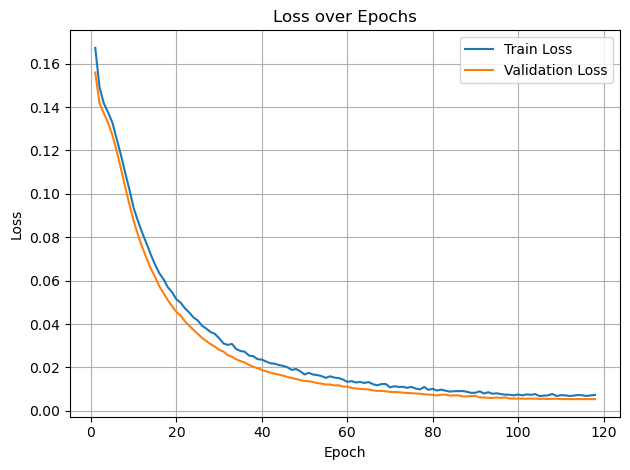

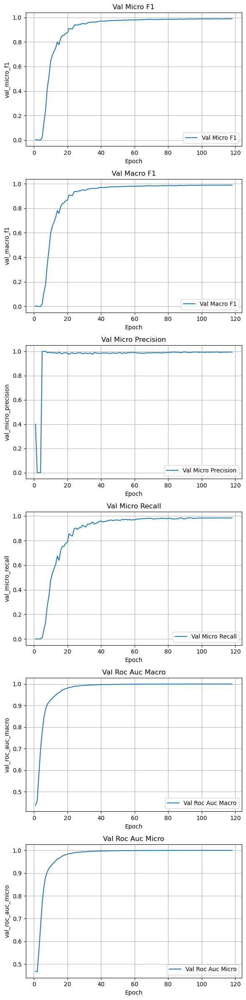

In [166]:
reports.plot_history(history_simple_cnn)

In [167]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_cnn_model, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.15      0.74      0.25       103
           1       0.19      0.57      0.29        96
           2       0.57      0.53      0.55       104
           3       0.20      0.53      0.29       105

   micro avg       0.21      0.59      0.31       408
   macro avg       0.28      0.59      0.34       408
weighted avg       0.28      0.59      0.34       408
 samples avg       0.16      0.24      0.18       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


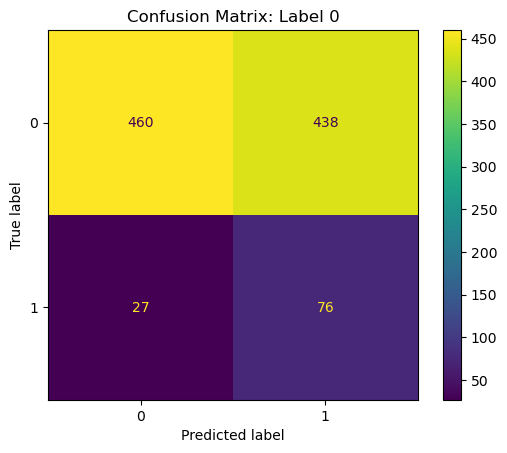

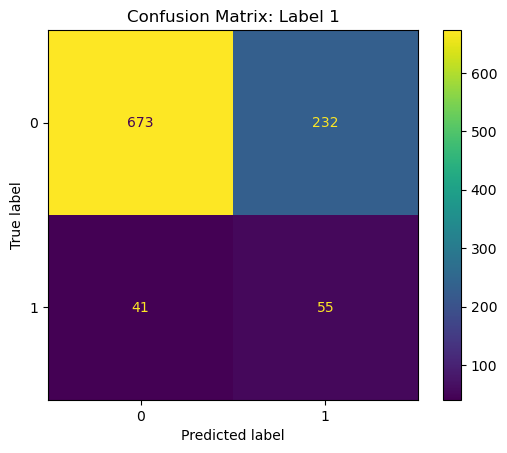

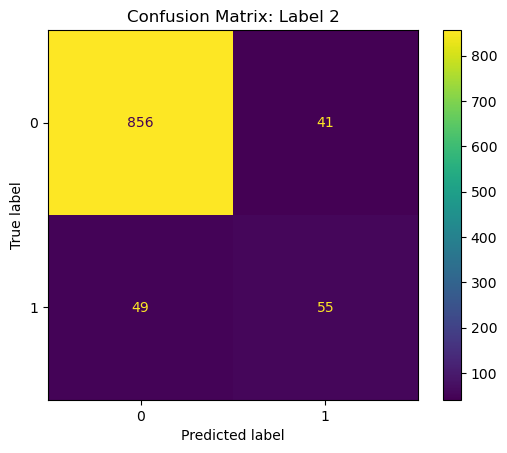

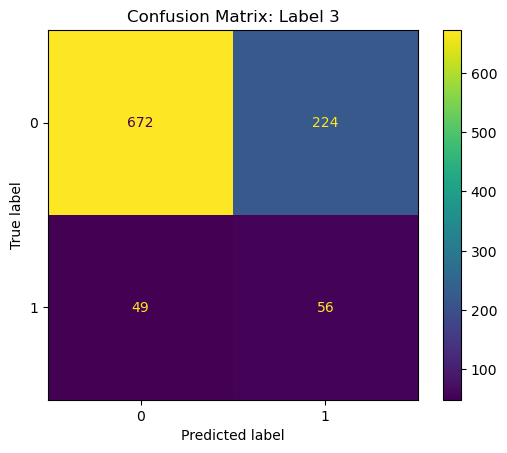

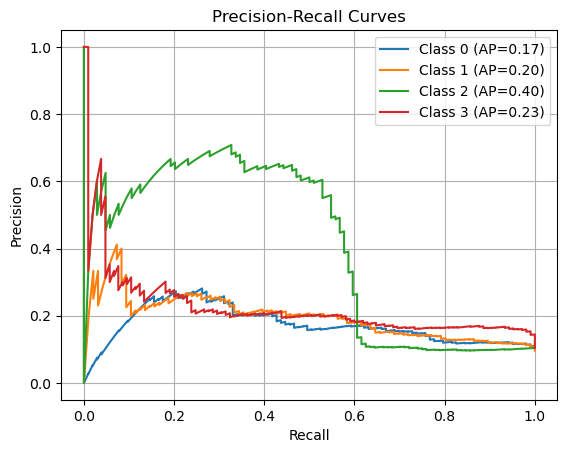

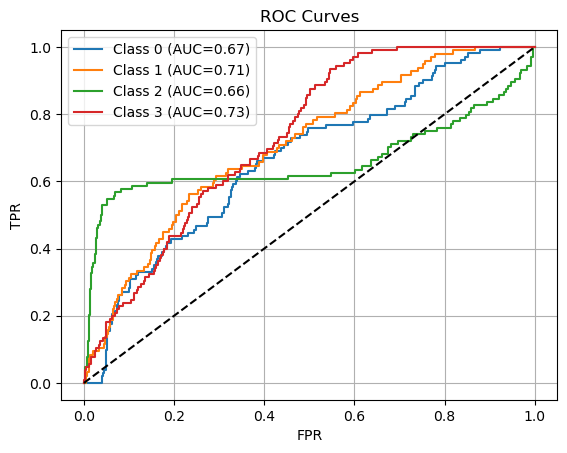

              precision    recall  f1-score   support

    negative       0.69      0.35      0.46       593
    positive       0.45      0.77      0.57       408

    accuracy                           0.52      1001
   macro avg       0.57      0.56      0.51      1001
weighted avg       0.59      0.52      0.50      1001



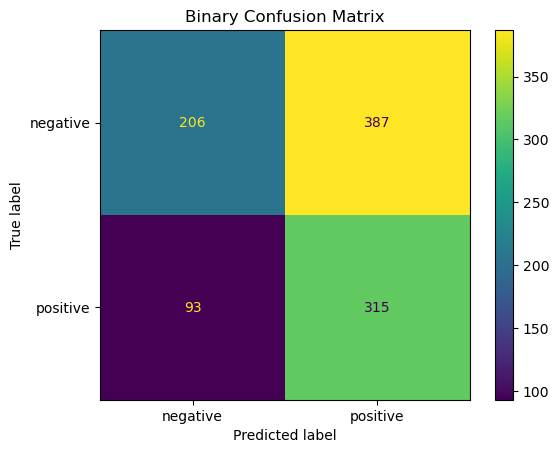

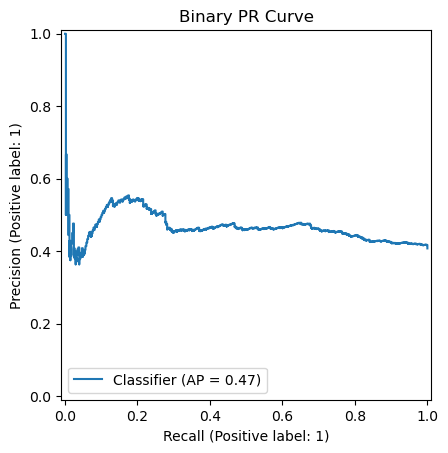

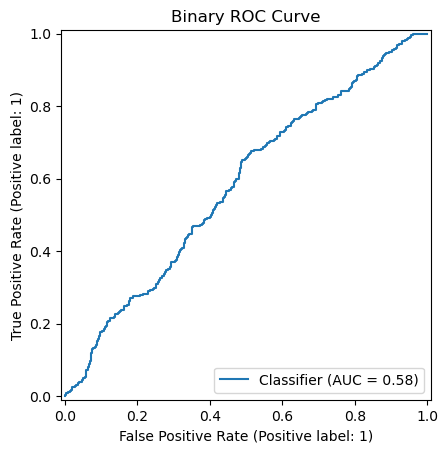

In [168]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [171]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.69      0.35      0.46       593
           1       0.45      0.13      0.21       104
           2       0.29      0.15      0.20       105
           3       0.00      0.00      0.00         0
           4       0.25      0.45      0.32       103
           5       0.37      0.17      0.23        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.30      1001
   macro avg       0.16      0.10      0.11      1001
weighted avg       0.55      0.30      0.37      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


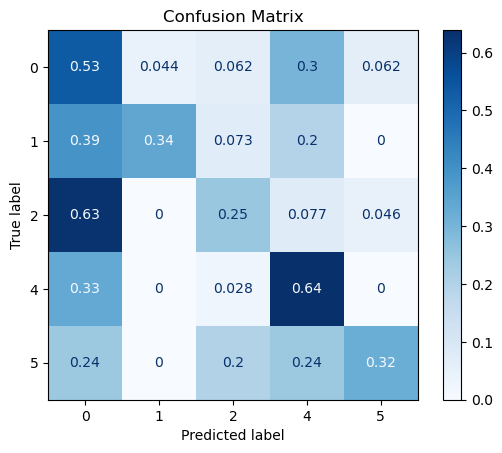

In [172]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Standart Case 2

In [215]:
simple_cnn_model_2 = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     in_channels=1)

In [216]:
criterion = nn.BCEWithLogitsLoss()

optimizer = optim.Adam(simple_cnn_model_2.parameters(),
                      lr=1e-5)



simple_cnn_2 = learners.MultiLabelLearner(simple_cnn_model_2,
                                        optimizer,
                                        criterion,
                                        loaders_label['train'],
                                        loaders_label['val'],
                                        patience=5,
                                        metrics=metrics_labels,
                                        model_name='SimpleCNNStandartData')
                                        
                                        

In [217]:
history_simple_cnn = simple_cnn_2.fit(500)

Starting run 'SimpleCNNStandartData_mystic_nebula_20250613_161419' with parameters:
  run_name: SimpleCNNStandartData_mystic_nebula_20250613_161419
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: BCEWithLogitsLoss
  scheduler: None
  patience: 5
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.6820/0.6598 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.4682 | roc_auc_micro  :  0.5017
Epoch 002 — loss 0.6299/0.5910 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.4280 | roc_auc_micro  :  0.4652
Epoch 003 — loss 0.5747/0.5515 — lr 1.0e-05


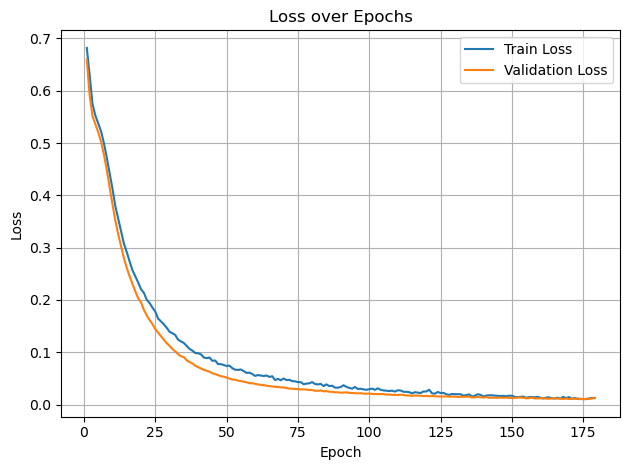

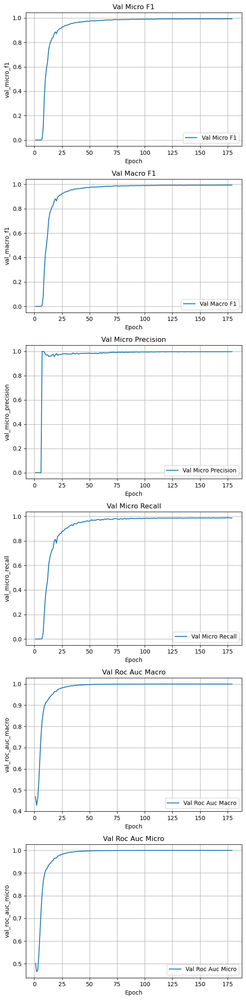

In [218]:
reports.plot_history(history_simple_cnn)

In [219]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_cnn_model_2, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.13      0.73      0.22       103
           1       0.19      0.64      0.29        96
           2       0.49      0.46      0.48       104
           3       0.18      0.70      0.28       105

   micro avg       0.18      0.63      0.28       408
   macro avg       0.25      0.63      0.32       408
weighted avg       0.25      0.63      0.32       408
 samples avg       0.15      0.26      0.18       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


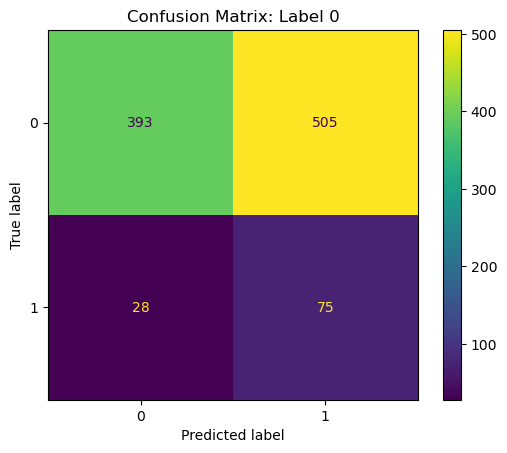

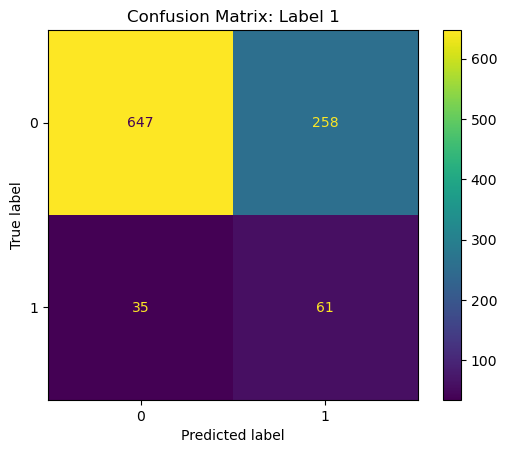

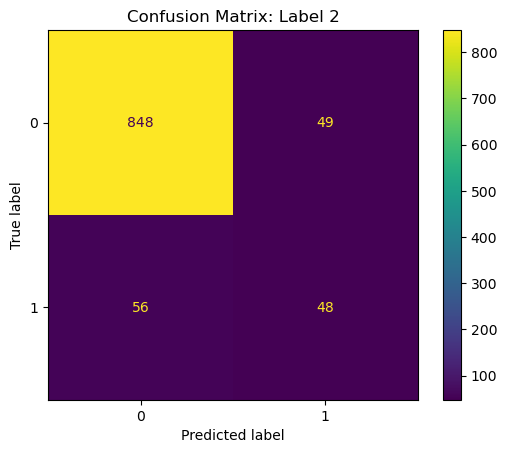

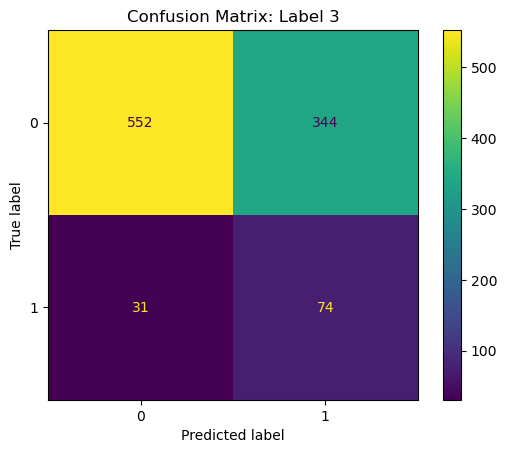

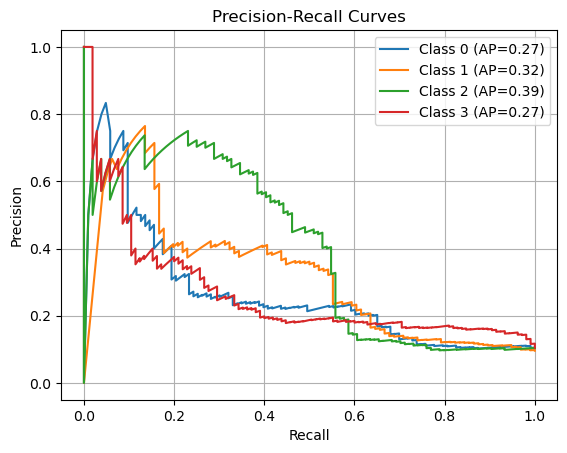

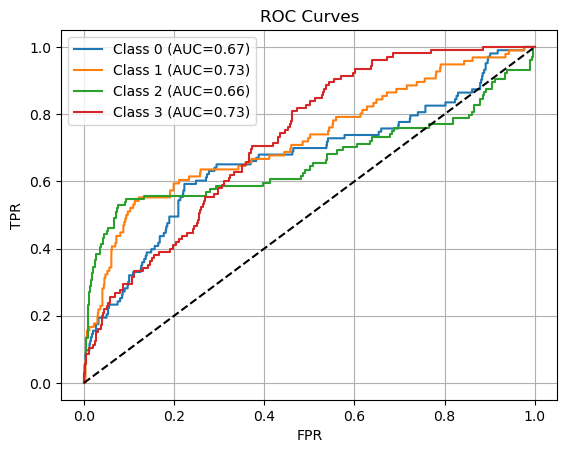

              precision    recall  f1-score   support

    negative       0.67      0.20      0.31       593
    positive       0.43      0.86      0.57       408

    accuracy                           0.47      1001
   macro avg       0.55      0.53      0.44      1001
weighted avg       0.57      0.47      0.42      1001



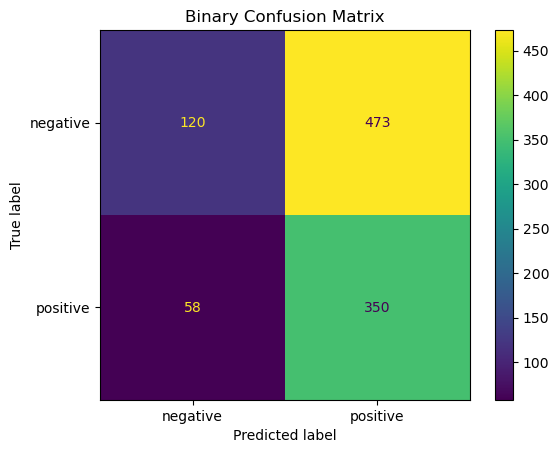

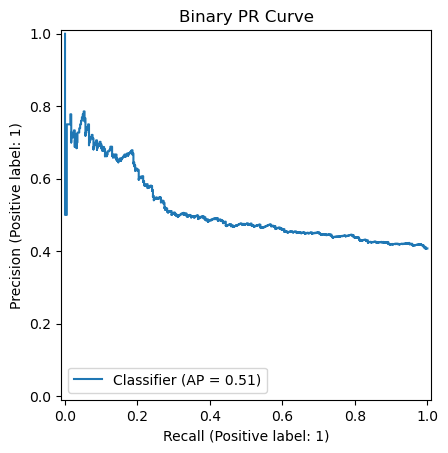

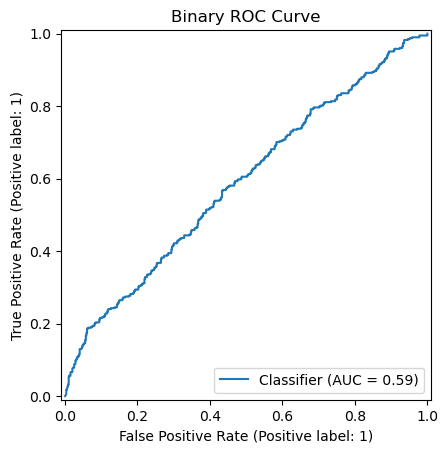

In [220]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [221]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.67      0.20      0.31       593
           1       0.09      0.01      0.02       104
           2       0.12      0.16      0.14       105
           3       0.00      0.00      0.00         0
           4       0.20      0.25      0.22       103
           5       0.16      0.04      0.07        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.17      1001
   macro avg       0.10      0.05      0.06      1001
weighted avg       0.46      0.17      0.23      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


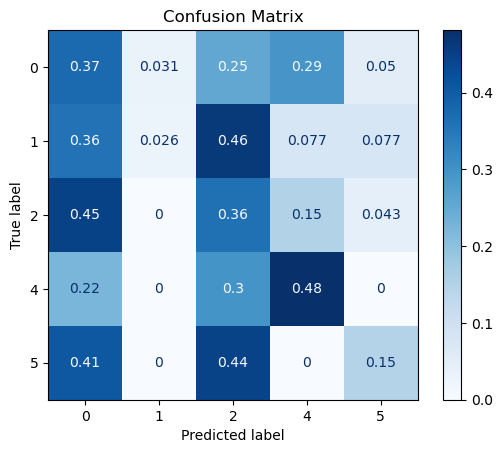

In [222]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case

In [997]:
extended_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
        sensor_shape=(128, 6),

     in_channels=1)

In [998]:
path = "ExtendedCNNStandartData_silent_raven_20250613_174931/ExtendedCNNStandartData_silent_raven_20250613_174931.pt"
a = torch.load(path, map_location="cpu")
extended_cnn_model.load_state_dict(a)

<All keys matched successfully>

In [234]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label['train_ext'],
                                        loaders_label['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [235]:
history_extended_cnn = extended_cnn.fit(500)

Starting run 'ExtendedCNNStandartData_silent_raven_20250613_174931' with parameters:
  run_name: ExtendedCNNStandartData_silent_raven_20250613_174931
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.1613/0.1509 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.4712 | roc_auc_micro  :  0.4778
Epoch 002 — loss 0.1457/0.1394 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5041 | roc_auc_micro  :  0.5009
Epoch 003 — loss 0.1399/0.1352 — lr 1

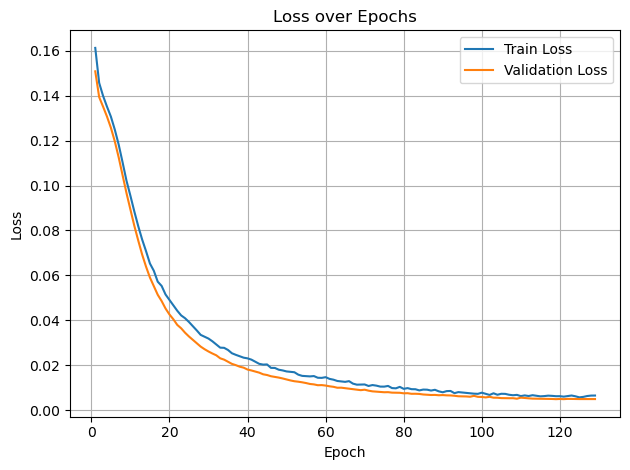

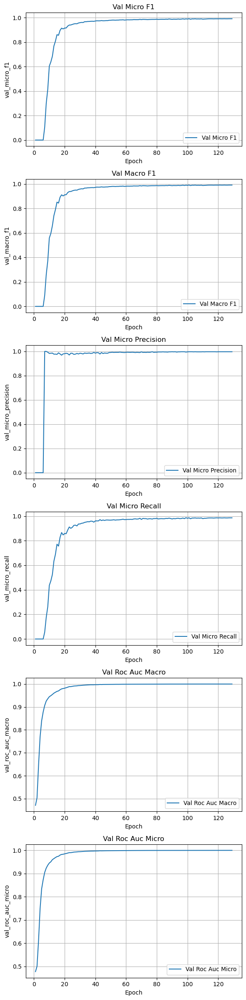

In [236]:
reports.plot_history(history_extended_cnn)

In [1018]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model, loaders_label['test_ext'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.12      0.51      0.20       103
           1       0.20      0.78      0.31        96
           2       0.42      0.38      0.40       104
           3       0.19      0.88      0.32       105

   micro avg       0.19      0.63      0.29       408
   macro avg       0.23      0.64      0.31       408
weighted avg       0.23      0.63      0.31       408
 samples avg       0.15      0.26      0.18       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


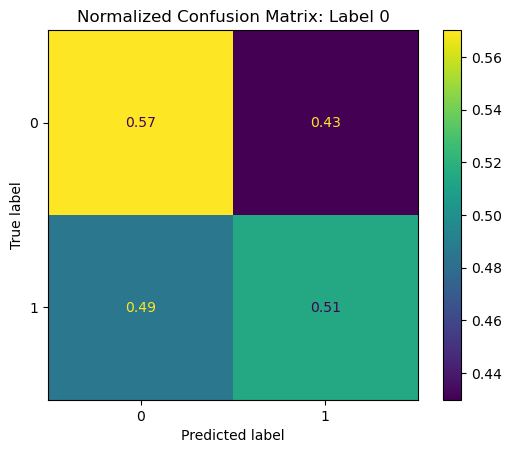

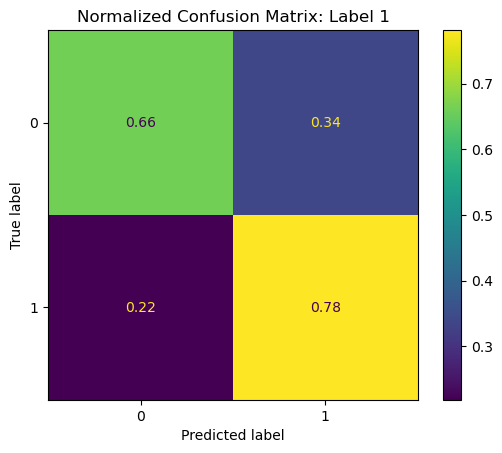

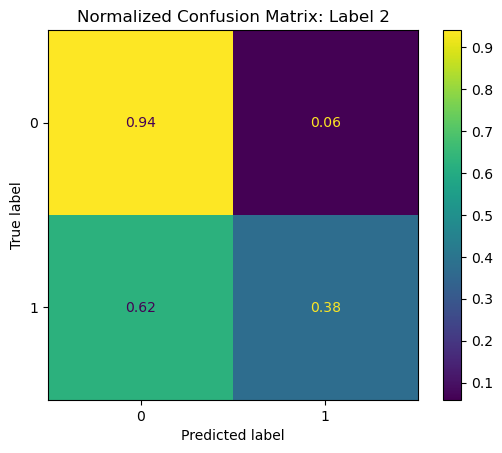

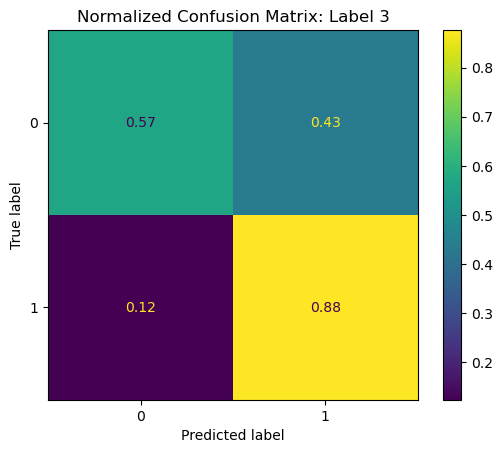

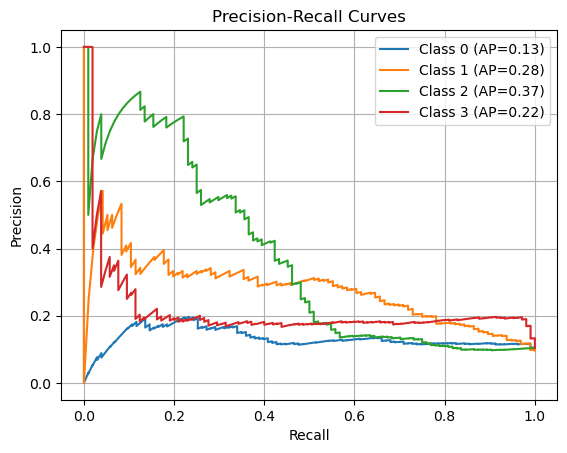

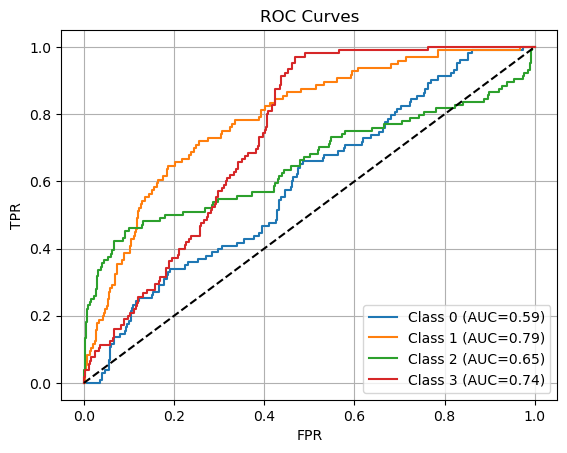

              precision    recall  f1-score   support

    negative       0.84      0.33      0.47       593
    positive       0.48      0.91      0.63       408

    accuracy                           0.56      1001
   macro avg       0.66      0.62      0.55      1001
weighted avg       0.70      0.56      0.54      1001



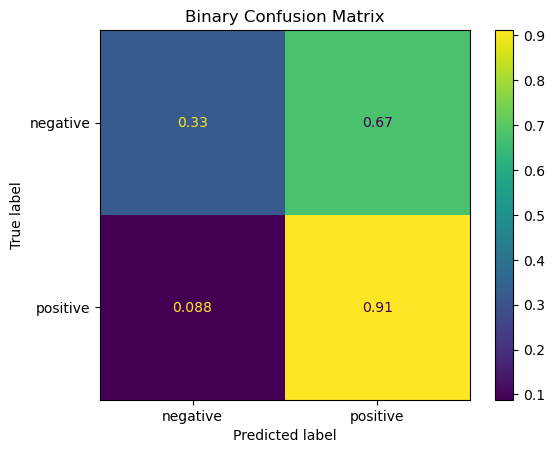

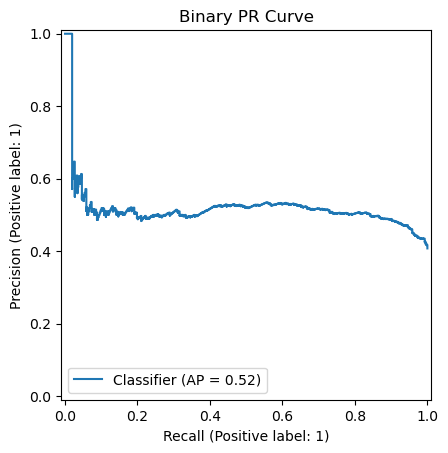

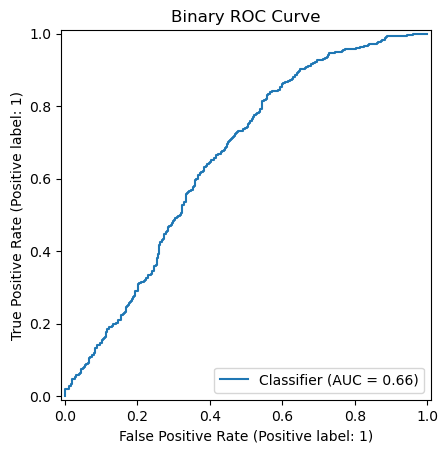

In [1019]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [239]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.84      0.34      0.48       593
           1       0.29      0.05      0.08       104
           2       0.17      0.25      0.20       105
           3       0.00      0.00      0.00         0
           4       0.23      0.15      0.18       103
           5       0.24      0.25      0.24        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.27      1001
   macro avg       0.14      0.08      0.09      1001
weighted avg       0.59      0.27      0.35      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


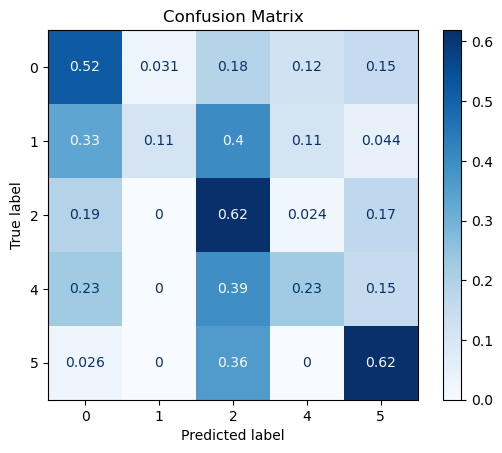

In [240]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case 2

In [918]:
extended_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[],
     pool_sizes=[],
    sensor_shape=(128, 6),
     in_channels=1)

In [919]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-7,
                      weight_decay=1e-1)


extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label['train_ext'],
                                        loaders_label['val_ext'],
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [920]:
history_extended_cnn = extended_cnn.fit(500)

### Starting ExtendedCNNStandartData_fuzzy_phoenix_20250616_170335
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: None
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.1839/0.1742 — lr 1.0e-07
                                              micro_f1       :  0.2648 | macro_f1       :  0.2047 | micro_precision:  0.2043
                                              micro_recall   :  0.3760 | roc_auc_macro  :  0.4593 | roc_auc_micro  :  0.4526
Epoch 002 — loss 0.1818/0.1740 — lr 1.0e-07
                                              micro_f1       :  0.2658 | macro_f1       :  0.2054 | micro_precision:  0.2056
                                              micro_recall   :  0.3760 | roc_auc_macro  :  0.4619 | roc_auc_micro  :  0.4546
Epoch 003 — loss 0.1816/0.1737 — lr 1.0e-07
                                              micro_f1       :  0.2665 | macro_f1       :

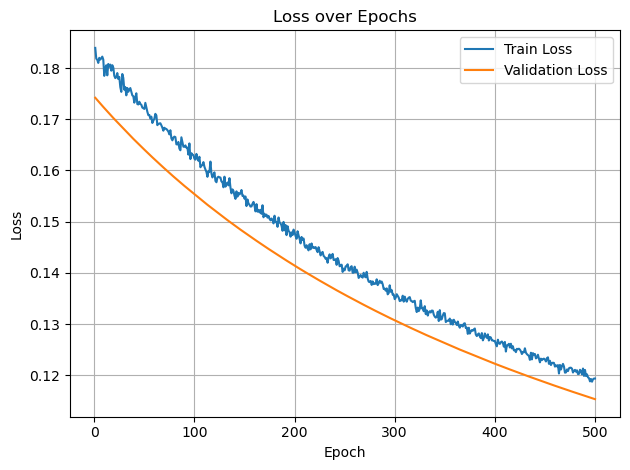

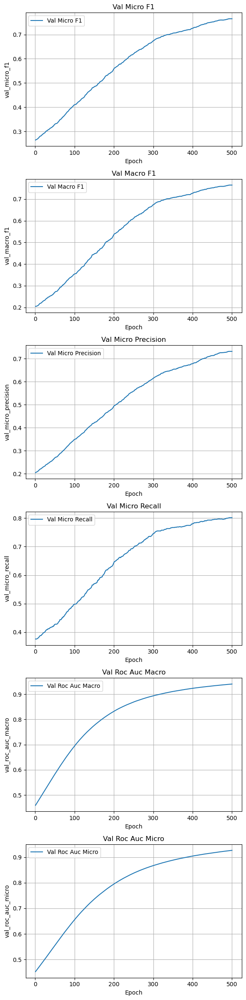

In [921]:
reports.plot_history(history_extended_cnn)

In [922]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model, loaders_label['test_ext'])

In [923]:
accuracy_score(y_true, y_pred)

0.1968031968031968

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.14      0.17      0.15       103
           1       0.12      0.80      0.20        96
           2       0.26      0.31      0.28       104
           3       0.23      0.10      0.14       105

   micro avg       0.14      0.34      0.20       408
   macro avg       0.19      0.35      0.20       408
weighted avg       0.19      0.34      0.20       408
 samples avg       0.11      0.14      0.12       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


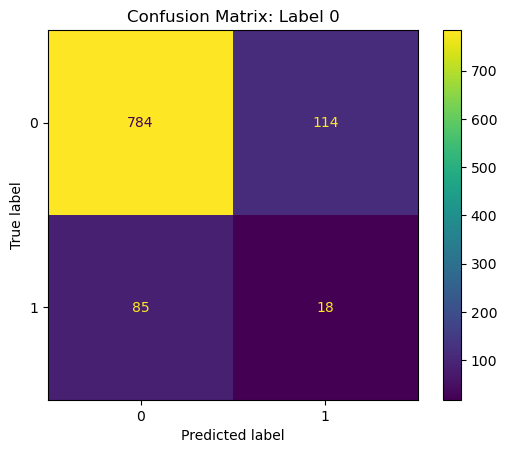

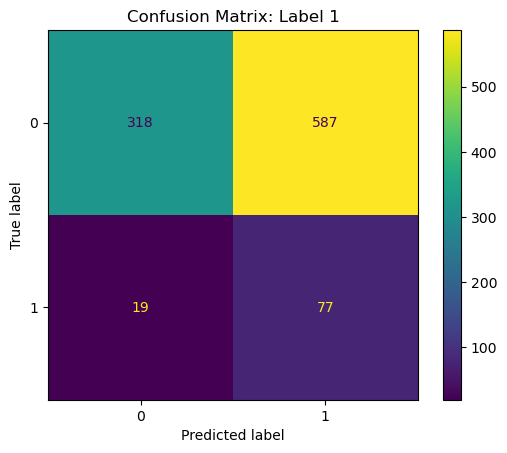

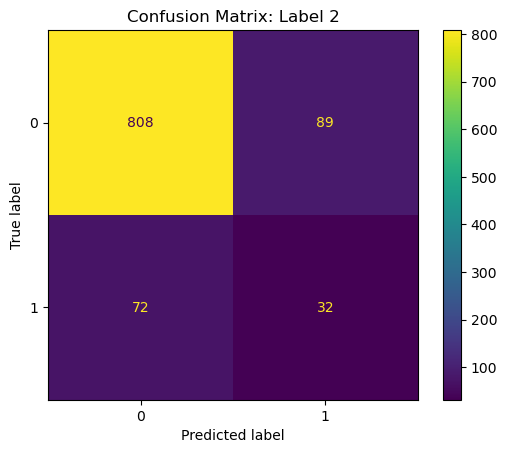

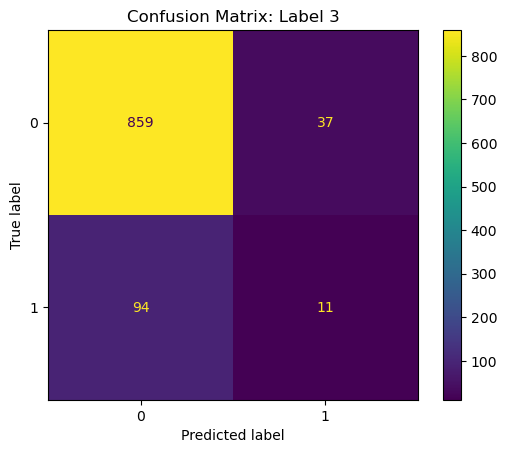

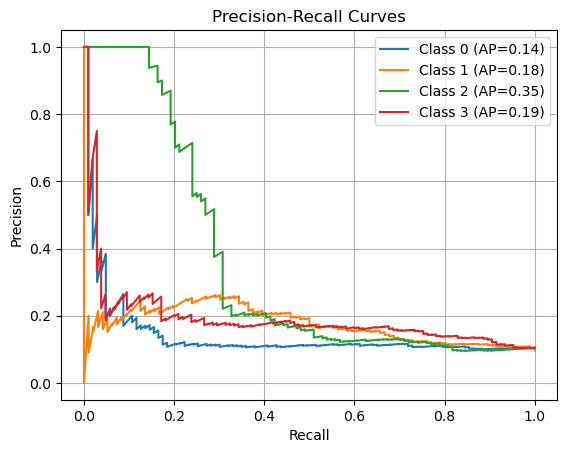

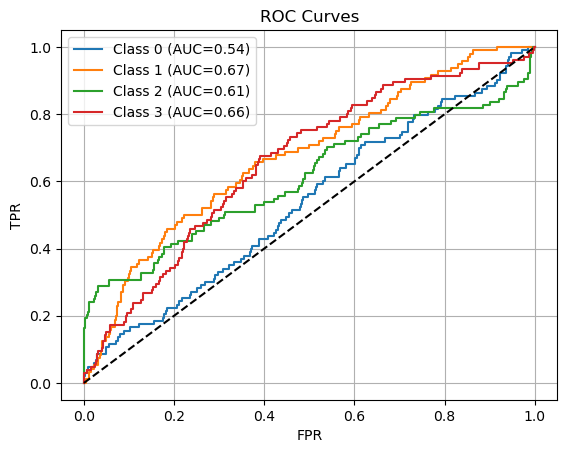

              precision    recall  f1-score   support

    negative       0.51      0.19      0.28       593
    positive       0.38      0.74      0.51       408

    accuracy                           0.41      1001
   macro avg       0.45      0.46      0.39      1001
weighted avg       0.46      0.41      0.37      1001



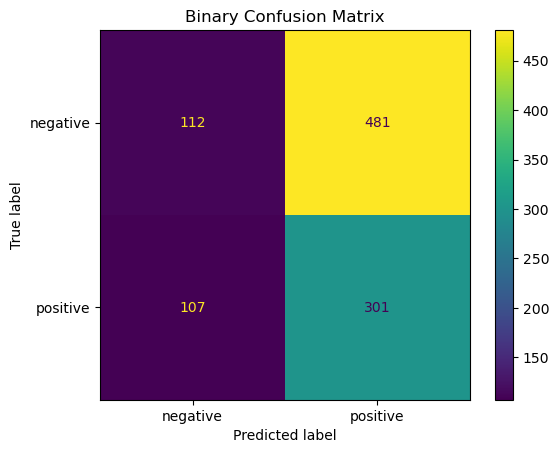

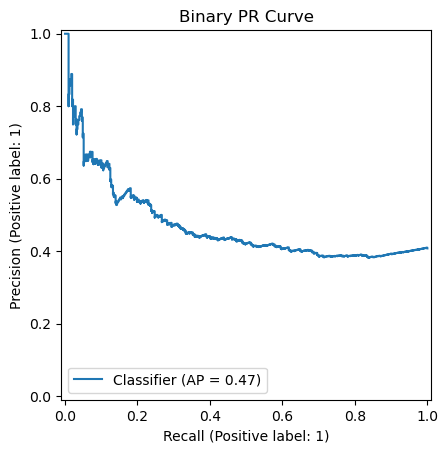

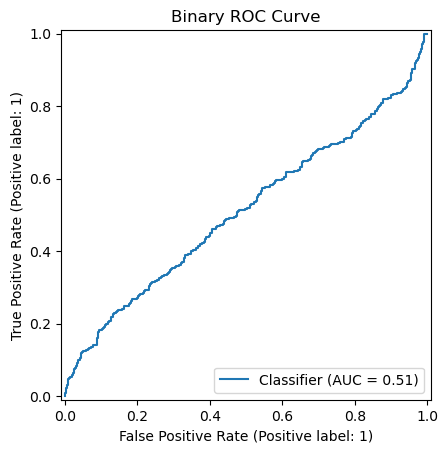

In [924]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [865]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00     593.0
           1       0.00      0.00      0.00     104.0
           2       0.00      0.00      0.00     105.0
           3       0.00      0.00      0.00       0.0
           4       0.00      0.00      0.00     103.0
           5       0.00      0.00      0.00      96.0
           8       0.00      0.00      0.00       0.0
          10       0.00      0.00      0.00       0.0
          11       0.00      0.00      0.00       0.0

    accuracy                           0.00    1001.0
   macro avg       0.00      0.00      0.00    1001.0
weighted avg       0.00      0.00      0.00    1001.0



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/s

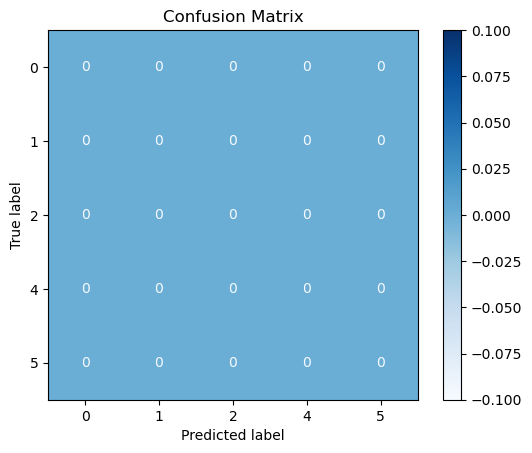

In [866]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

In [819]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

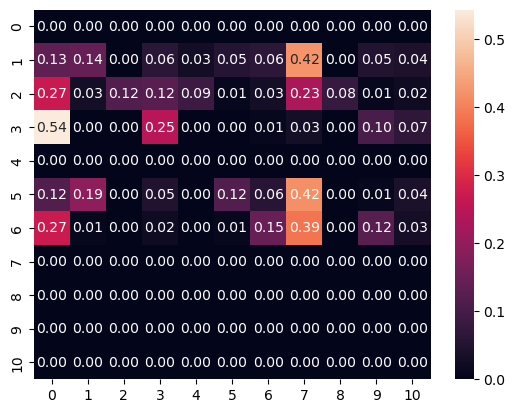

In [814]:
sns.heatmap(confusion_matrix(y_true_c, y_pred_c, normalize='true'), annot=True, fmt='.2f')
plt.show()

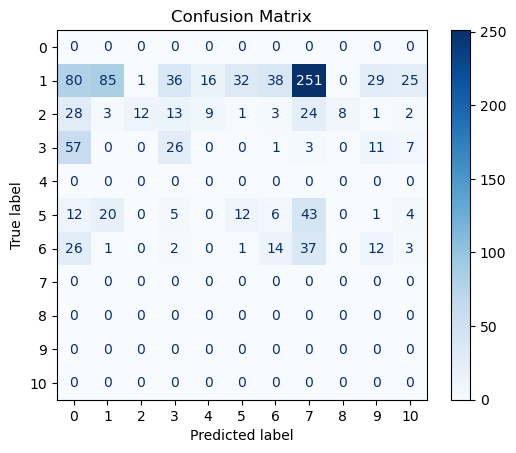

In [821]:
cm = confusion_matrix(y_true_c, y_pred_c, normalize=None)
disp = ConfusionMatrixDisplay(cm)
fig, ax = plt.subplots(); disp.plot(ax=ax, cmap='Blues'); plt.title('Confusion Matrix'); plt.show()

## Pesistance Case

In [276]:
pers_cnn_model = models.ConfigurableTwoBranchCNN(
     sensor_shape=(20, 20),
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     in_channels=2)

In [277]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2)

optimizer = optim.Adam(pers_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
pers_cnn = learners.MultiLabelLearner(pers_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label['train_ext_pers'],
                                        loaders_label['val_ext_pers'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedPersCNNStandartData')
                                        
                                        

In [278]:
history_pers_cnn = pers_cnn.fit(500)

Starting run 'ExtendedPersCNNStandartData_sparse_voyager_20250613_190148' with parameters:
  run_name: ExtendedPersCNNStandartData_sparse_voyager_20250613_190148
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.1666/0.1582 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5729 | roc_auc_micro  :  0.5533
Epoch 002 — loss 0.1498/0.1400 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5644 | roc_auc_micro  :  0.5664
Epoch 003 — loss 0.1388/0

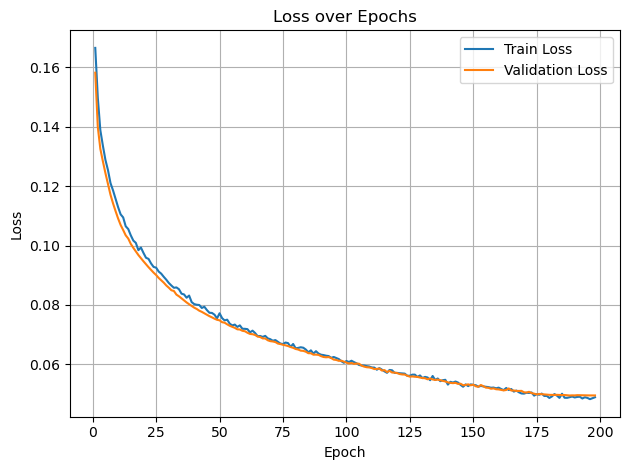

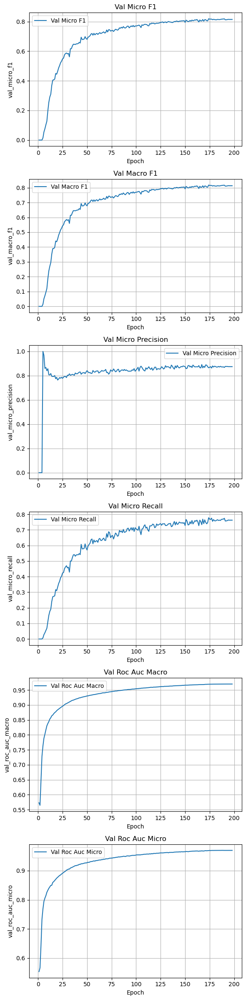

In [279]:
reports.plot_history(history_pers_cnn)

In [282]:
y_true, y_pred, y_score = reports.predict_multilabel(pers_cnn_model, loaders_label['test_ext_pers'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.10      0.28      0.14       103
           1       0.10      0.11      0.11        96
           2       0.14      0.21      0.17       104
           3       0.18      0.25      0.21       105

   micro avg       0.12      0.22      0.16       408
   macro avg       0.13      0.21      0.16       408
weighted avg       0.13      0.22      0.16       408
 samples avg       0.06      0.09      0.07       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


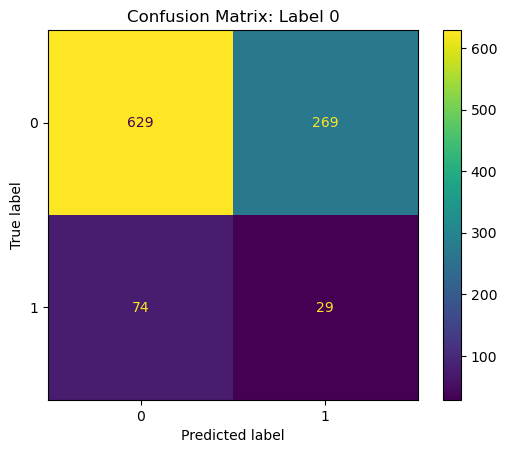

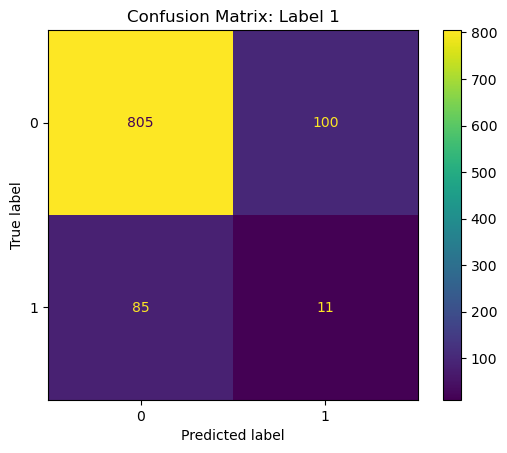

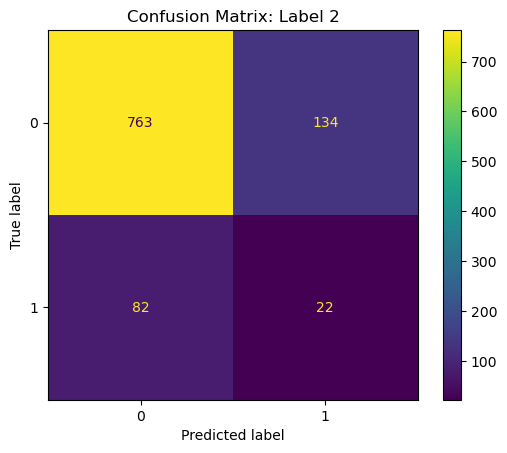

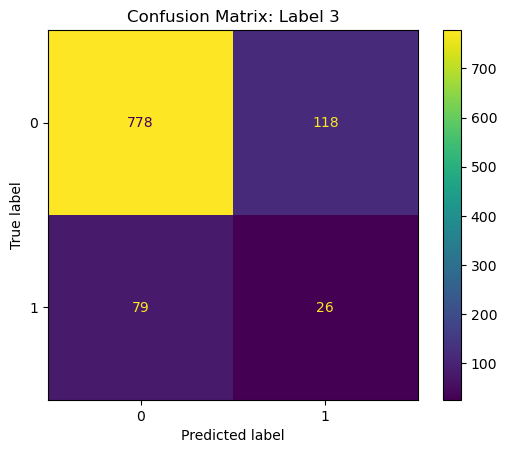

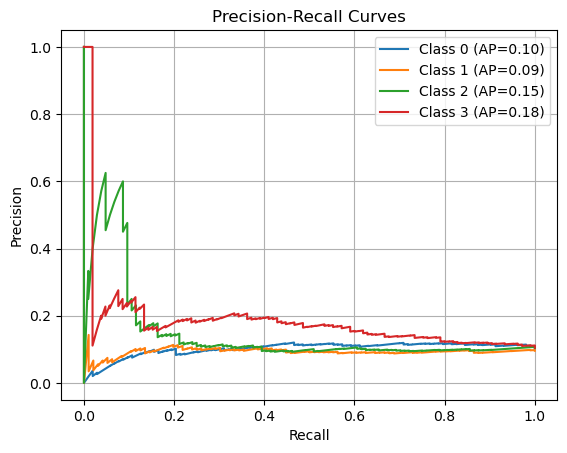

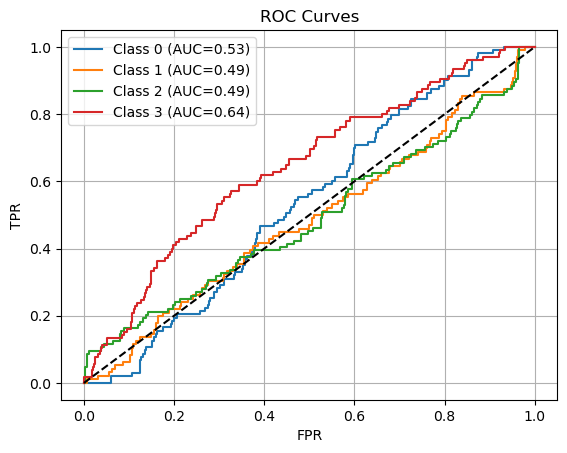

              precision    recall  f1-score   support

    negative       0.57      0.48      0.52       593
    positive       0.38      0.47      0.42       408

    accuracy                           0.48      1001
   macro avg       0.48      0.48      0.47      1001
weighted avg       0.49      0.48      0.48      1001



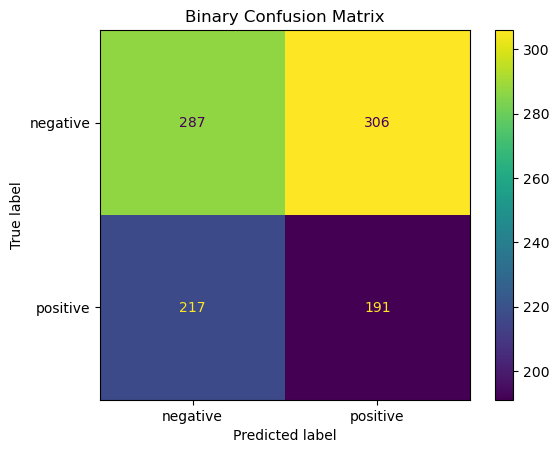

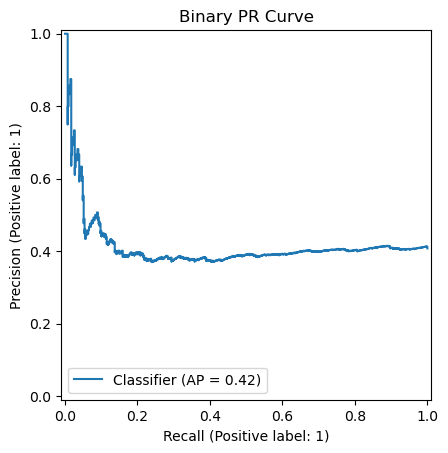

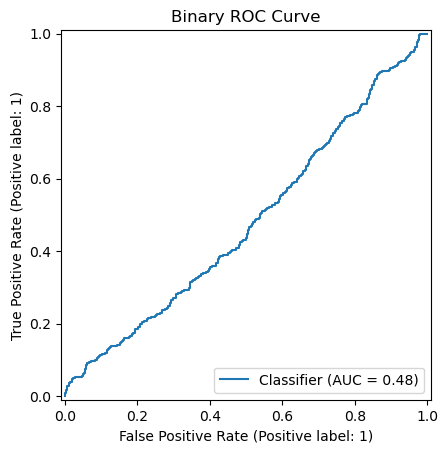

In [283]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [284]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.57      0.48      0.52       593
           1       0.31      0.12      0.17       104
           2       0.11      0.03      0.05       105
           3       0.00      0.00      0.00         0
           4       0.11      0.18      0.14       103
           5       0.11      0.08      0.09        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0

    accuracy                           0.33      1001
   macro avg       0.10      0.07      0.08      1001
weighted avg       0.40      0.33      0.36      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


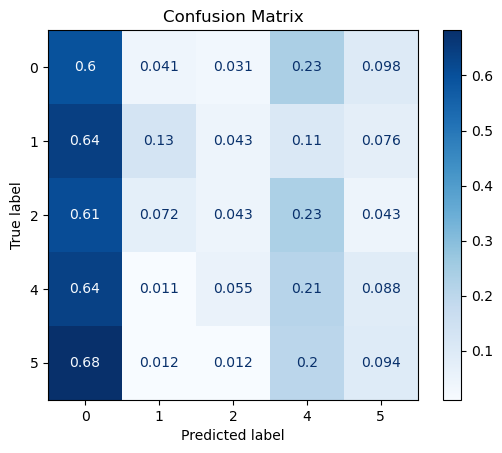

In [285]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

# DVBAE

In [261]:
X_train_sensor = np.stack(X_train["sensor_data"].values)[:,None,:,:].astype(np.float32) 
ds_dbvae = data.NumpyDataset(X_train_sensor, y_train.values)

In [262]:
dbvae = models.DBVAE(latent_dim=64, num_classes=12)

In [263]:
learners.train_dbvae(dbvae, ds_dbvae, lr=1e-3,  epochs=100)

Epoch 1/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.29it/s]


Epoch 1 avg loss: 5746.5027


Epoch 2/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.52it/s]


Epoch 2 avg loss: 6554.2538


Epoch 3/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.46it/s]


Epoch 3 avg loss: 6888.2076


Epoch 4/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.45it/s]


Epoch 4 avg loss: 5682.6052


Epoch 5/100: 100%|█████████████████████| 23/23 [00:01<00:00, 16.83it/s]


Epoch 5 avg loss: 5134.4142


Epoch 6/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.24it/s]


Epoch 6 avg loss: 1969.4341


Epoch 7/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.47it/s]


Epoch 7 avg loss: 1933.3657


Epoch 8/100: 100%|█████████████████████| 23/23 [00:01<00:00, 16.99it/s]


Epoch 8 avg loss: 1570.9291


Epoch 9/100: 100%|█████████████████████| 23/23 [00:01<00:00, 17.25it/s]


Epoch 9 avg loss: 1824.0162


Epoch 10/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.39it/s]


Epoch 10 avg loss: 1686.7037


Epoch 11/100: 100%|████████████████████| 23/23 [00:01<00:00, 13.68it/s]


Epoch 11 avg loss: 1139.5241


Epoch 12/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.16it/s]


Epoch 12 avg loss: 1126.0310


Epoch 13/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.29it/s]


Epoch 13 avg loss: 1301.1217


Epoch 14/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.47it/s]


Epoch 14 avg loss: 1112.8758


Epoch 15/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.41it/s]


Epoch 15 avg loss: 1315.3756


Epoch 16/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.62it/s]


Epoch 16 avg loss: 1213.9090


Epoch 17/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.29it/s]


Epoch 17 avg loss: 968.3286


Epoch 18/100: 100%|████████████████████| 23/23 [00:02<00:00, 10.33it/s]


Epoch 18 avg loss: 1272.9157


Epoch 19/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.65it/s]


Epoch 19 avg loss: 1442.8652


Epoch 20/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.15it/s]


Epoch 20 avg loss: 1361.4021


Epoch 21/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.52it/s]


Epoch 21 avg loss: 766.4720


Epoch 22/100: 100%|████████████████████| 23/23 [00:01<00:00, 17.10it/s]


Epoch 22 avg loss: 987.3386


Epoch 23/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.49it/s]


Epoch 23 avg loss: 1100.2784


Epoch 24/100: 100%|████████████████████| 23/23 [00:01<00:00, 16.87it/s]


Epoch 24 avg loss: 1129.4477


Epoch 25/100:  30%|██████▍              | 7/23 [00:00<00:01, 14.46it/s]


KeyboardInterrupt: 

In [264]:
sampler = learners.compute_debiasing_sampler(dbvae, ds_dbvae)

In [267]:
pd.Series(sampler.weights).describe()

count    2837.000000
mean        1.000000
std         0.656634
min         0.470614
25%         0.676958
50%         0.811501
75%         1.059922
max        10.871705
dtype: float64

In [676]:
loaders_class_w = data.build_all_loaders(X_train, y_train.values,
                                       X_val, y_val.values,
                                       X_test, y_test,
                                       train_sampler=sampler,
                                       sensor_key='sensor_data', 
                                       pers_key='pers_image',
                                       aux_cols=AUX_COLS, 
                                       ext_aux_cols=AUX_COLS_EXT)

In [269]:
loaders_class.keys()

dict_keys(['train', 'val', 'test', 'train_ext', 'val_ext', 'test_ext', 'train_pers', 'val_pers', 'test_pers', 'train_ext_pers', 'val_ext_pers', 'test_ext_pers'])

In [270]:
loaders_label_w = data.build_all_loaders(X_train, y_train_v,
                                       X_val, y_val_v,
                                       X_test, y_test_v,
                                       train_sampler=sampler,
                                       sensor_key='sensor_data', 
                                       pers_key='pers_image',
                                       aux_cols=AUX_COLS, 
                                       ext_aux_cols=AUX_COLS_EXT)

In [14]:
loaders_label.keys()

dict_keys(['train', 'val', 'test', 'train_ext', 'val_ext', 'test_ext', 'train_pers', 'val_pers', 'test_pers', 'train_ext_pers', 'val_ext_pers', 'test_ext_pers'])

# WEIGHTED 2D CNN

## Standart Case 1

In [297]:
simple_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     sensor_shape=(128, 6),
     in_channels=1)

In [299]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2)

optimizer = optim.Adam(simple_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 cooldown=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)

simple_cnn = learners.MultiLabelLearner(simple_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train'],
                                        loaders_label_w['val'],
                                        metrics=metrics_labels,
                                        scheduler=scheduler,
                                        model_name='WheightedCNNStandartData')
                                        
                                        

In [300]:
history_simple_cnn = simple_cnn.fit(500)

Starting run 'SimpleCNNStandartData_mystic_bear_20250615_152258' with parameters:
  run_name: SimpleCNNStandartData_mystic_bear_20250615_152258
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.1605/0.1538 — lr 1.0e-05
                                              micro_f1       :  0.0055 | macro_f1       :  0.0056 | micro_precision:  0.6000
                                              micro_recall   :  0.0028 | roc_auc_macro  :  0.5808 | roc_auc_micro  :  0.5490
Epoch 002 — loss 0.1499/0.1424 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5947 | roc_auc_micro  :  0.5957
Epoch 003 — loss 0.1444/0.1362 — lr 1.0e-05

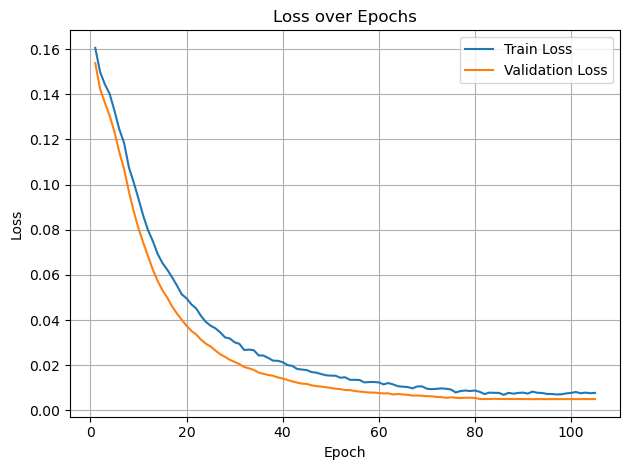

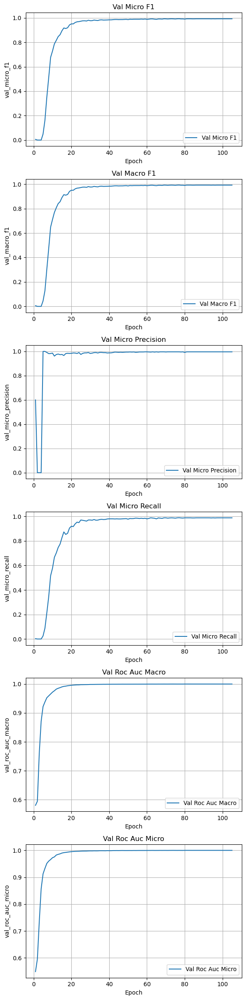

In [301]:
reports.plot_history(history_simple_cnn)

In [167]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_cnn_model, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.15      0.74      0.25       103
           1       0.19      0.57      0.29        96
           2       0.57      0.53      0.55       104
           3       0.20      0.53      0.29       105

   micro avg       0.21      0.59      0.31       408
   macro avg       0.28      0.59      0.34       408
weighted avg       0.28      0.59      0.34       408
 samples avg       0.16      0.24      0.18       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


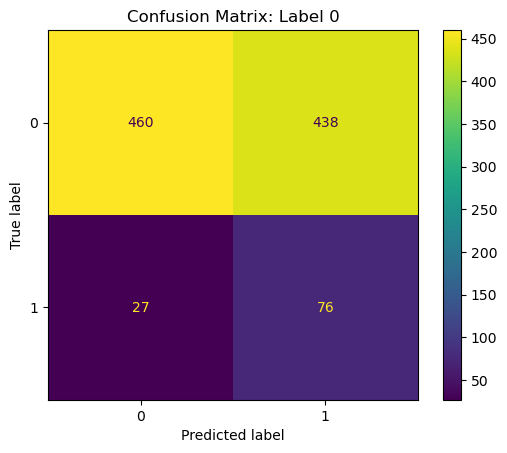

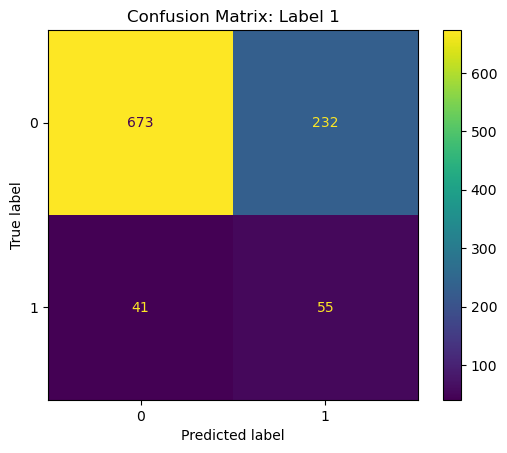

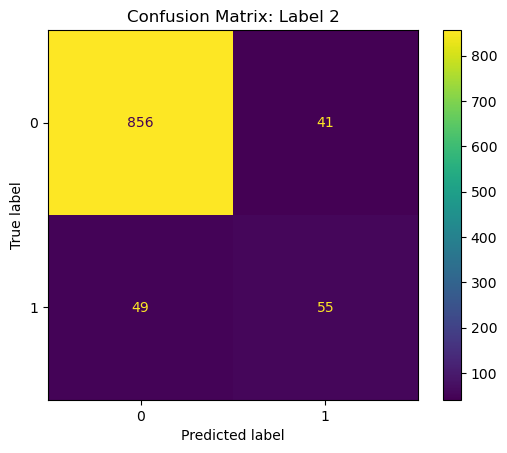

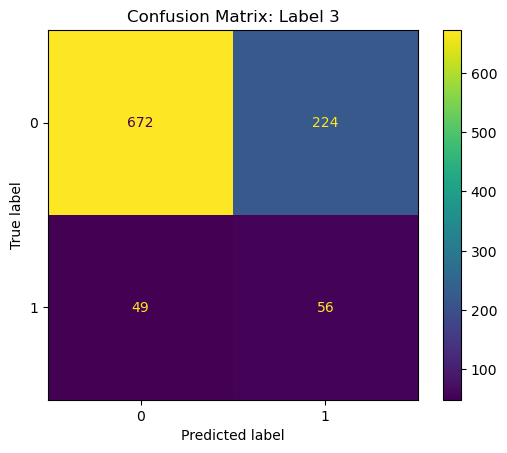

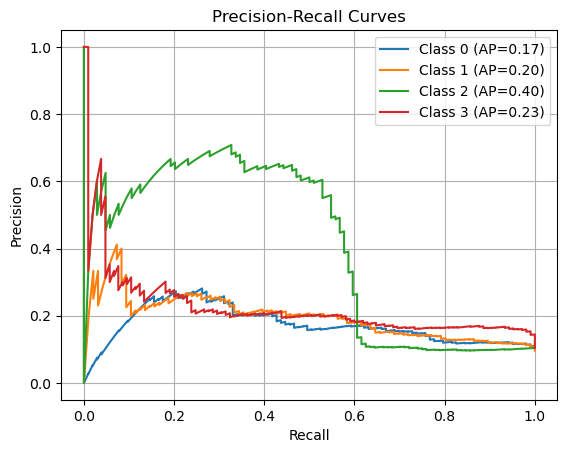

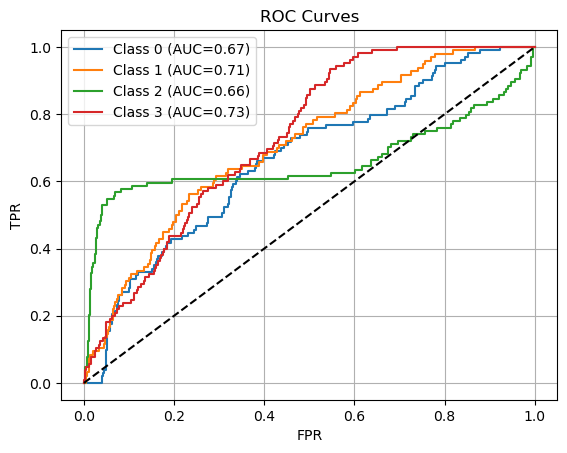

              precision    recall  f1-score   support

    negative       0.69      0.35      0.46       593
    positive       0.45      0.77      0.57       408

    accuracy                           0.52      1001
   macro avg       0.57      0.56      0.51      1001
weighted avg       0.59      0.52      0.50      1001



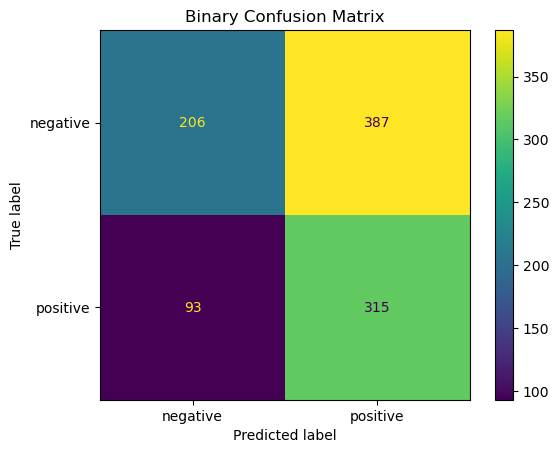

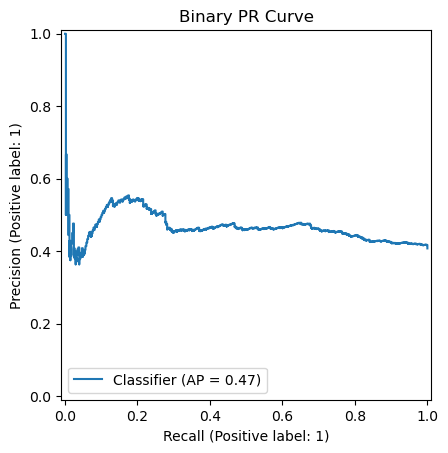

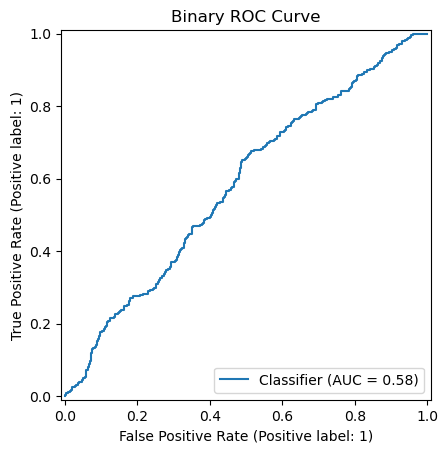

In [168]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [302]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.57      0.48      0.52       593
           1       0.31      0.12      0.17       104
           2       0.11      0.03      0.05       105
           3       0.00      0.00      0.00         0
           4       0.11      0.18      0.14       103
           5       0.11      0.08      0.09        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0

    accuracy                           0.33      1001
   macro avg       0.10      0.07      0.08      1001
weighted avg       0.40      0.33      0.36      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


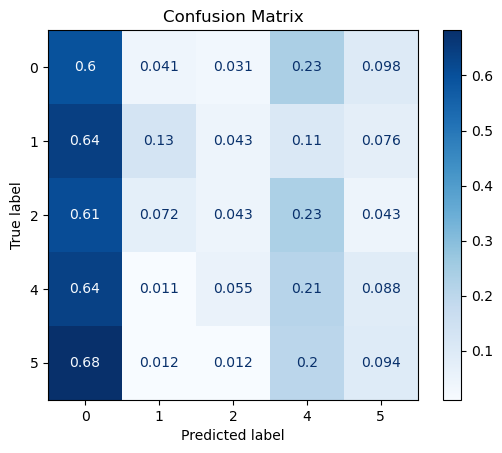

In [303]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Standart Case 2

In [326]:
simple_cnn_model_2 = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),

     in_channels=1)

In [327]:
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

optimizer = optim.Adam(simple_cnn_model_2.parameters(),
                      lr=1e-5)



simple_cnn_2 = learners.MultiLabelLearner(simple_cnn_model_2,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train'],
                                        loaders_label_w['val'],
                                        patience=5,
                                        metrics=metrics_labels,
                                        model_name='SimpleCNNStandartData')
                                        
                                        

In [328]:
history_simple_cnn = simple_cnn_2.fit(500)

Starting run 'SimpleCNNStandartData_gentle_bear_20250615_160451' with parameters:
  run_name: SimpleCNNStandartData_gentle_bear_20250615_160451
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: BCEWithLogitsLoss
  scheduler: None
  patience: 5
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 1.1047/1.0698 — lr 1.0e-05
                                              micro_f1       :  0.3614 | macro_f1       :  0.3525 | micro_precision:  0.2330
                                              micro_recall   :  0.8059 | roc_auc_macro  :  0.8468 | roc_auc_micro  :  0.6318
Epoch 002 — loss 1.1094/1.0562 — lr 1.0e-05
                                              micro_f1       :  0.3837 | macro_f1       :  0.3865 | micro_precision:  0.2375
                                              micro_recall   :  0.9991 | roc_auc_macro  :  0.9000 | roc_auc_micro  :  0.7587
Epoch 003 — loss 1.0749/1.0334 — lr 1.0e-05
    

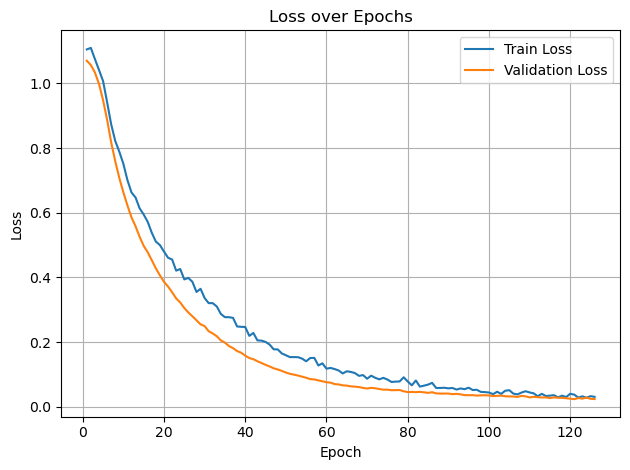

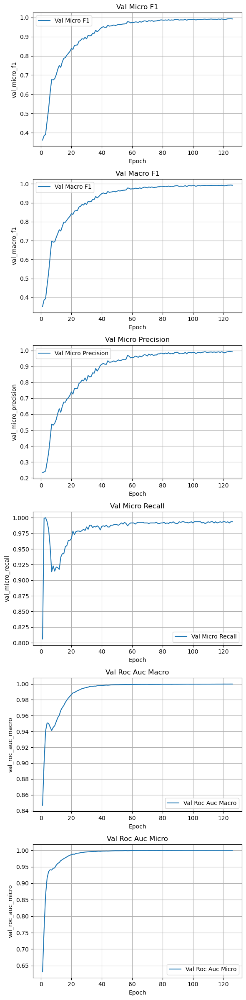

In [329]:
reports.plot_history(history_simple_cnn)

In [330]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_cnn_model_2, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.14      0.69      0.23       103
           1       0.18      0.56      0.27        96
           2       0.29      0.53      0.38       104
           3       0.17      0.97      0.29       105

   micro avg       0.18      0.69      0.28       408
   macro avg       0.20      0.69      0.29       408
weighted avg       0.20      0.69      0.29       408
 samples avg       0.17      0.28      0.20       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


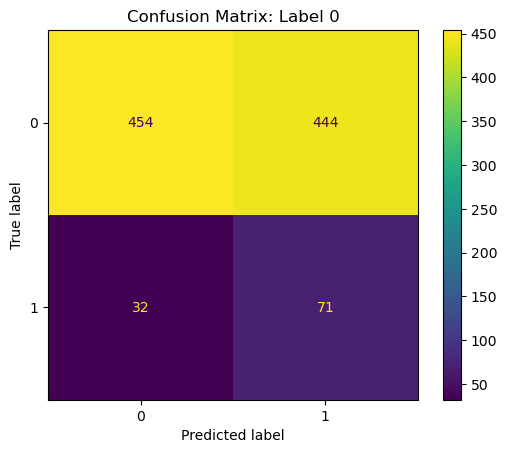

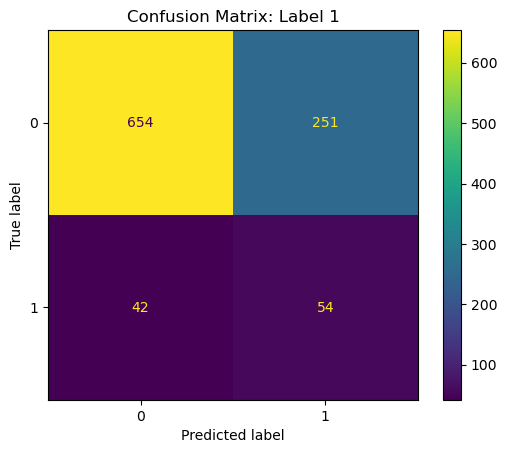

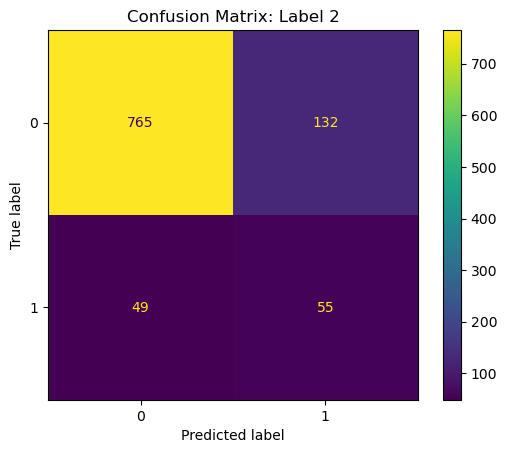

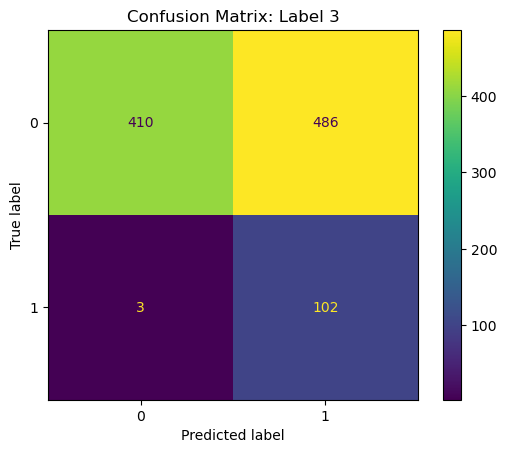

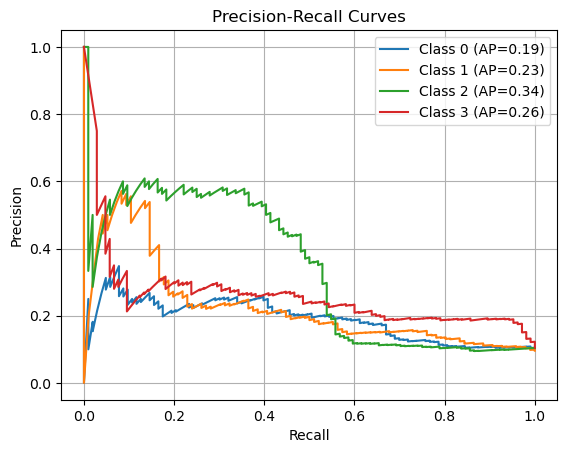

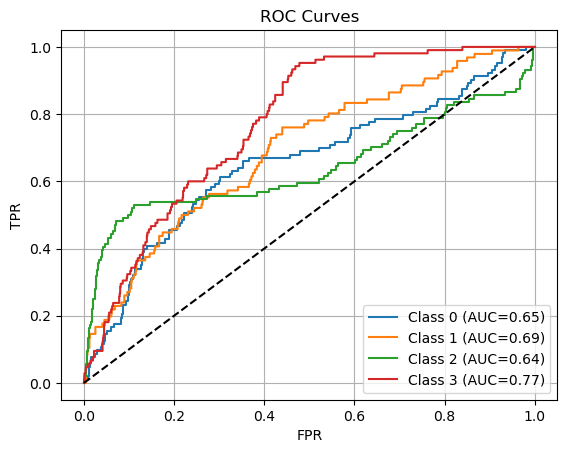

              precision    recall  f1-score   support

    negative       0.91      0.15      0.25       593
    positive       0.44      0.98      0.61       408

    accuracy                           0.49      1001
   macro avg       0.68      0.56      0.43      1001
weighted avg       0.72      0.49      0.40      1001



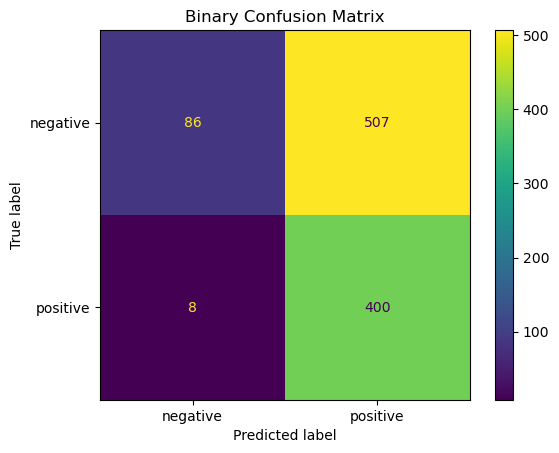

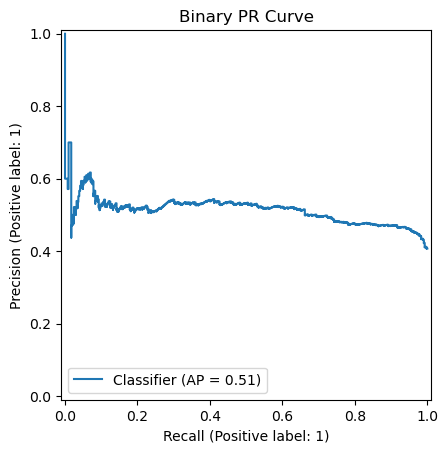

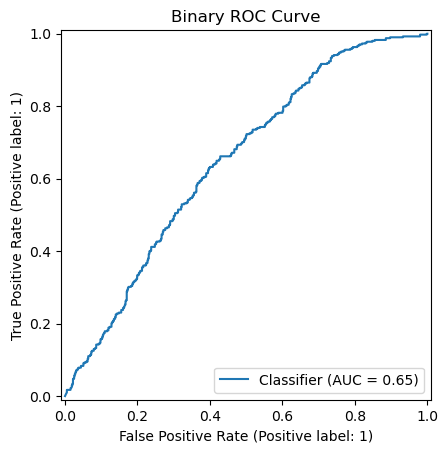

In [331]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [332]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.91      0.15      0.25       593
           1       0.32      0.06      0.10       104
           2       0.19      0.40      0.26       105
           3       0.00      0.00      0.00         0
           4       0.28      0.28      0.28       103
           5       0.36      0.15      0.21        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.18      1001
   macro avg       0.16      0.08      0.08      1001
weighted avg       0.66      0.18      0.23      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


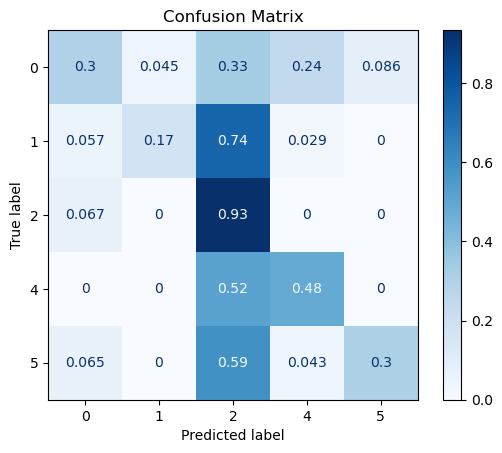

In [333]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case

In [989]:
extended_cnn_model_w = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [990]:
path = "ExtendedCNNStandartData_vivid_nebula_20250615_191828/ExtendedCNNStandartData_vivid_nebula_20250615_191828.pt"
a = torch.load(path, map_location="cpu")
extended_cnn_model_w.load_state_dict(a)

<All keys matched successfully>

In [374]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=7.0)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext'],
                                        loaders_label_w['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [375]:
history_extended_cnn = extended_cnn.fit(500)

Starting run 'ExtendedCNNStandartData_vivid_nebula_20250615_191828' with parameters:
  run_name: ExtendedCNNStandartData_vivid_nebula_20250615_191828
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0054/0.0050 — lr 1.0e-05
                                              micro_f1       :  0.0771 | macro_f1       :  0.0416 | micro_precision:  0.1168
                                              micro_recall   :  0.0576 | roc_auc_macro  :  0.4783 | roc_auc_micro  :  0.4925
Epoch 002 — loss 0.0049/0.0047 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5185 | roc_auc_micro  :  0.5157
Epoch 003 — loss 0.0048/0.0046 — lr 1

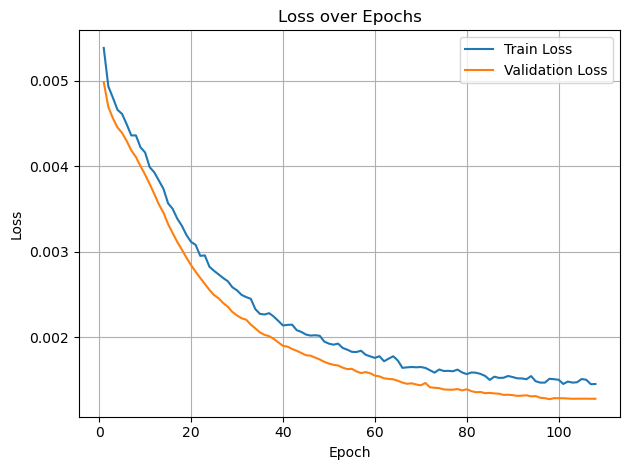

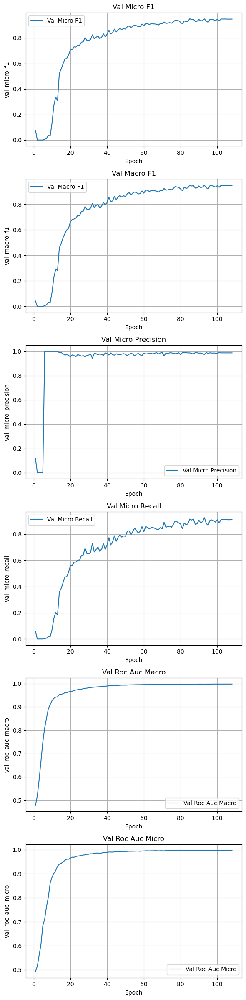

In [376]:
reports.plot_history(history_extended_cnn)

In [1016]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model_w, loaders_label['test_ext'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.17      0.47      0.25       103
           1       0.18      0.71      0.28        96
           2       0.59      0.23      0.33       104
           3       0.28      0.38      0.32       105

   micro avg       0.21      0.44      0.29       408
   macro avg       0.30      0.45      0.30       408
weighted avg       0.31      0.44      0.30       408
 samples avg       0.13      0.18      0.15       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


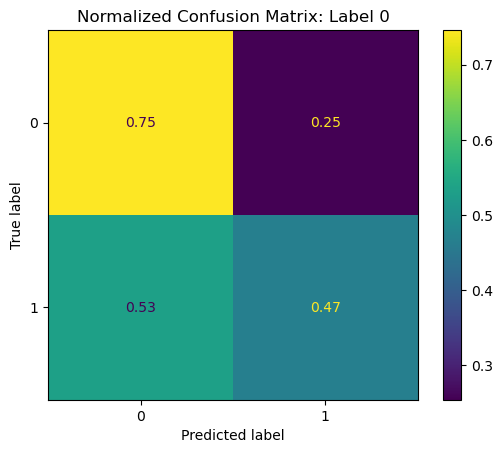

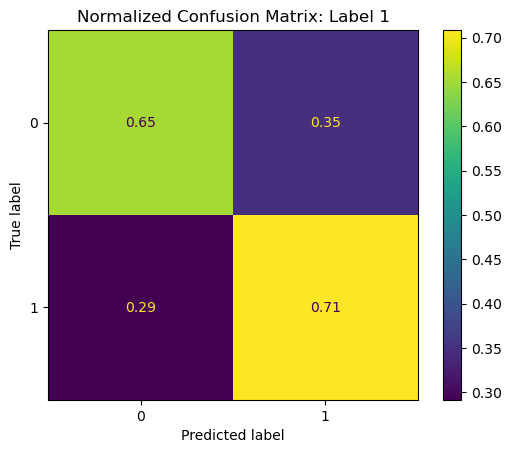

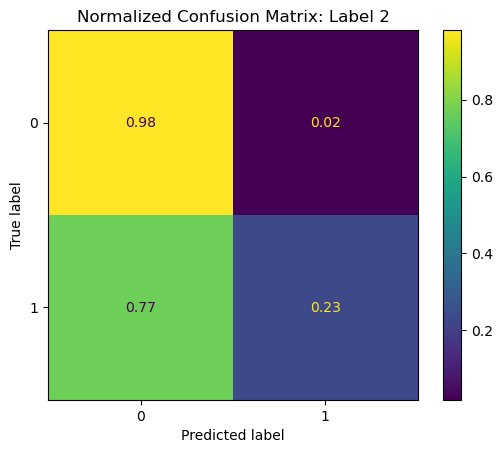

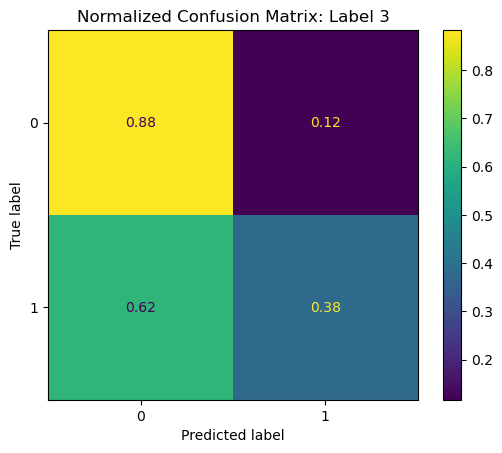

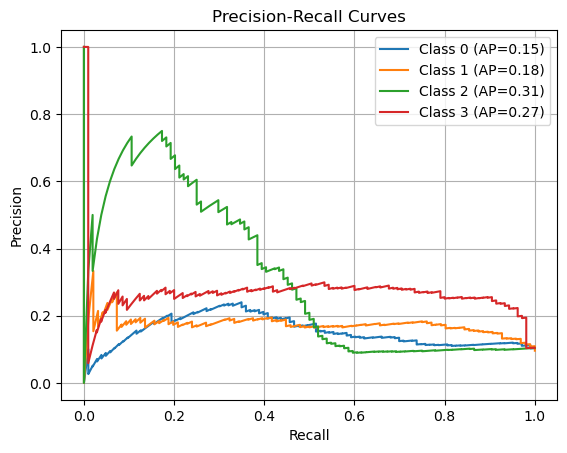

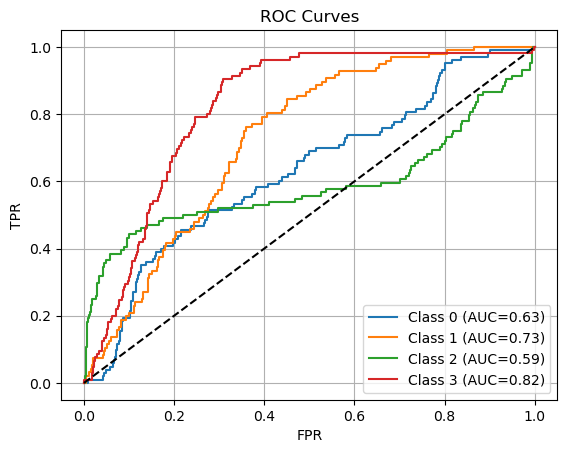

              precision    recall  f1-score   support

    negative       0.72      0.53      0.61       593
    positive       0.51      0.69      0.59       408

    accuracy                           0.60      1001
   macro avg       0.61      0.61      0.60      1001
weighted avg       0.63      0.60      0.60      1001



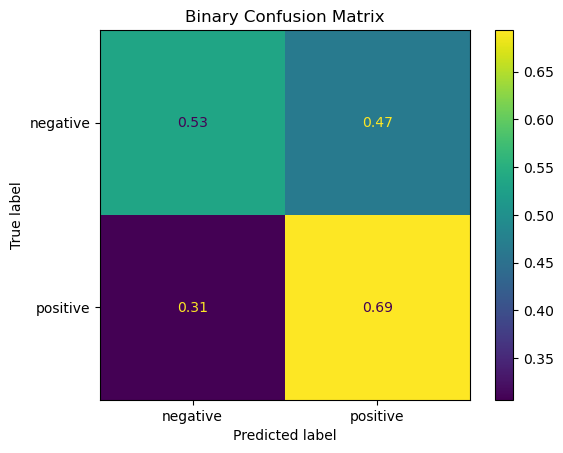

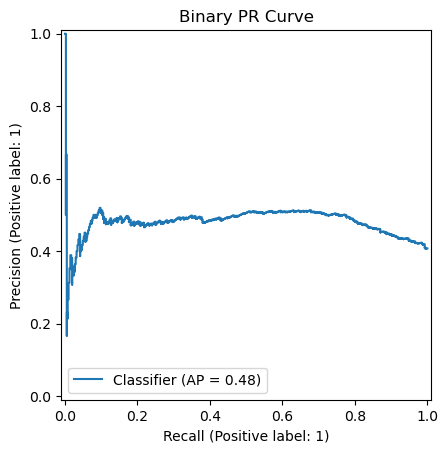

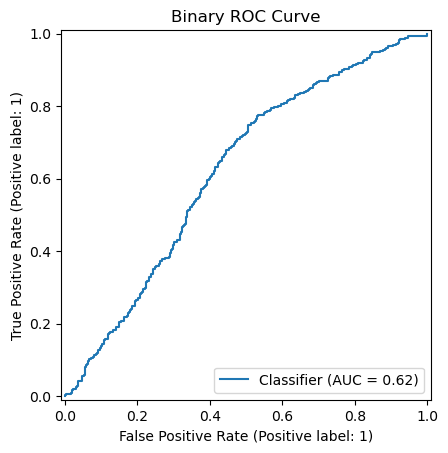

In [1017]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [379]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.73      0.53      0.62       593
           1       0.57      0.19      0.29       104
           2       0.35      0.23      0.28       105
           3       0.00      0.00      0.00         0
           4       0.49      0.36      0.42       103
           5       0.21      0.33      0.25        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.43      1001
   macro avg       0.20      0.14      0.15      1001
weighted avg       0.60      0.43      0.49      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


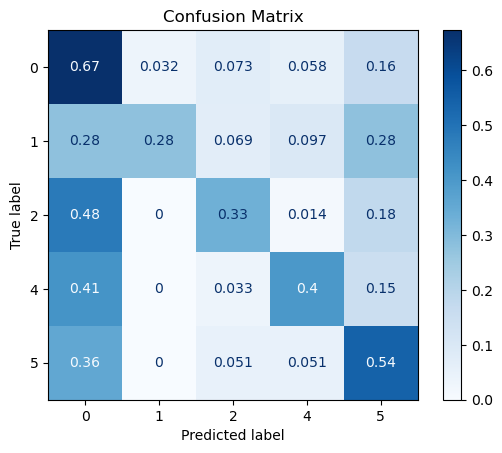

In [380]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case 2

In [462]:
extended_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[64, 128, 256],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [463]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=6.8)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-7)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext'],
                                        loaders_label_w['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [464]:
history_extended_cnn = extended_cnn.fit(500)

Starting run 'ExtendedCNNStandartData_solar_oracle_20250615_213010' with parameters:
  run_name: ExtendedCNNStandartData_solar_oracle_20250615_213010
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0056/0.0051 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.7755 | roc_auc_micro  :  0.7415
Epoch 002 — loss 0.0049/0.0044 — lr 1.0e-05
                                              micro_f1       :  0.1699 | macro_f1       :  0.1497 | micro_precision:  1.0000
                                              micro_recall   :  0.0929 | roc_auc_macro  :  0.9273 | roc_auc_micro  :  0.9154
Epoch 003 — loss 0.0043/0.0036 — lr 1

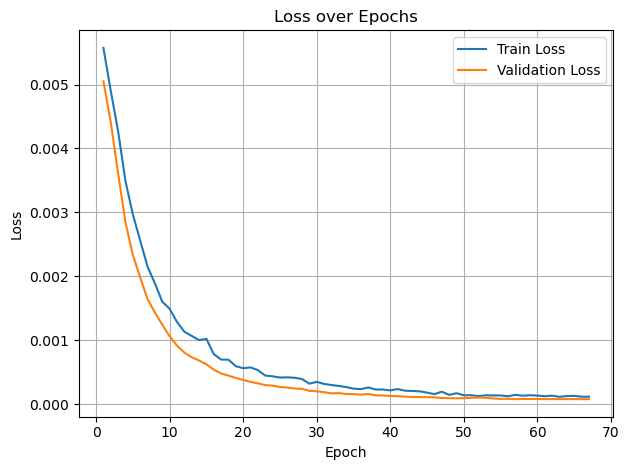

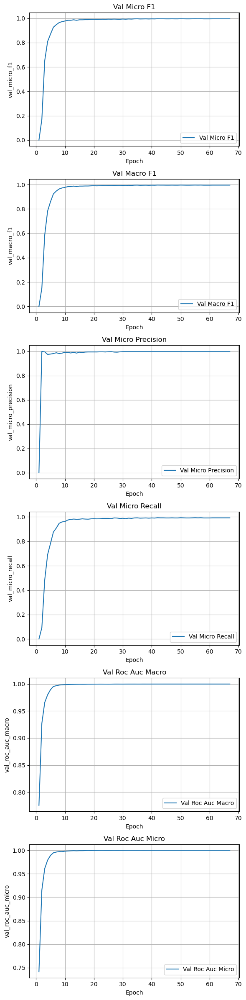

In [465]:
reports.plot_history(history_extended_cnn)

In [466]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model, loaders_label['test_ext'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.13      0.48      0.21       103
           1       0.22      0.65      0.33        96
           2       0.64      0.33      0.43       104
           3       0.16      0.67      0.26       105

   micro avg       0.19      0.53      0.28       408
   macro avg       0.29      0.53      0.31       408
weighted avg       0.29      0.53      0.31       408
 samples avg       0.15      0.21      0.17       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


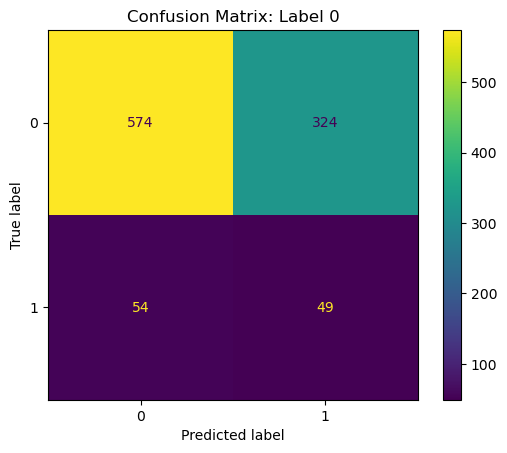

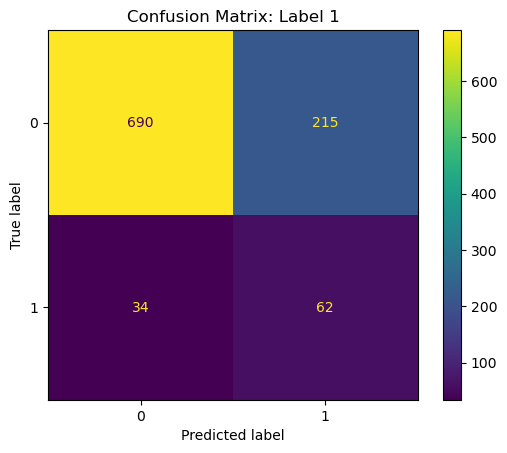

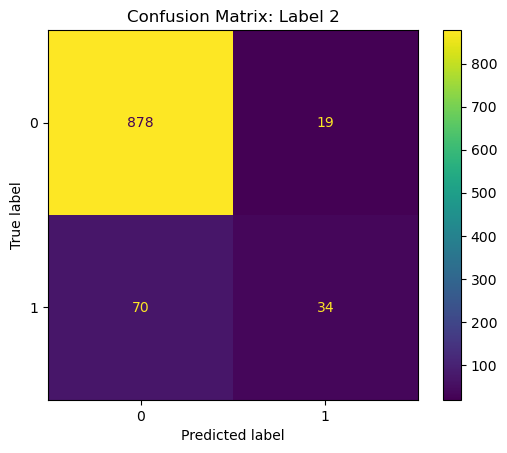

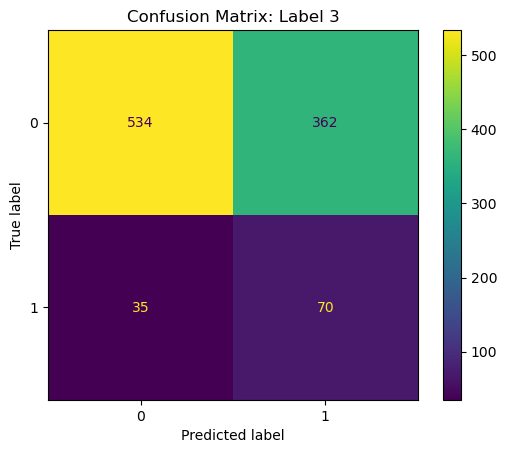

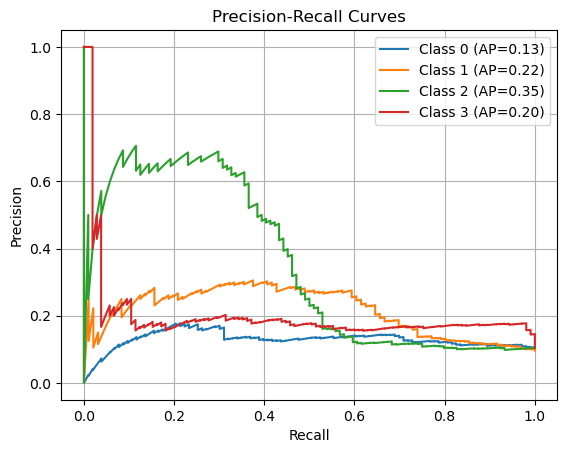

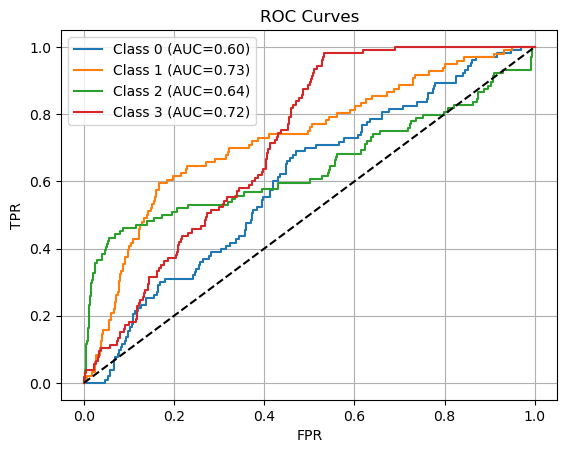

              precision    recall  f1-score   support

    negative       0.78      0.40      0.53       593
    positive       0.49      0.83      0.62       408

    accuracy                           0.58      1001
   macro avg       0.63      0.62      0.57      1001
weighted avg       0.66      0.58      0.57      1001



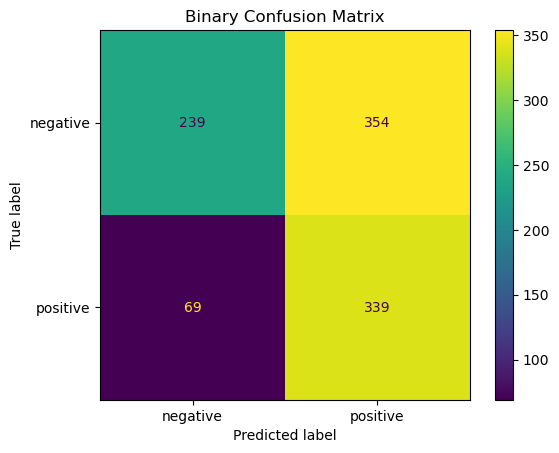

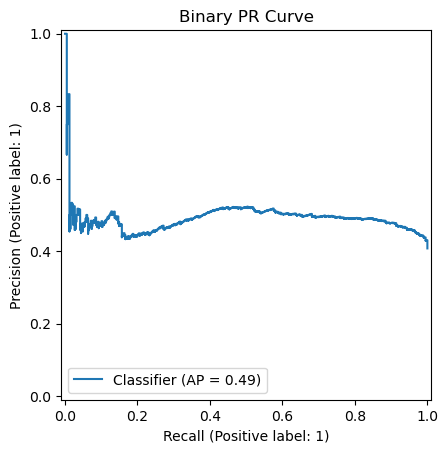

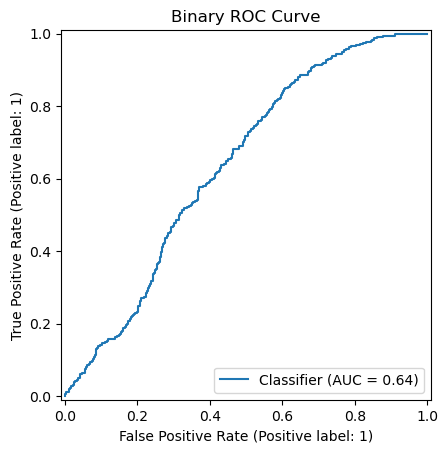

In [467]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [468]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.78      0.40      0.53       593
           1       0.56      0.13      0.22       104
           2       0.22      0.30      0.25       105
           3       0.00      0.00      0.00         0
           4       0.25      0.19      0.22       103
           5       0.32      0.27      0.29        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.33      1001
   macro avg       0.16      0.10      0.12      1001
weighted avg       0.60      0.33      0.41      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


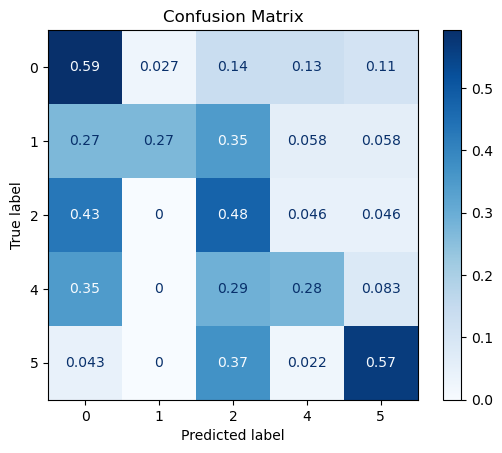

In [469]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Pesistance Case

In [495]:
pers_cnn_model = models.ConfigurableTwoBranchCNN(
     sensor_shape=(20, 20),
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     in_channels=2)

In [496]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=8.0)

optimizer = optim.Adam(pers_cnn_model.parameters(),
                      lr=1e-6,
                      weight_decay=1e-6)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
pers_cnn = learners.MultiLabelLearner(pers_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext_pers'],
                                        loaders_label_w['val_ext_pers'],
                                        patience=5,
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedPersCNNStandartData')
                                        
                                        

In [497]:
history_pers_cnn = pers_cnn.fit(500)

Starting run 'ExtendedPersCNNStandartData_radiant_raven_20250615_214238' with parameters:
  run_name: ExtendedPersCNNStandartData_radiant_raven_20250615_214238
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 5
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0029/0.0029 — lr 1.0e-06
                                              micro_f1       :  0.3466 | macro_f1       :  0.2757 | micro_precision:  0.2255
                                              micro_recall   :  0.7484 | roc_auc_macro  :  0.5681 | roc_auc_micro  :  0.5285
Epoch 002 — loss 0.0029/0.0028 — lr 1.0e-06
                                              micro_f1       :  0.3467 | macro_f1       :  0.2759 | micro_precision:  0.2260
                                              micro_recall   :  0.7447 | roc_auc_macro  :  0.5806 | roc_auc_micro  :  0.5346
Epoch 003 — loss 0.0029/0.00

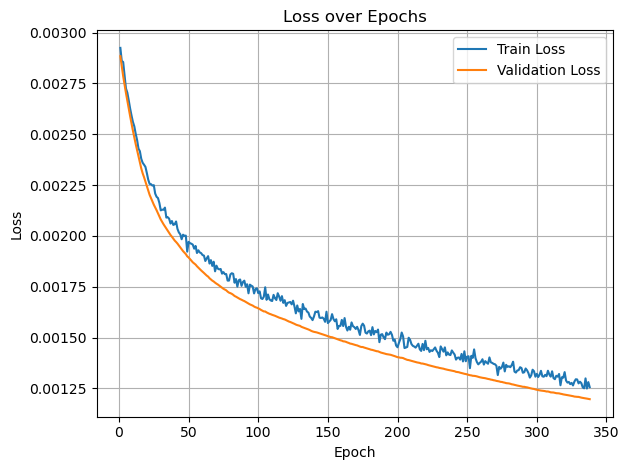

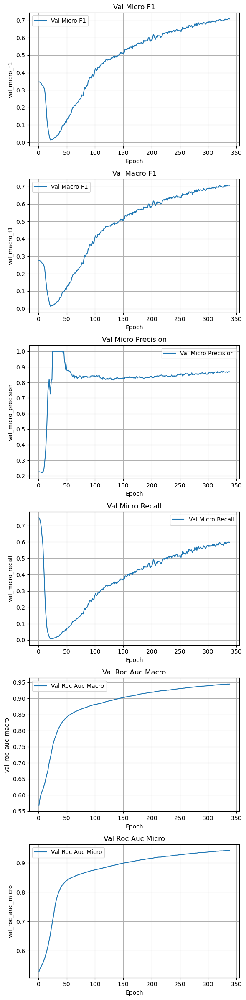

In [498]:
reports.plot_history(history_pers_cnn)

In [499]:
y_true, y_pred, y_score = reports.predict_multilabel(pers_cnn_model, loaders_label['test_ext_pers'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.07      0.10      0.08       103
           1       0.07      0.09      0.08        96
           2       0.17      0.15      0.16       104
           3       0.18      0.20      0.19       105

   micro avg       0.11      0.14      0.12       408
   macro avg       0.12      0.14      0.13       408
weighted avg       0.12      0.14      0.13       408
 samples avg       0.04      0.06      0.05       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


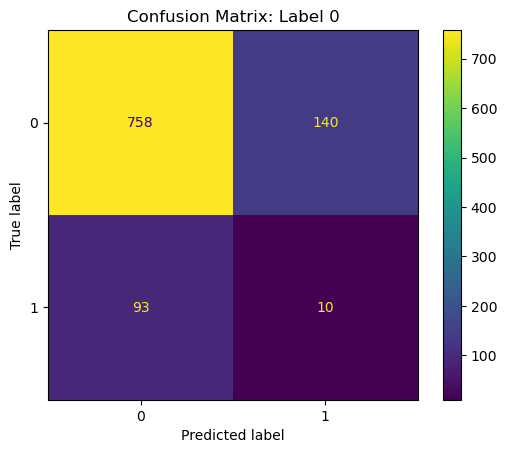

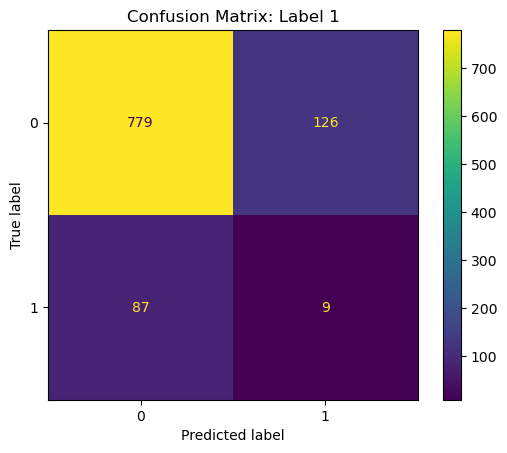

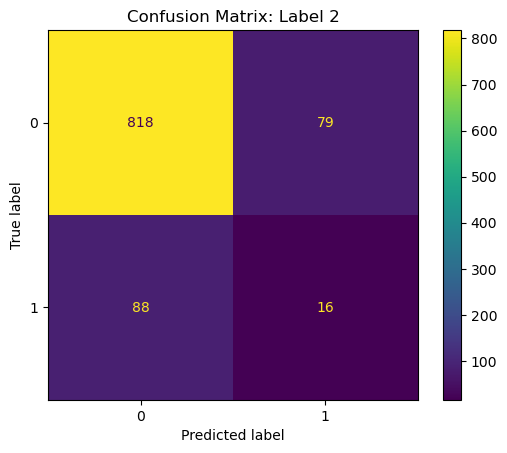

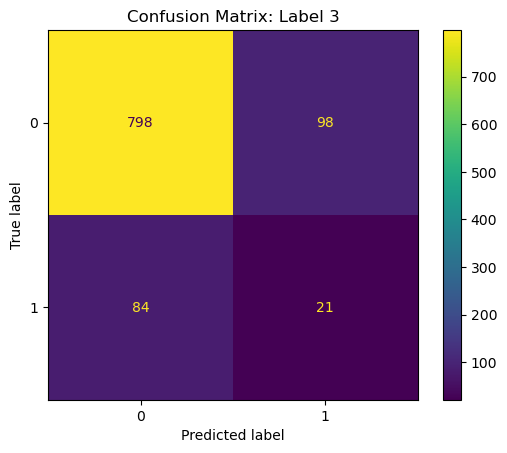

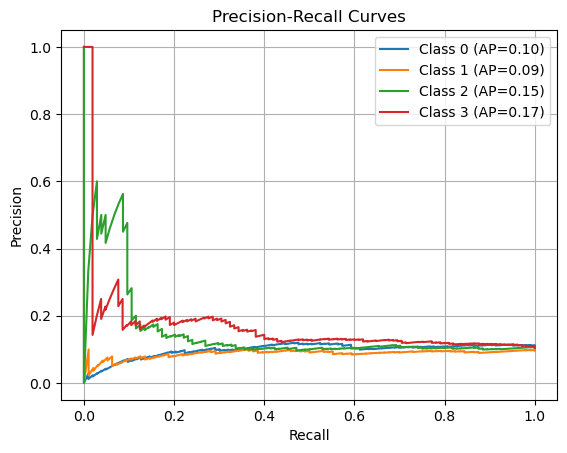

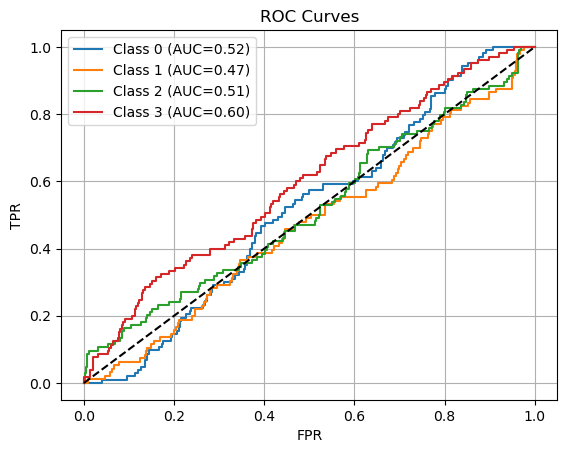

              precision    recall  f1-score   support

    negative       0.56      0.57      0.57       593
    positive       0.37      0.36      0.36       408

    accuracy                           0.49      1001
   macro avg       0.47      0.47      0.47      1001
weighted avg       0.48      0.49      0.48      1001



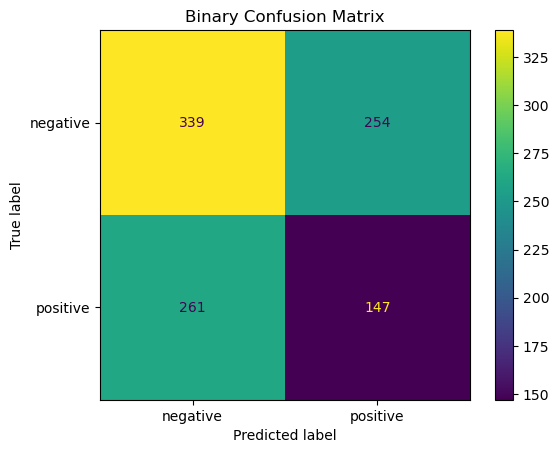

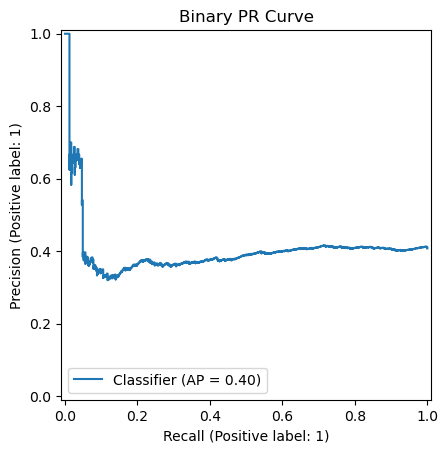

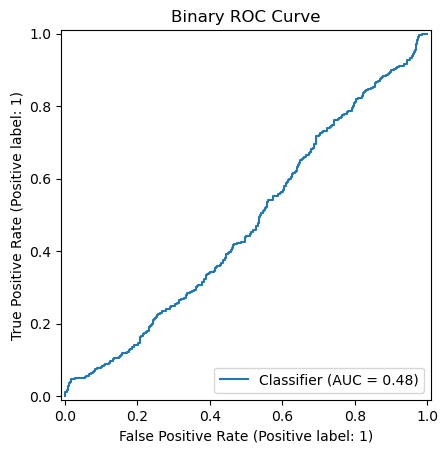

In [500]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [501]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.56      0.57      0.57       593
           1       0.25      0.06      0.09       104
           2       0.11      0.05      0.07       105
           3       0.00      0.00      0.00         0
           4       0.08      0.10      0.09       103
           5       0.07      0.08      0.08        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.37      1001
   macro avg       0.09      0.07      0.07      1001
weighted avg       0.39      0.37      0.37      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


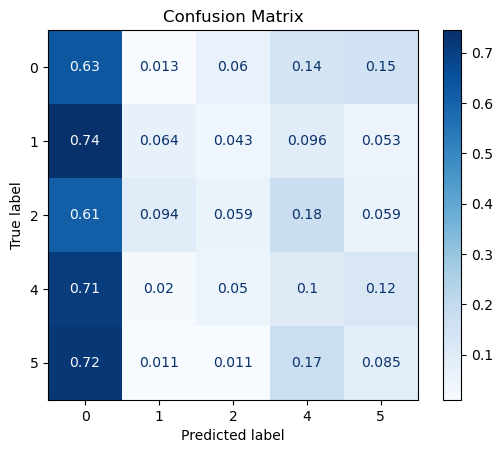

In [502]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

# WEIGHTED RESNET

## Standart Case 1

In [563]:


simple_resnet_model = models.FlexibleResNet([2, 2, 2],
                                            [16, 16, 16],
                                            dropout=0.4,
                                     num_aux_feats=len(AUX_COLS),
                                     num_labels=4,
                                    in_chanels=1).to(device)


In [564]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=2.0)

optimizer = optim.Adam(simple_resnet_model.parameters(),
                      lr=1e-3,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 cooldown=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)

simple_resnet = learners.MultiLabelLearner(simple_resnet_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train'],
                                        loaders_label_w['val'],
                                        metrics=metrics_labels,
                                        scheduler=scheduler,
                                        model_name='WheightedResNetStandartData')
                                        
                                        

In [565]:
history_simple_resnet = simple_resnet.fit(500)

Starting run 'WheightedResNetStandartData_lunar_tiger_20250615_231215' with parameters:
  run_name: WheightedResNetStandartData_lunar_tiger_20250615_231215
  model: FlexibleResNet
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0997/0.0538 — lr 1.0e-03
                                              micro_f1       :  0.7396 | macro_f1       :  0.7239 | micro_precision:  0.9348
                                              micro_recall   :  0.6119 | roc_auc_macro  :  0.9736 | roc_auc_micro  :  0.9745
Epoch 002 — loss 0.0347/0.0198 — lr 1.0e-03
                                              micro_f1       :  0.9455 | macro_f1       :  0.9445 | micro_precision:  0.9939
                                              micro_recall   :  0.9016 | roc_auc_macro  :  0.9971 | roc_auc_micro  :  0.9967
Epoch 003 — loss 0.0162/0.0073 — lr 1.0e-

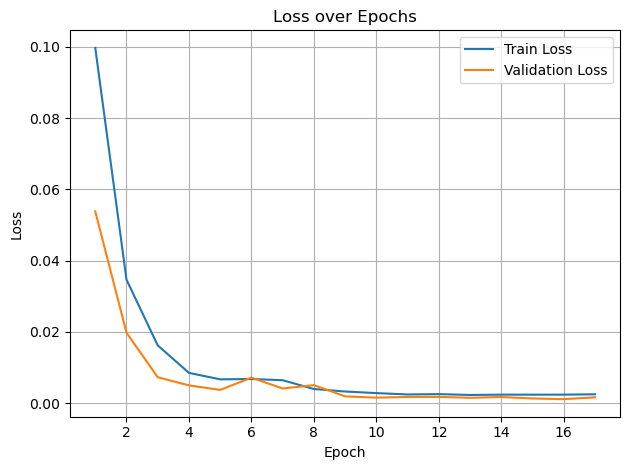

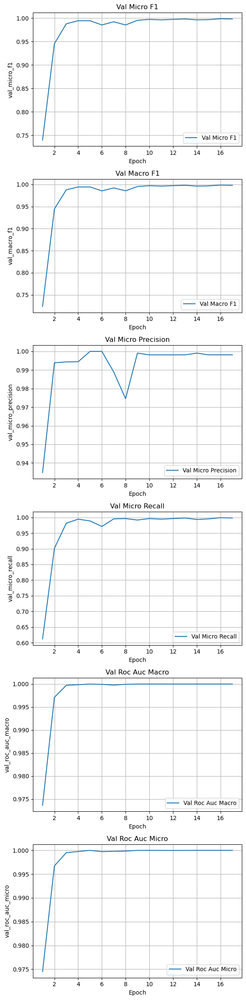

In [571]:
reports.plot_history(history_simple_resnet)

In [572]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_resnet_model, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.27      0.31      0.29       103
           1       0.34      0.27      0.30        96
           2       0.40      0.16      0.23       104
           3       0.11      0.17      0.14       105

   micro avg       0.24      0.23      0.23       408
   macro avg       0.28      0.23      0.24       408
weighted avg       0.28      0.23      0.24       408
 samples avg       0.09      0.09      0.09       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


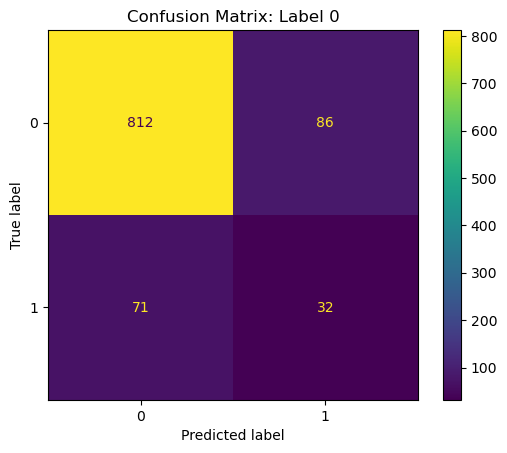

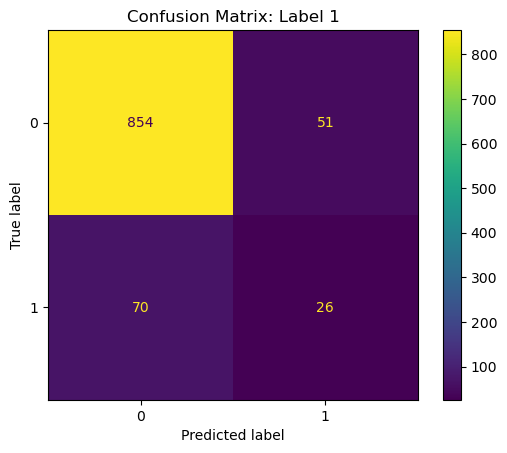

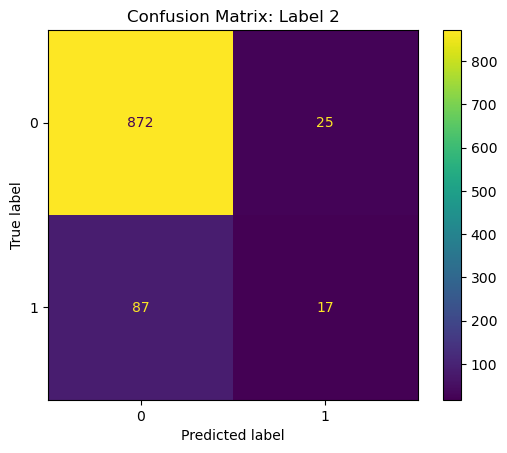

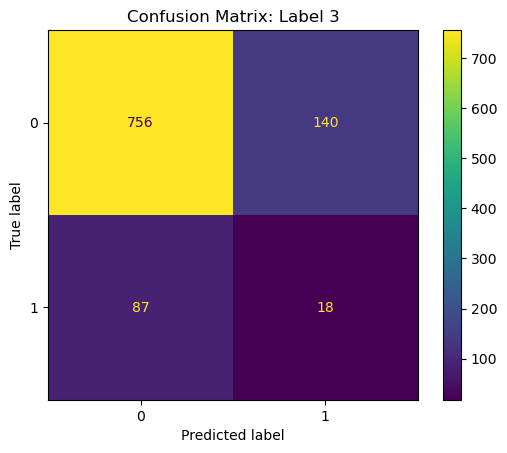

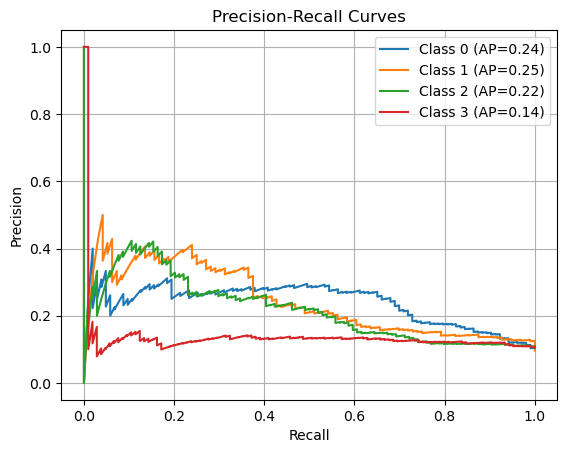

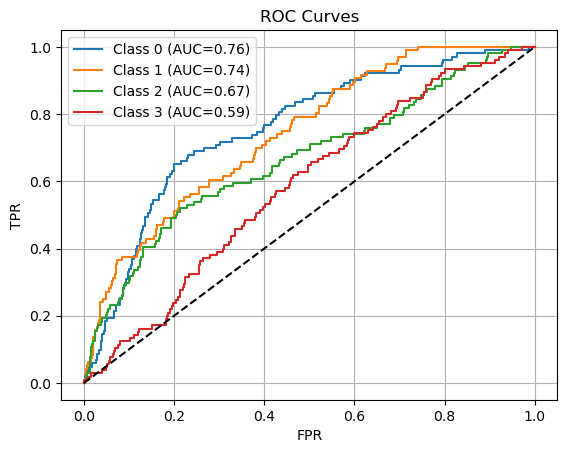

              precision    recall  f1-score   support

    negative       0.62      0.69      0.66       593
    positive       0.47      0.39      0.42       408

    accuracy                           0.57      1001
   macro avg       0.54      0.54      0.54      1001
weighted avg       0.56      0.57      0.56      1001



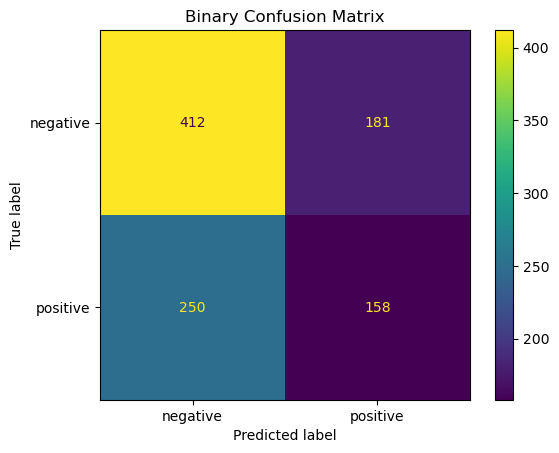

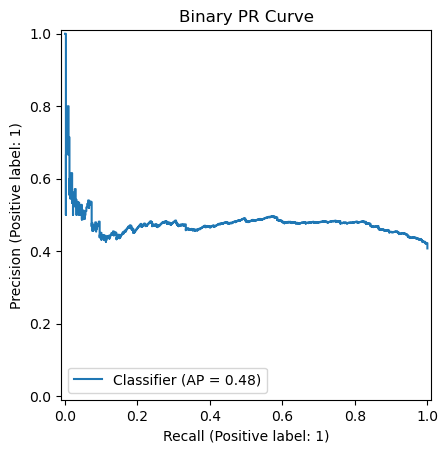

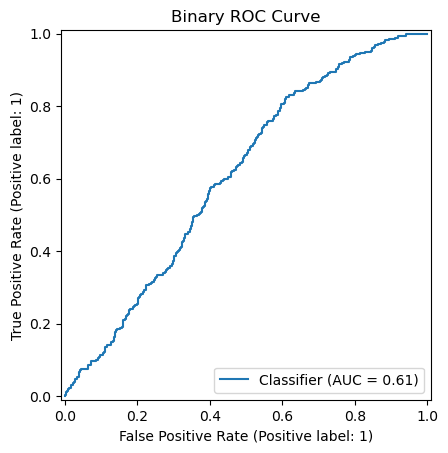

In [573]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [574]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.62      0.69      0.66       593
           1       0.52      0.15      0.24       104
           2       0.15      0.16      0.15       105
           3       0.00      0.00      0.00         0
           4       0.30      0.29      0.30       103
           5       0.53      0.20      0.29        96
           6       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0

    accuracy                           0.49      1001
   macro avg       0.19      0.14      0.15      1001
weighted avg       0.52      0.49      0.49      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


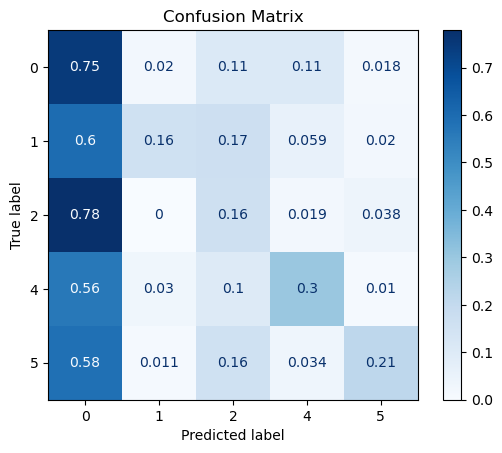

In [575]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

# More weighted CNN

## Standart Case 3

In [326]:
simple_cnn_model_2 = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),

     in_channels=1)

In [327]:
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

optimizer = optim.Adam(simple_cnn_model_2.parameters(),
                      lr=1e-5)



simple_cnn_2 = learners.MultiLabelLearner(simple_cnn_model_2,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train'],
                                        loaders_label_w['val'],
                                        patience=5,
                                        metrics=metrics_labels,
                                        model_name='SimpleCNNStandartData')
                                        
                                        

In [328]:
history_simple_cnn = simple_cnn_2.fit(500)

Starting run 'SimpleCNNStandartData_gentle_bear_20250615_160451' with parameters:
  run_name: SimpleCNNStandartData_gentle_bear_20250615_160451
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: BCEWithLogitsLoss
  scheduler: None
  patience: 5
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 1.1047/1.0698 — lr 1.0e-05
                                              micro_f1       :  0.3614 | macro_f1       :  0.3525 | micro_precision:  0.2330
                                              micro_recall   :  0.8059 | roc_auc_macro  :  0.8468 | roc_auc_micro  :  0.6318
Epoch 002 — loss 1.1094/1.0562 — lr 1.0e-05
                                              micro_f1       :  0.3837 | macro_f1       :  0.3865 | micro_precision:  0.2375
                                              micro_recall   :  0.9991 | roc_auc_macro  :  0.9000 | roc_auc_micro  :  0.7587
Epoch 003 — loss 1.0749/1.0334 — lr 1.0e-05
    

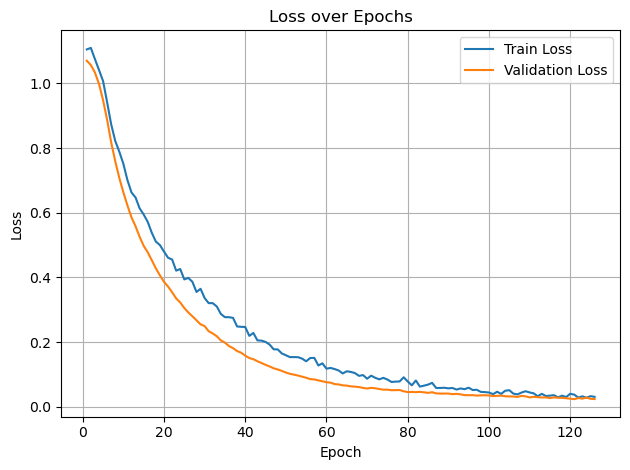

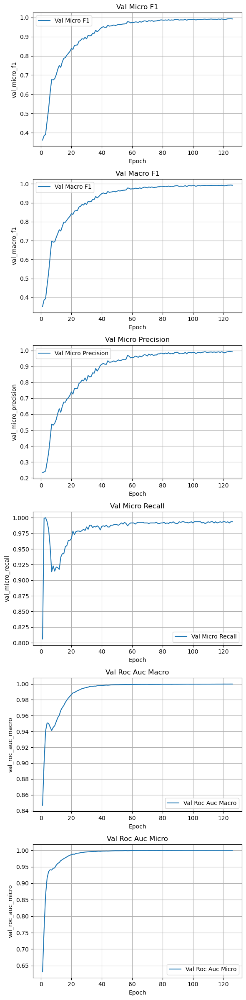

In [329]:
reports.plot_history(history_simple_cnn)

In [330]:
y_true, y_pred, y_score = reports.predict_multilabel(simple_cnn_model_2, loaders_label['test'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.14      0.69      0.23       103
           1       0.18      0.56      0.27        96
           2       0.29      0.53      0.38       104
           3       0.17      0.97      0.29       105

   micro avg       0.18      0.69      0.28       408
   macro avg       0.20      0.69      0.29       408
weighted avg       0.20      0.69      0.29       408
 samples avg       0.17      0.28      0.20       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


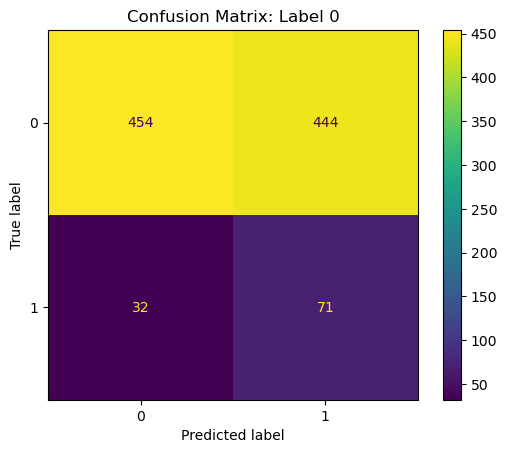

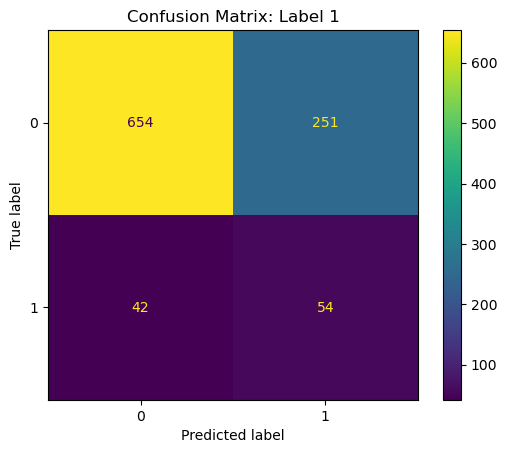

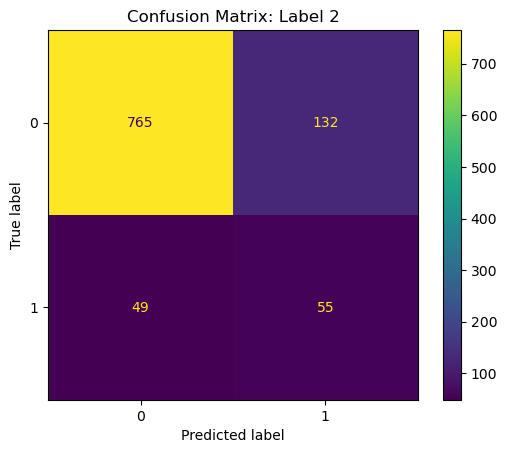

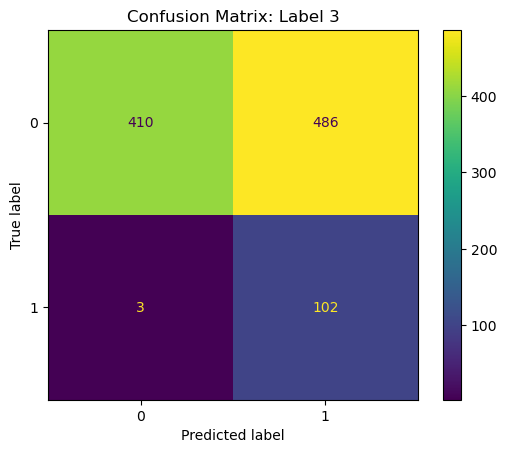

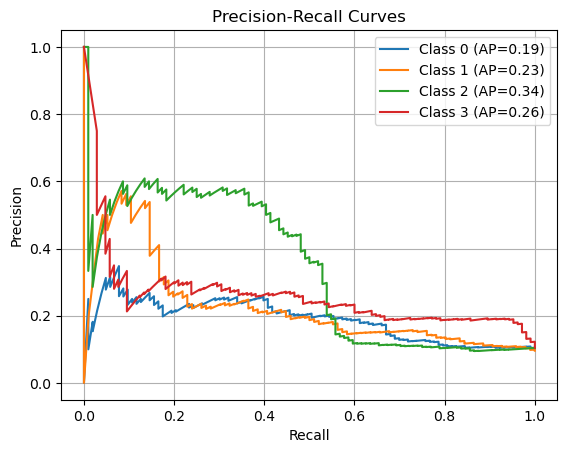

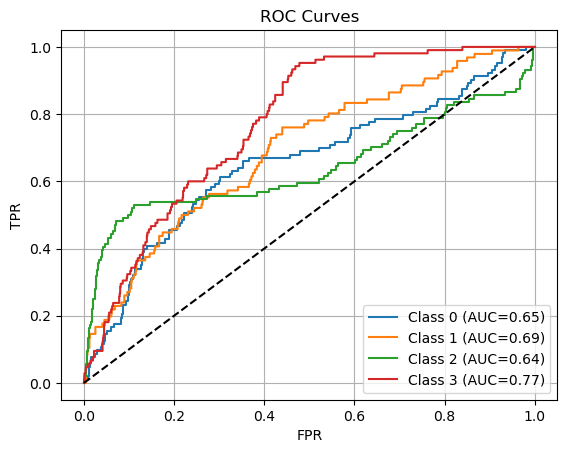

              precision    recall  f1-score   support

    negative       0.91      0.15      0.25       593
    positive       0.44      0.98      0.61       408

    accuracy                           0.49      1001
   macro avg       0.68      0.56      0.43      1001
weighted avg       0.72      0.49      0.40      1001



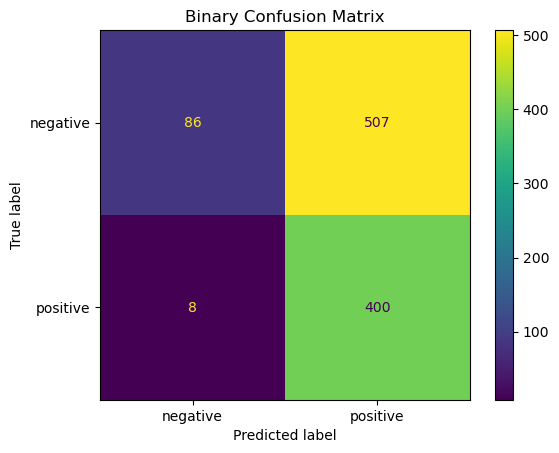

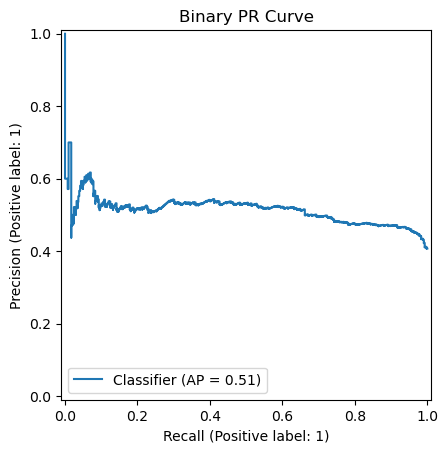

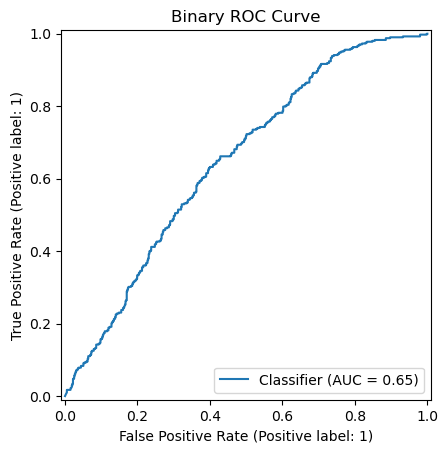

In [331]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [332]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.91      0.15      0.25       593
           1       0.32      0.06      0.10       104
           2       0.19      0.40      0.26       105
           3       0.00      0.00      0.00         0
           4       0.28      0.28      0.28       103
           5       0.36      0.15      0.21        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.18      1001
   macro avg       0.16      0.08      0.08      1001
weighted avg       0.66      0.18      0.23      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


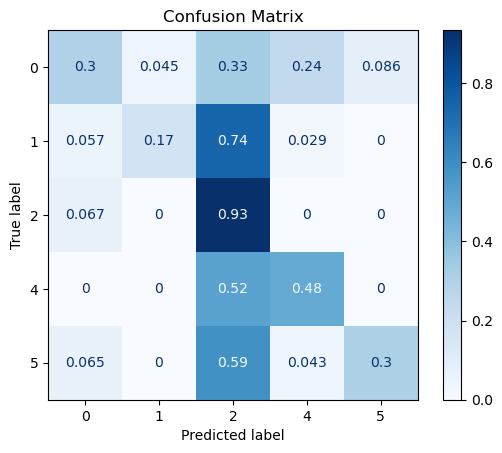

In [333]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case 3

In [1021]:
extended_cnn_model_3 = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [1027]:
path = "ExtendedCNNStandartData_vivid_nebula_20250615_191828/ExtendedCNNStandartData_vivid_nebula_20250615_191828.ckpt.pt"
a = torch.load(path, map_location="cpu")
extended_cnn_model_3.load_state_dict(a['state'])

<All keys matched successfully>

In [374]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=7.0)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext'],
                                        loaders_label_w['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [375]:
history_extended_cnn = extended_cnn.fit(500)

Starting run 'ExtendedCNNStandartData_vivid_nebula_20250615_191828' with parameters:
  run_name: ExtendedCNNStandartData_vivid_nebula_20250615_191828
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0054/0.0050 — lr 1.0e-05
                                              micro_f1       :  0.0771 | macro_f1       :  0.0416 | micro_precision:  0.1168
                                              micro_recall   :  0.0576 | roc_auc_macro  :  0.4783 | roc_auc_micro  :  0.4925
Epoch 002 — loss 0.0049/0.0047 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.5185 | roc_auc_micro  :  0.5157
Epoch 003 — loss 0.0048/0.0046 — lr 1

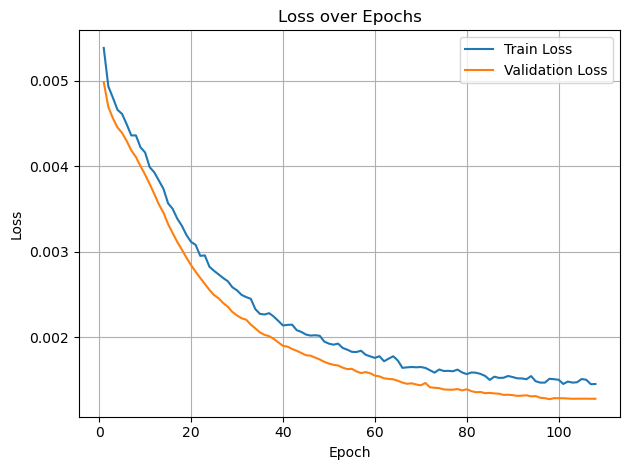

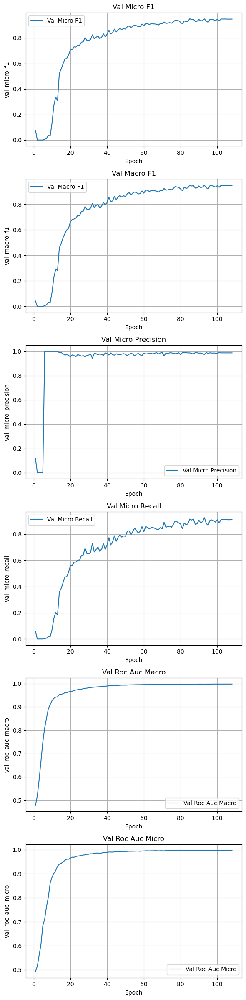

In [376]:
reports.plot_history(history_extended_cnn)

In [1028]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model_3, loaders_label['test_ext'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.18      0.47      0.26       103
           1       0.18      0.71      0.29        96
           2       0.55      0.28      0.37       104
           3       0.29      0.53      0.38       105

   micro avg       0.23      0.49      0.31       408
   macro avg       0.30      0.50      0.32       408
weighted avg       0.30      0.49      0.32       408
 samples avg       0.15      0.20      0.17       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


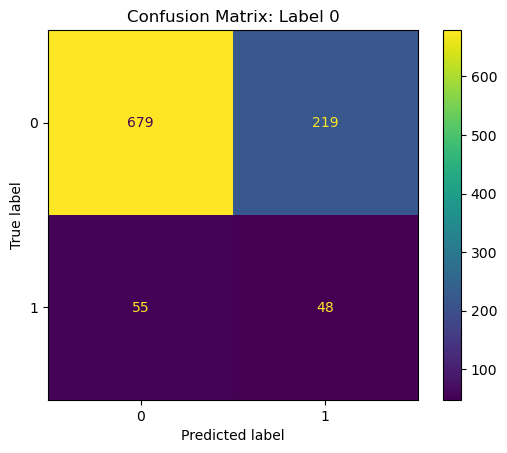

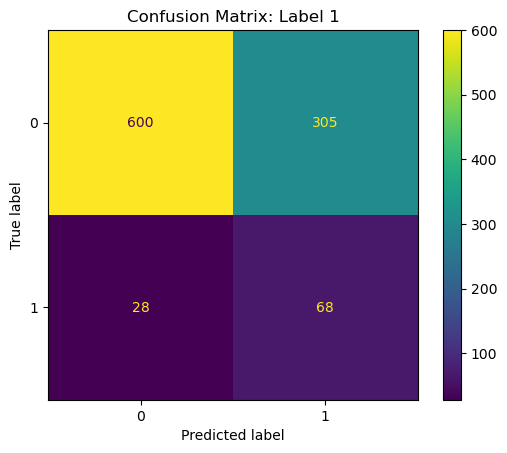

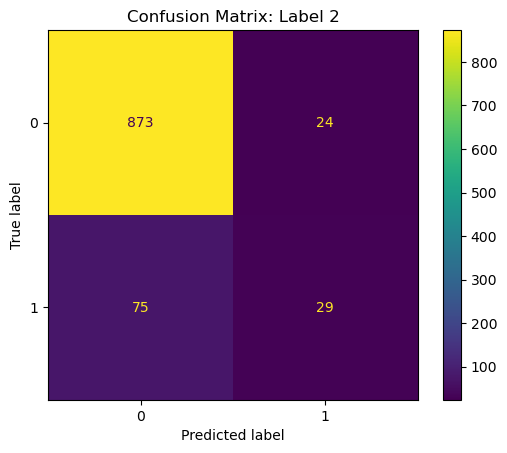

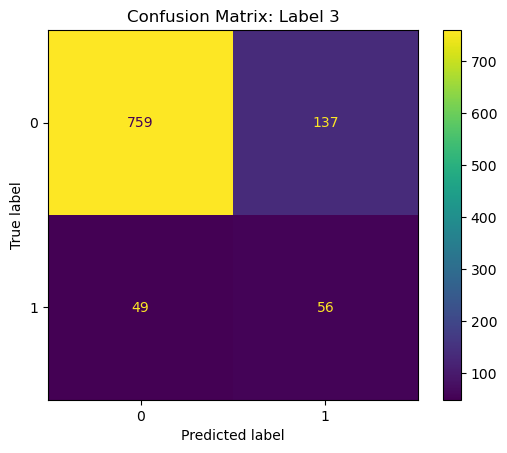

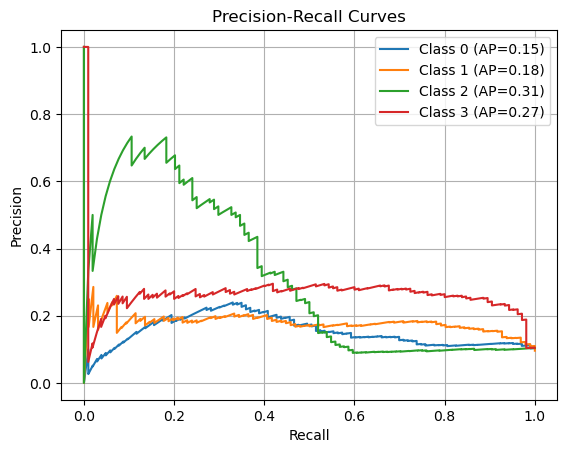

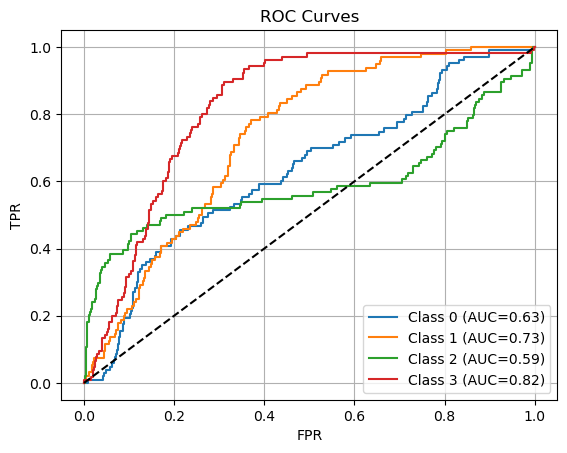

              precision    recall  f1-score   support

    negative       0.73      0.53      0.62       593
    positive       0.51      0.72      0.60       408

    accuracy                           0.61      1001
   macro avg       0.62      0.63      0.61      1001
weighted avg       0.64      0.61      0.61      1001



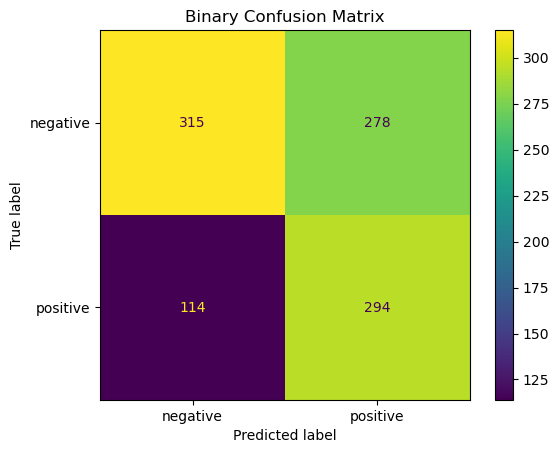

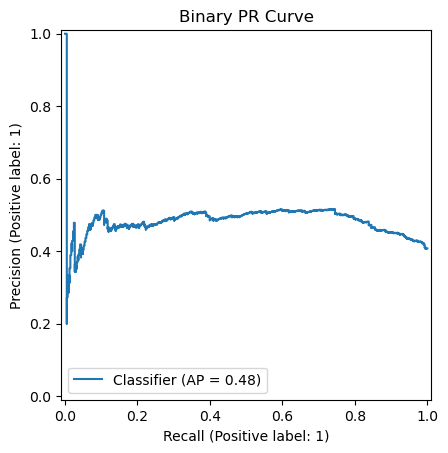

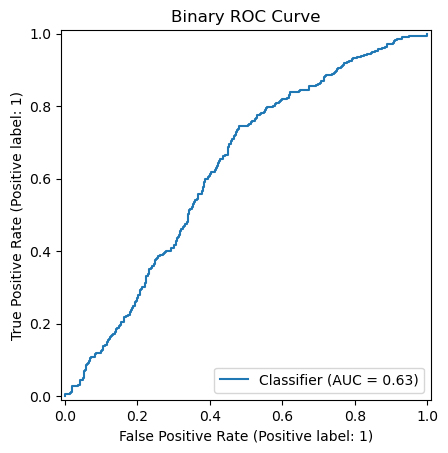

In [378]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.18      0.47      0.26       103
           1       0.18      0.71      0.29        96
           2       0.55      0.28      0.37       104
           3       0.29      0.53      0.38       105

   micro avg       0.23      0.49      0.31       408
   macro avg       0.30      0.50      0.32       408
weighted avg       0.30      0.49      0.32       408
 samples avg       0.15      0.20      0.17       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


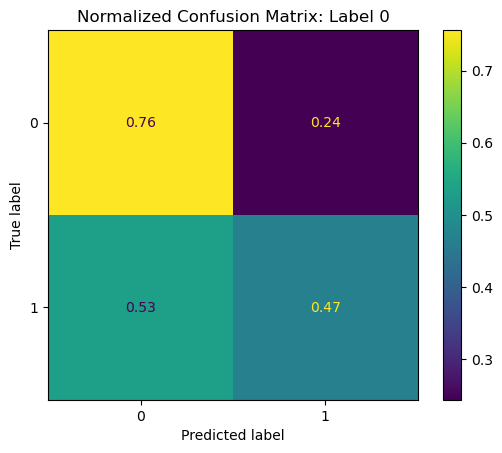

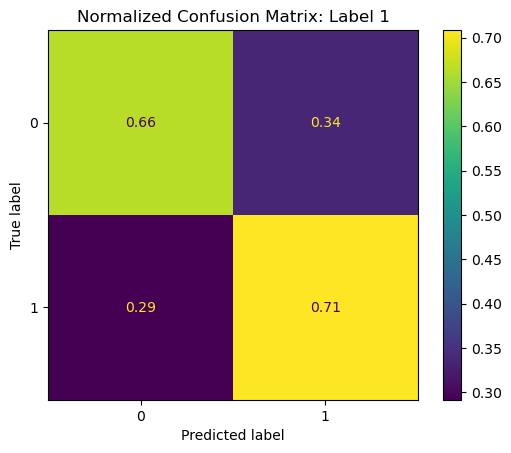

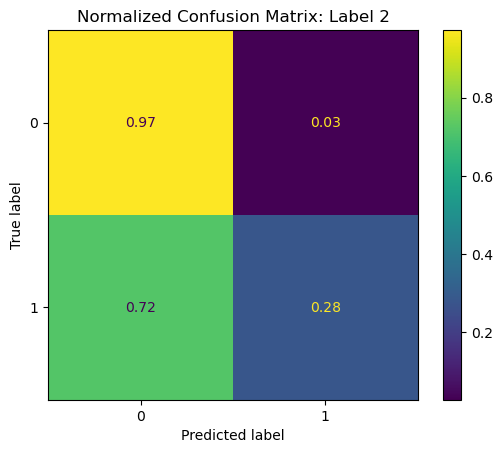

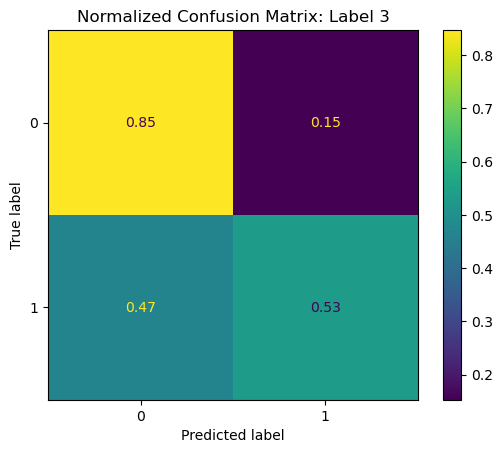

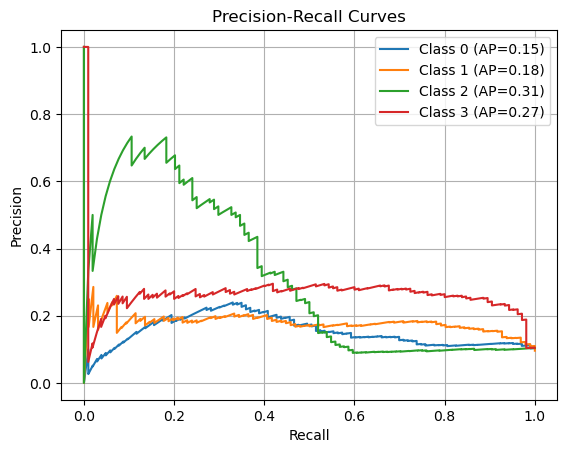

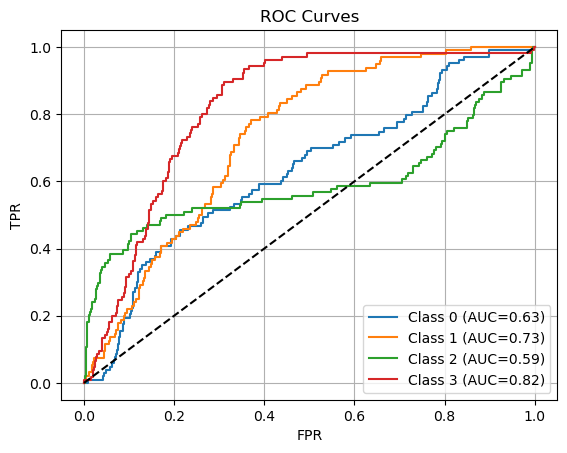

              precision    recall  f1-score   support

    negative       0.73      0.53      0.62       593
    positive       0.51      0.72      0.60       408

    accuracy                           0.61      1001
   macro avg       0.62      0.63      0.61      1001
weighted avg       0.64      0.61      0.61      1001



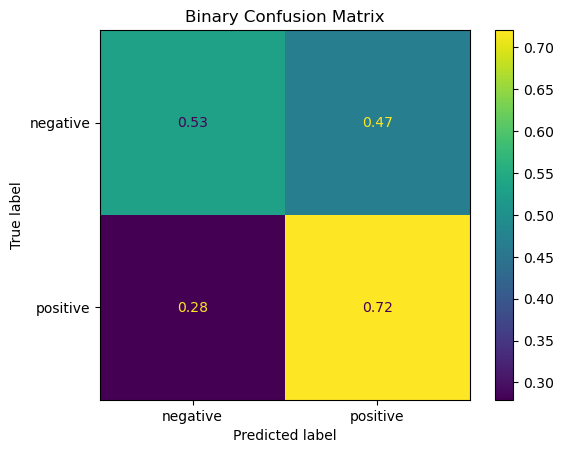

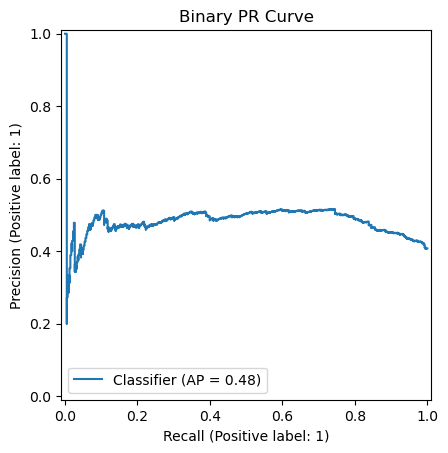

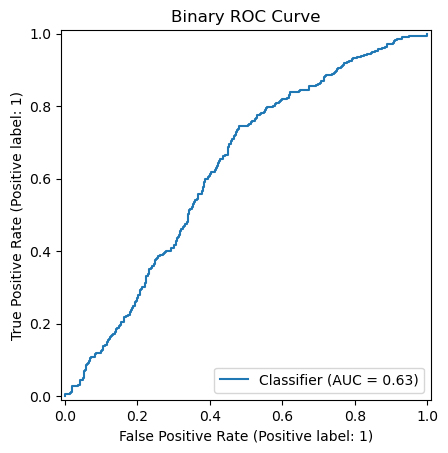

In [1029]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [379]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.73      0.53      0.62       593
           1       0.57      0.19      0.29       104
           2       0.35      0.23      0.28       105
           3       0.00      0.00      0.00         0
           4       0.49      0.36      0.42       103
           5       0.21      0.33      0.25        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.43      1001
   macro avg       0.20      0.14      0.15      1001
weighted avg       0.60      0.43      0.49      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


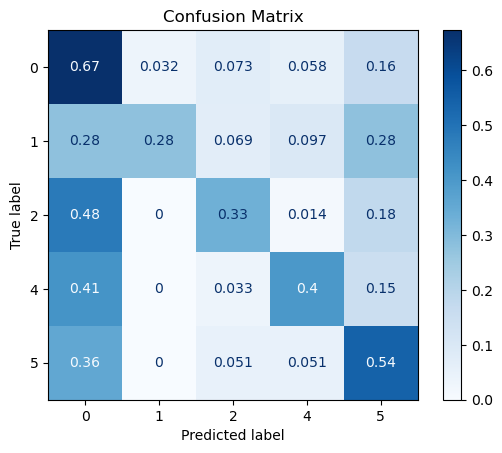

In [380]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Extended Case 4

In [462]:
extended_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[64, 128, 256],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [463]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=6.8)

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-7)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiLabelLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext'],
                                        loaders_label_w['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedCNNStandartData')
                                        
                                        

In [464]:
history_extended_cnn = extended_cnn.fit(500)

Starting run 'ExtendedCNNStandartData_solar_oracle_20250615_213010' with parameters:
  run_name: ExtendedCNNStandartData_solar_oracle_20250615_213010
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0056/0.0051 — lr 1.0e-05
                                              micro_f1       :  0.0000 | macro_f1       :  0.0000 | micro_precision:  0.0000
                                              micro_recall   :  0.0000 | roc_auc_macro  :  0.7755 | roc_auc_micro  :  0.7415
Epoch 002 — loss 0.0049/0.0044 — lr 1.0e-05
                                              micro_f1       :  0.1699 | macro_f1       :  0.1497 | micro_precision:  1.0000
                                              micro_recall   :  0.0929 | roc_auc_macro  :  0.9273 | roc_auc_micro  :  0.9154
Epoch 003 — loss 0.0043/0.0036 — lr 1

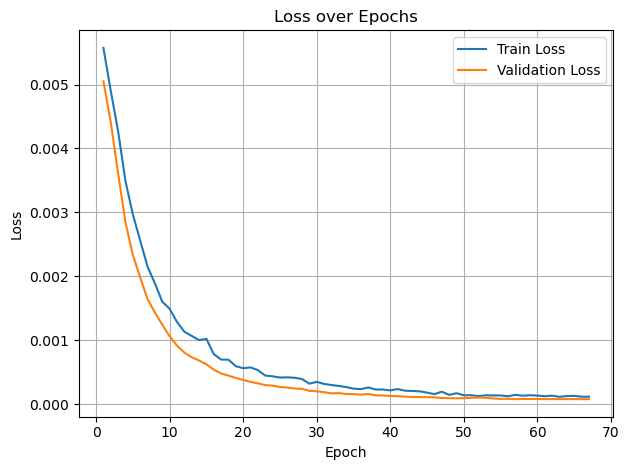

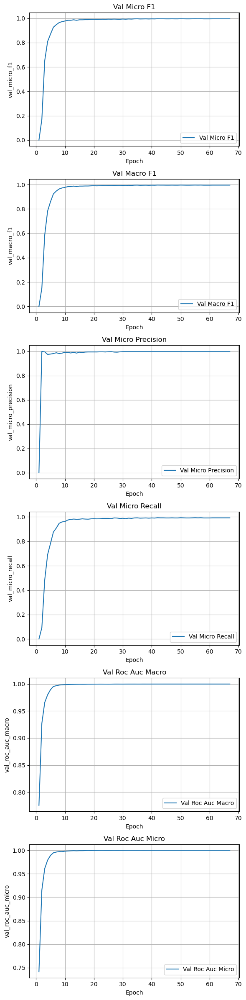

In [465]:
reports.plot_history(history_extended_cnn)

In [466]:
y_true, y_pred, y_score = reports.predict_multilabel(extended_cnn_model, loaders_label['test_ext'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.13      0.48      0.21       103
           1       0.22      0.65      0.33        96
           2       0.64      0.33      0.43       104
           3       0.16      0.67      0.26       105

   micro avg       0.19      0.53      0.28       408
   macro avg       0.29      0.53      0.31       408
weighted avg       0.29      0.53      0.31       408
 samples avg       0.15      0.21      0.17       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


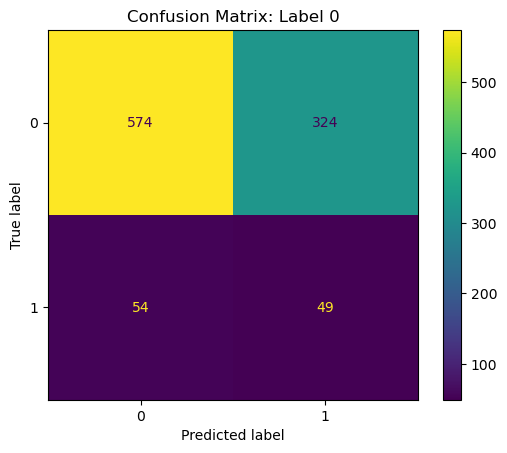

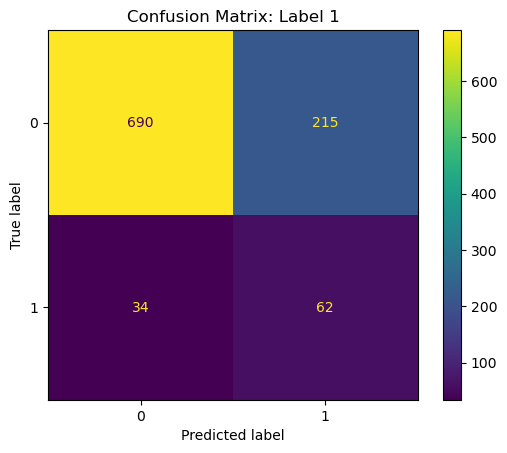

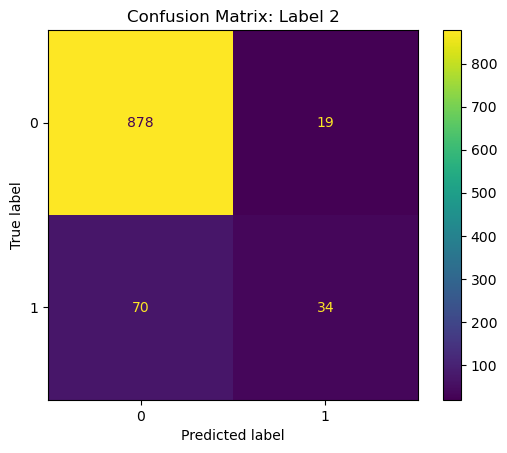

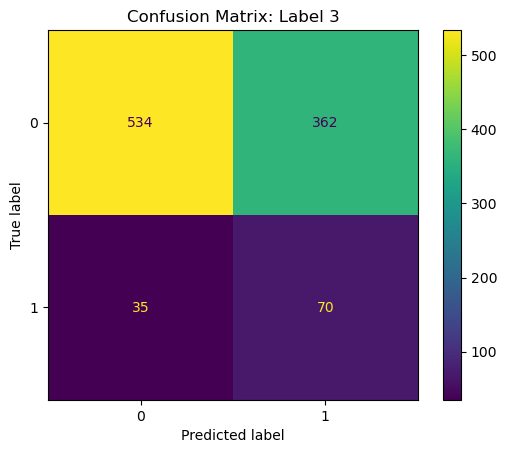

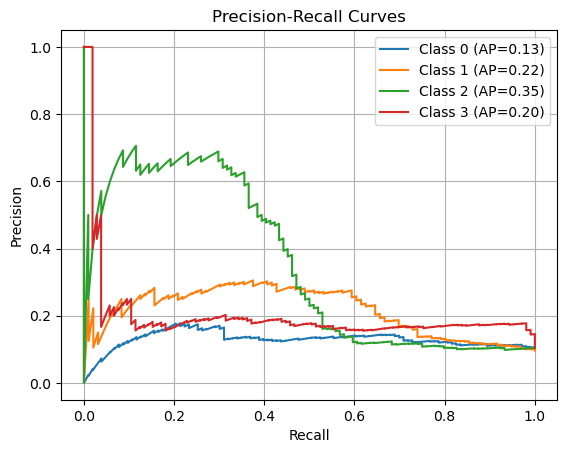

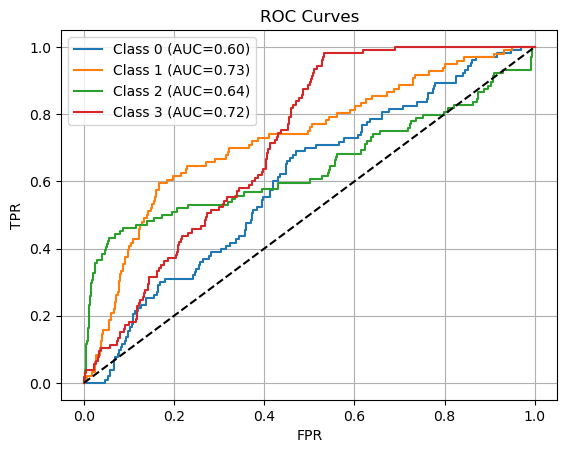

              precision    recall  f1-score   support

    negative       0.78      0.40      0.53       593
    positive       0.49      0.83      0.62       408

    accuracy                           0.58      1001
   macro avg       0.63      0.62      0.57      1001
weighted avg       0.66      0.58      0.57      1001



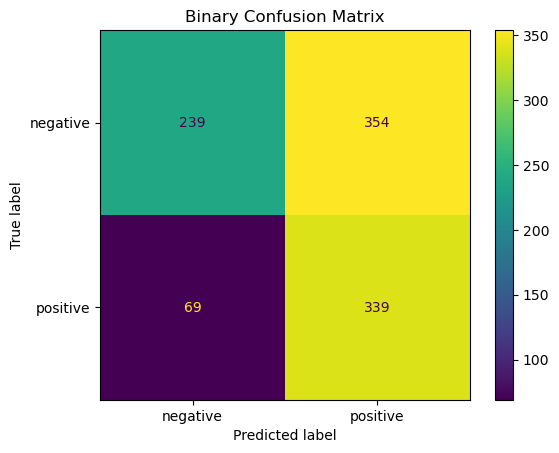

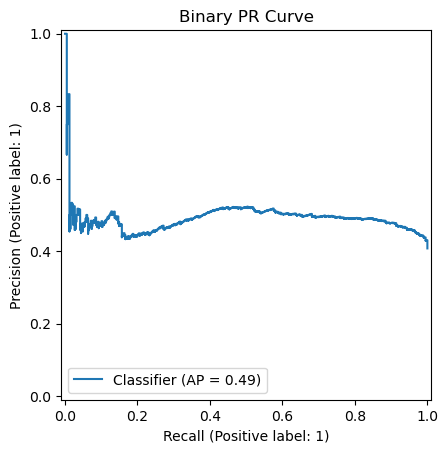

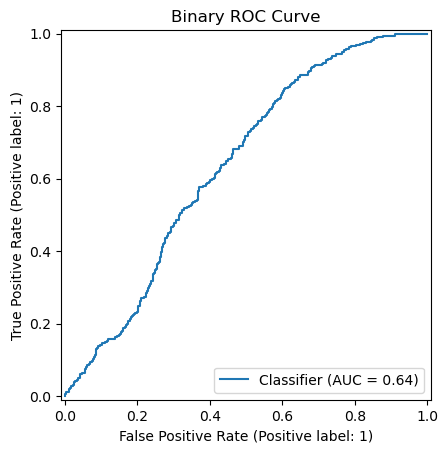

In [467]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [468]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.78      0.40      0.53       593
           1       0.56      0.13      0.22       104
           2       0.22      0.30      0.25       105
           3       0.00      0.00      0.00         0
           4       0.25      0.19      0.22       103
           5       0.32      0.27      0.29        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.33      1001
   macro avg       0.16      0.10      0.12      1001
weighted avg       0.60      0.33      0.41      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


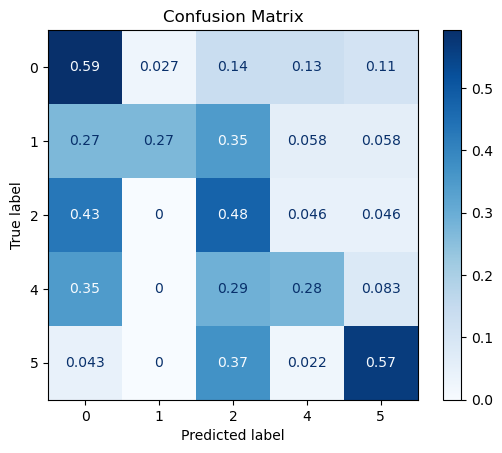

In [469]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

## Pesistance Case

In [495]:
pers_cnn_model = models.ConfigurableTwoBranchCNN(
     sensor_shape=(20, 20),
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_LABELS,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
     in_channels=2)

In [496]:
criterion = custom_loss.FocalBCE(pos_weight=None,
                                 gamma=8.0)

optimizer = optim.Adam(pers_cnn_model.parameters(),
                      lr=1e-6,
                      weight_decay=1e-6)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
pers_cnn = learners.MultiLabelLearner(pers_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_label_w['train_ext_pers'],
                                        loaders_label_w['val_ext_pers'],
                                        patience=5,
                                        scheduler=scheduler,
                                        metrics=metrics_labels,
                                        model_name='ExtendedPersCNNStandartData')
                                        
                                        

In [497]:
history_pers_cnn = pers_cnn.fit(500)

Starting run 'ExtendedPersCNNStandartData_radiant_raven_20250615_214238' with parameters:
  run_name: ExtendedPersCNNStandartData_radiant_raven_20250615_214238
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: FocalBCE
  scheduler: ReduceLROnPlateau
  patience: 5
  metrics: ['micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_macro', 'roc_auc_micro']
Epoch 001 — loss 0.0029/0.0029 — lr 1.0e-06
                                              micro_f1       :  0.3466 | macro_f1       :  0.2757 | micro_precision:  0.2255
                                              micro_recall   :  0.7484 | roc_auc_macro  :  0.5681 | roc_auc_micro  :  0.5285
Epoch 002 — loss 0.0029/0.0028 — lr 1.0e-06
                                              micro_f1       :  0.3467 | macro_f1       :  0.2759 | micro_precision:  0.2260
                                              micro_recall   :  0.7447 | roc_auc_macro  :  0.5806 | roc_auc_micro  :  0.5346
Epoch 003 — loss 0.0029/0.00

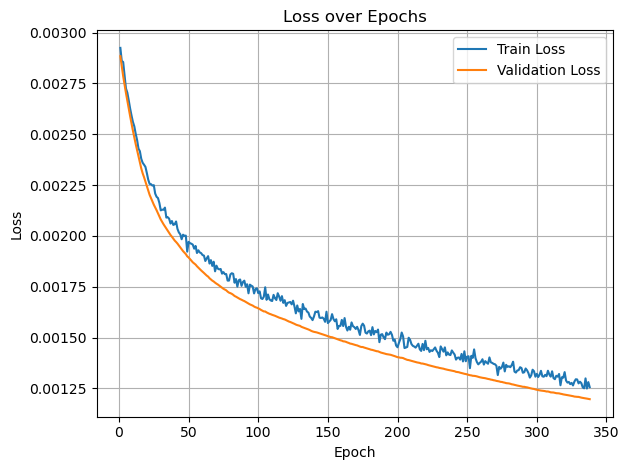

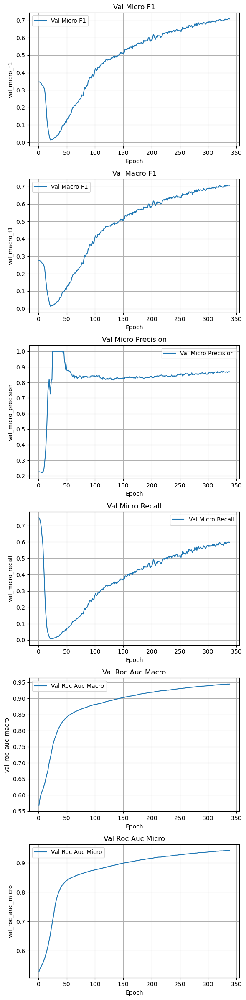

In [498]:
reports.plot_history(history_pers_cnn)

In [499]:
y_true, y_pred, y_score = reports.predict_multilabel(pers_cnn_model, loaders_label['test_ext_pers'])

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.07      0.10      0.08       103
           1       0.07      0.09      0.08        96
           2       0.17      0.15      0.16       104
           3       0.18      0.20      0.19       105

   micro avg       0.11      0.14      0.12       408
   macro avg       0.12      0.14      0.13       408
weighted avg       0.12      0.14      0.13       408
 samples avg       0.04      0.06      0.05       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


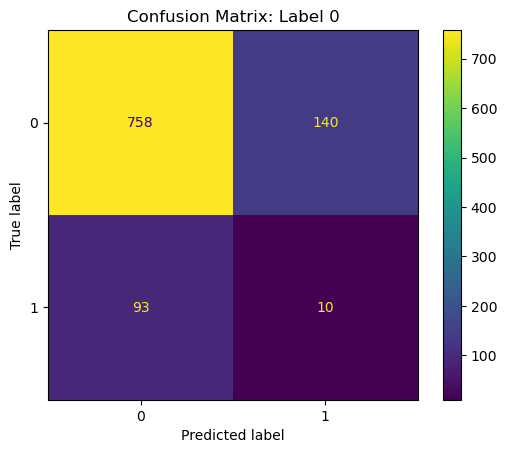

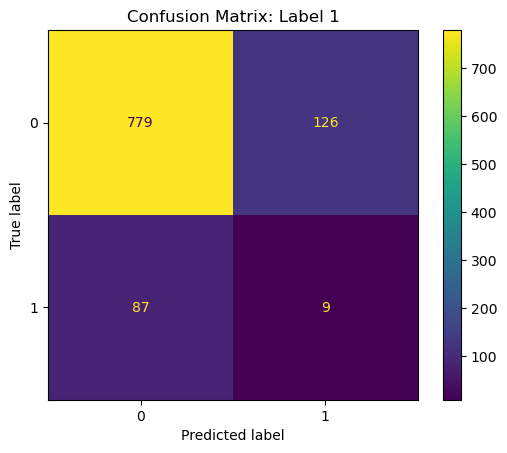

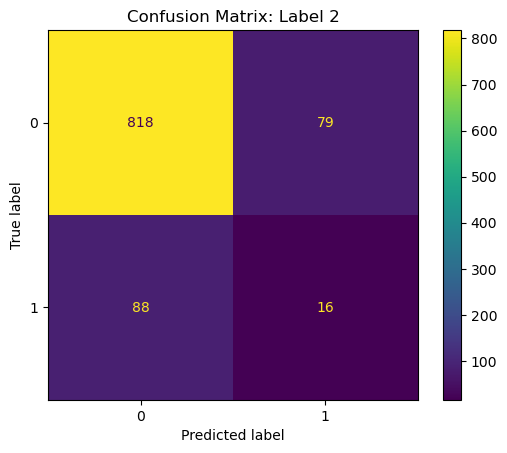

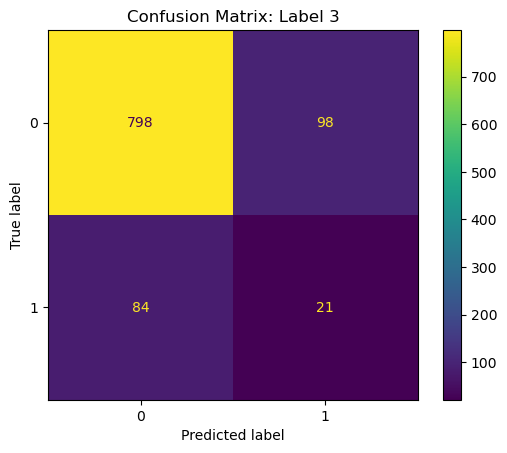

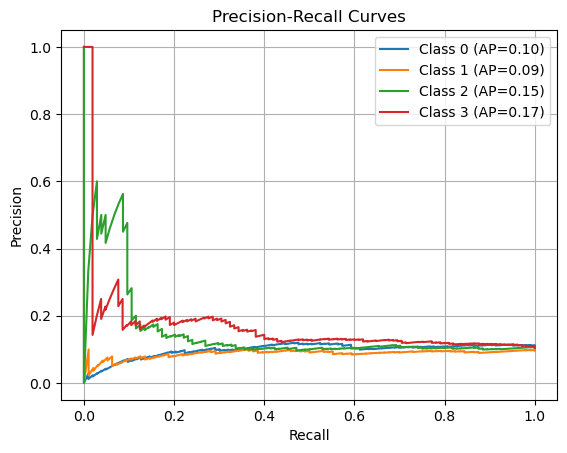

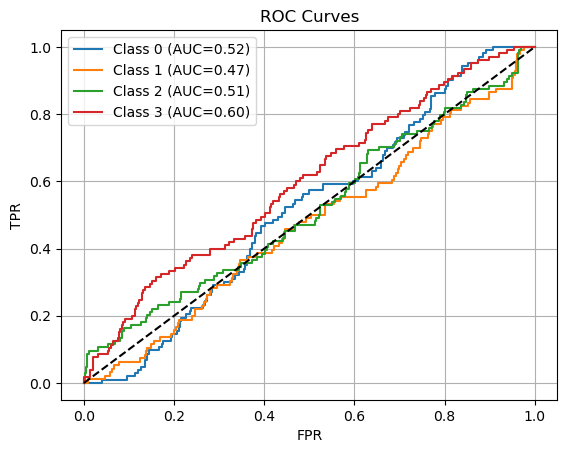

              precision    recall  f1-score   support

    negative       0.56      0.57      0.57       593
    positive       0.37      0.36      0.36       408

    accuracy                           0.49      1001
   macro avg       0.47      0.47      0.47      1001
weighted avg       0.48      0.49      0.48      1001



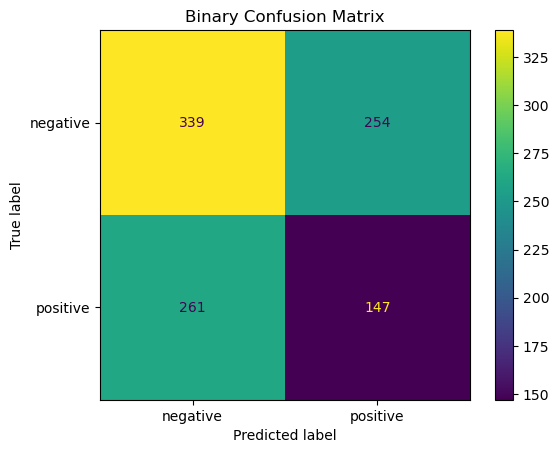

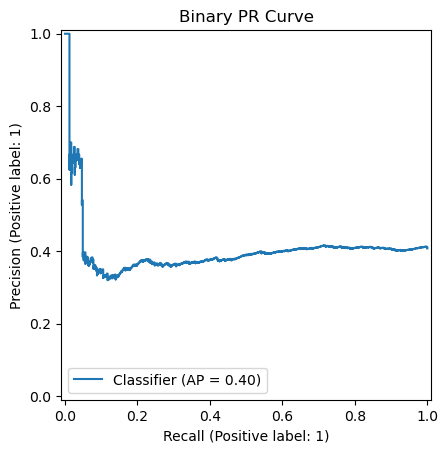

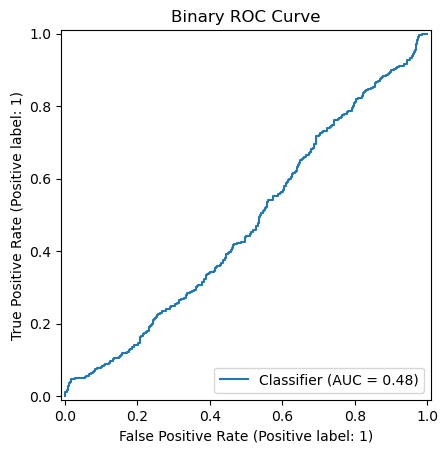

In [500]:
reports.full_report_multilabel(y_true, y_pred, y_score, plot=True);

In [501]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.56      0.57      0.57       593
           1       0.25      0.06      0.09       104
           2       0.11      0.05      0.07       105
           3       0.00      0.00      0.00         0
           4       0.08      0.10      0.09       103
           5       0.07      0.08      0.08        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.37      1001
   macro avg       0.09      0.07      0.07      1001
weighted avg       0.39      0.37      0.37      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


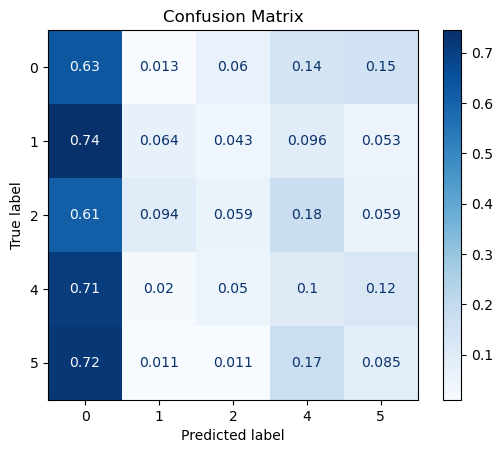

In [502]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

# SIMPLE 2D CNN Multiclass

## Standart Case 1

In [631]:
simple_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_CLASSES,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [632]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(simple_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 cooldown=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)

simple_cnn = learners.MultiClassLearner(simple_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_class['train'],
                                        loaders_class['val'],
                                        scheduler=scheduler,
                                        metrics=metrics_multiclass,
                                        model_name='SimpleCNNStandartDataMulticlass')
                                        
                                        

In [633]:
history_simple_cnn = simple_cnn.fit(500)

### Starting SimpleCNNStandartDataMulticlass_fuzzy_pioneer_20250615_235336
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: CrossEntropyLoss
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['accuracy', 'micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_ovo_macro', 'roc_auc_ovr_macro']
Epoch 001 — loss 2.4524/2.4068 — lr 1.0e-05
                                              accuracy         :  0.4433 | micro_f1         :  0.4433 | macro_f1         :  0.0512
                                              micro_precision  :  0.4433 | micro_recall     :  0.4433 | roc_auc_ovo_macro:  0.6634
                                              roc_auc_ovr_macro:  0.6400
Epoch 002 — loss 2.3455/2.2512 — lr 1.0e-05
                                              accuracy         :  0.4433 | micro_f1         :  0.4433 | macro_f1         :  0.0512
                                              micro_precision  :  0.4433 | micro_recall     :  0.4433 | roc_auc_ovo_ma

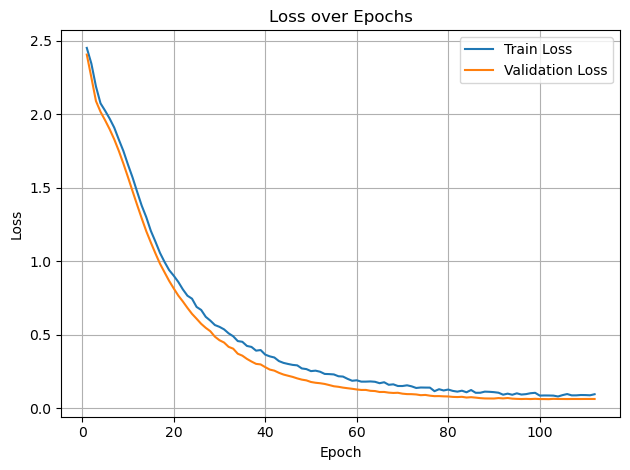

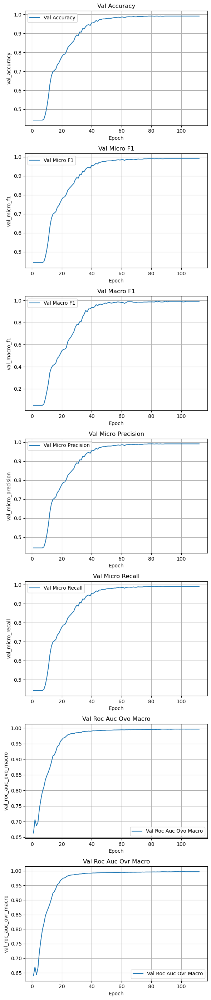

In [634]:
reports.plot_history(history_simple_cnn)

In [638]:
y_true, y_pred, y_score = reports.predict_multiclass(simple_cnn_model, loaders_class['test'])

In [639]:
y_pred

array([6, 6, 6, ..., 6, 3, 0])

=== Multiclass Classification Report ===
              precision    recall  f1-score   support

           0       0.72      0.37      0.49       593
           1       0.80      0.08      0.14       104
           2       1.00      0.01      0.02       105
           3       0.00      0.00      0.00         0
           4       0.33      0.13      0.18       103
           5       0.00      0.00      0.00        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0

    accuracy                           0.24      1001
   macro avg       0.28      0.06      0.08      1001
weighted avg       0.65      0.24      0.33      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/s

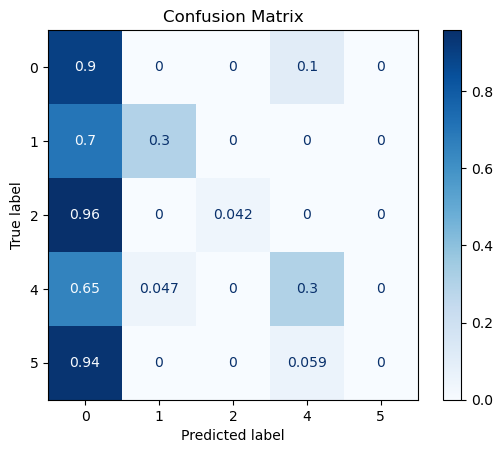

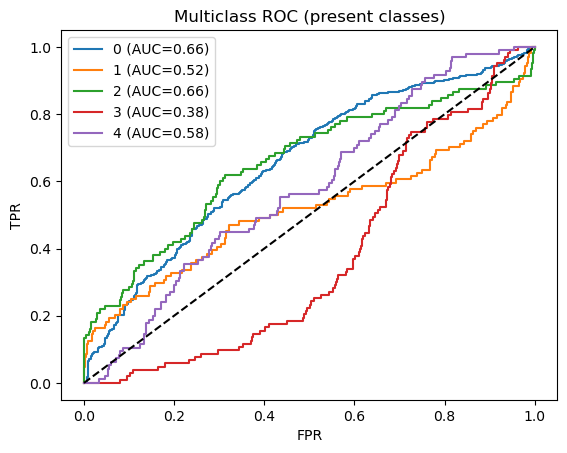

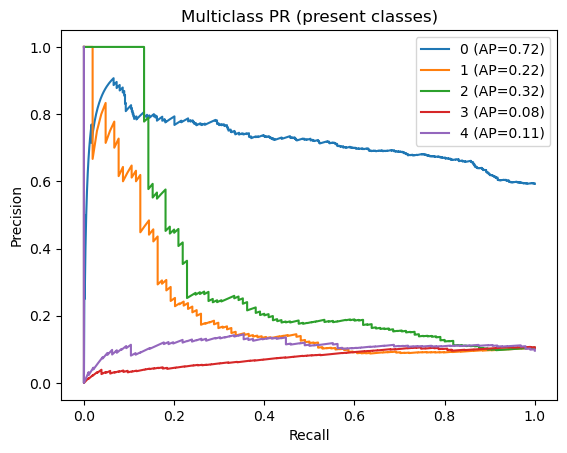

In [640]:
reports.full_report_multiclass(y_true, y_pred, y_score, plot=True);

In [641]:
y_pred_v = np.vstack(list(map(laberer, y_pred))).squeeze()
y_true_v = np.vstack(list(map(laberer, y_true))).squeeze()



=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.12      0.66      0.20       103
           1       0.13      0.62      0.22        96
           2       0.19      0.15      0.17       104
           3       0.21      0.42      0.28       105

   micro avg       0.14      0.46      0.22       408
   macro avg       0.16      0.46      0.22       408
weighted avg       0.16      0.46      0.22       408
 samples avg       0.10      0.19      0.13       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


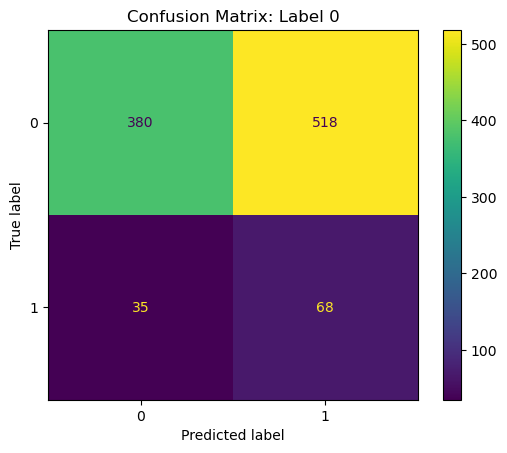

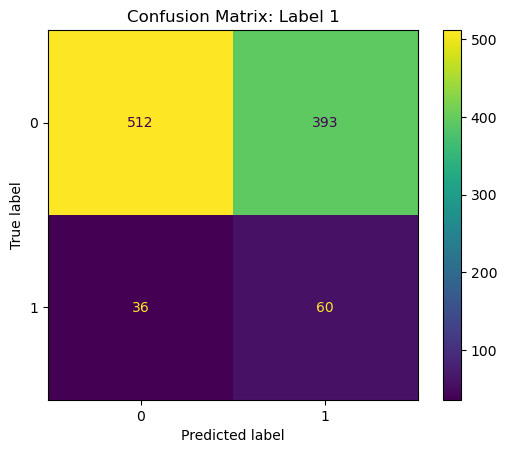

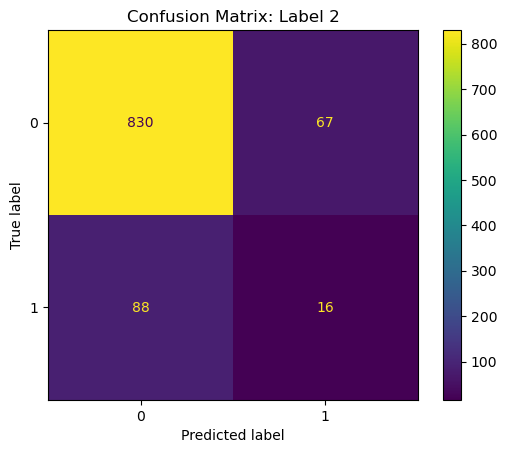

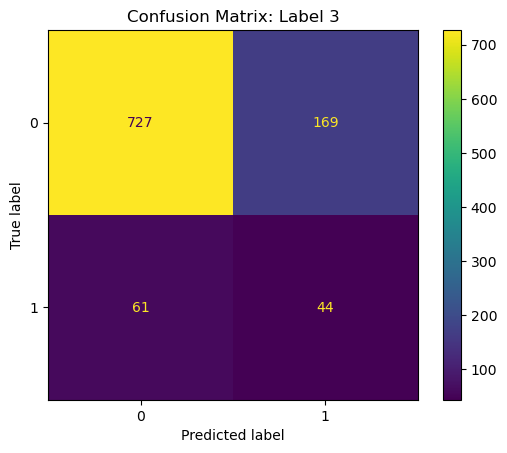

TypeError: 'NoneType' object is not subscriptable

In [645]:
reports.full_report_multilabel(y_true_v, y_pred_v, None, plot=True)

## Standart Case 2

In [683]:
simple_cnn_model_2 = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS),
     num_labels=NUM_CLASSES,
     conv_channels=[32, 64, 64],
     pool_sizes=[(2,2), (2,2), (2,1)],
         sensor_shape=(128, 6),
     in_channels=1)

In [684]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(simple_cnn_model_2.parameters(),
                      lr=1e-5)



simple_cnn_2 = learners.MultiClassLearner(simple_cnn_model_2,
                                        optimizer,
                                        criterion,
                                        loaders_class_w['train'],
                                        loaders_class_w['val'],
                                        patience=5,
                                        metrics=metrics_multiclass,
                                        model_name='WeughtedCNNStandartDataMulticlass')
                                        
                                        

In [685]:
history_simple_cnn = simple_cnn_2.fit(500)

### Starting WeughtedCNNStandartDataMulticlass_fuzzy_pioneer_20250616_130800
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: CrossEntropyLoss
  scheduler: None
  patience: 5
  metrics: ['accuracy', 'micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_ovo_macro', 'roc_auc_ovr_macro']
Epoch 001 — loss 2.4925/2.4686 — lr 1.0e-05
                                              accuracy         :  0.0847 | micro_f1         :  0.0847 | macro_f1         :  0.0202
                                              micro_precision  :  0.0847 | micro_recall     :  0.0847 | roc_auc_ovo_macro:  0.6061
                                              roc_auc_ovr_macro:  0.5848
Epoch 002 — loss 2.4293/2.3752 — lr 1.0e-05
                                              accuracy         :  0.4433 | micro_f1         :  0.4433 | macro_f1         :  0.0512
                                              micro_precision  :  0.4433 | micro_recall     :  0.4433 | roc_auc_ovo_macro:  0.6514

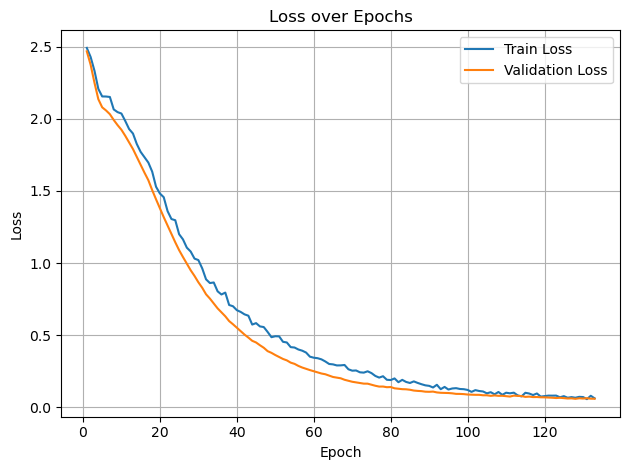

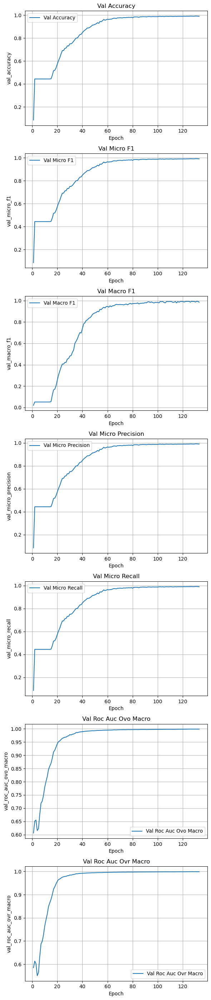

In [686]:
reports.plot_history(history_simple_cnn)

In [687]:
y_true, y_pred, y_score = reports.predict_multiclass(simple_cnn_model_2, loaders_class['test'])

=== Multiclass Classification Report ===
              precision    recall  f1-score   support

           0       0.80      0.37      0.51       593
           1       1.00      0.07      0.13       104
           2       0.45      0.05      0.09       105
           3       0.00      0.00      0.00         0
           4       0.23      0.09      0.13       103
           5       0.00      0.00      0.00        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0

    accuracy                           0.24      1001
   macro avg       0.25      0.06      0.08      1001
weighted avg       0.65      0.24      0.34      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/s

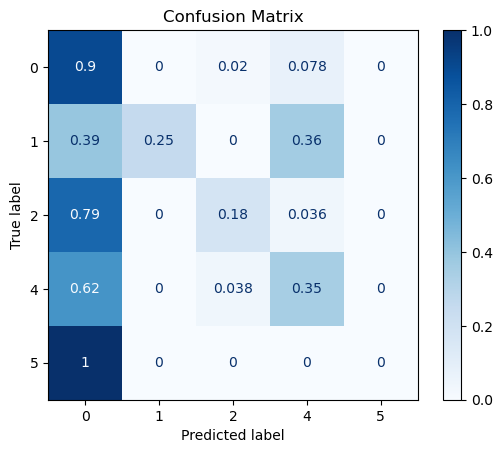

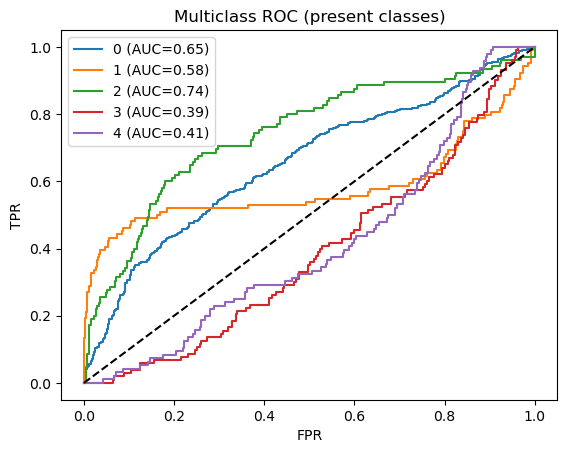

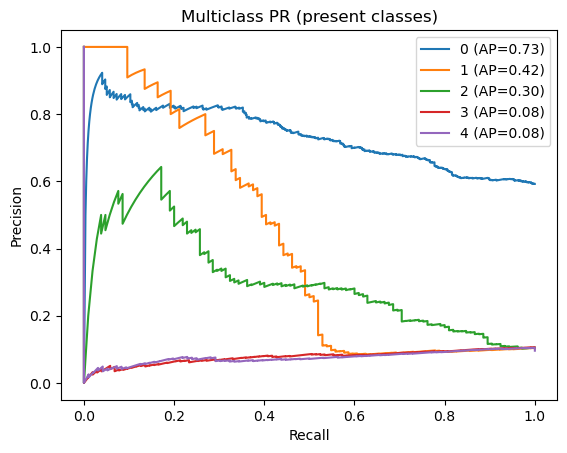

In [688]:
reports.full_report_multiclass(y_true, y_pred, y_score, plot=True);

In [689]:
y_pred_v = np.vstack(list(map(laberer, y_pred))).squeeze()
y_true_v = np.vstack(list(map(laberer, y_true))).squeeze()

=== Multilabel Classification Report ===
              precision    recall  f1-score   support

           0       0.13      0.79      0.23       103
           1       0.16      0.48      0.24        96
           2       0.29      0.19      0.23       104
           3       0.19      0.78      0.30       105

   micro avg       0.16      0.56      0.25       408
   macro avg       0.19      0.56      0.25       408
weighted avg       0.20      0.56      0.25       408
 samples avg       0.12      0.23      0.16       408



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


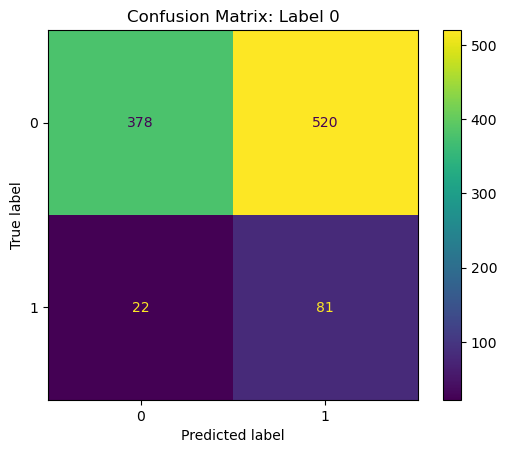

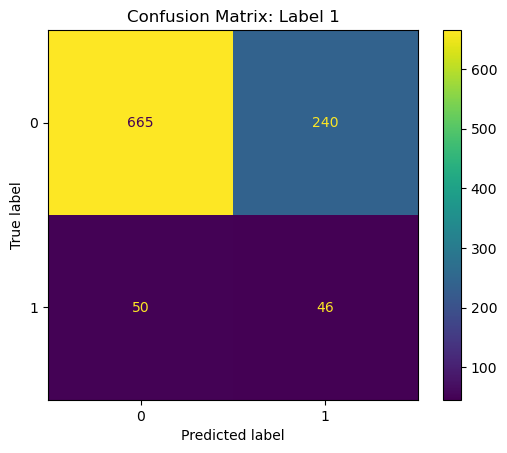

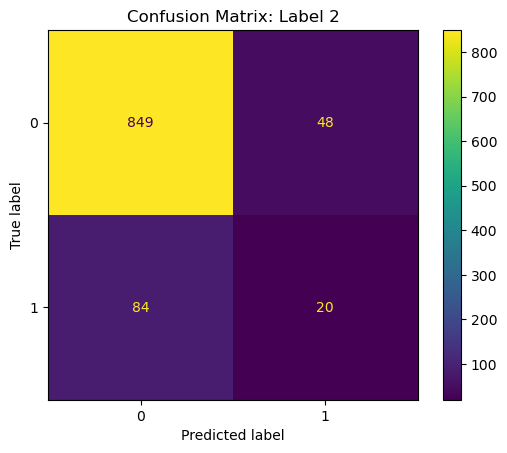

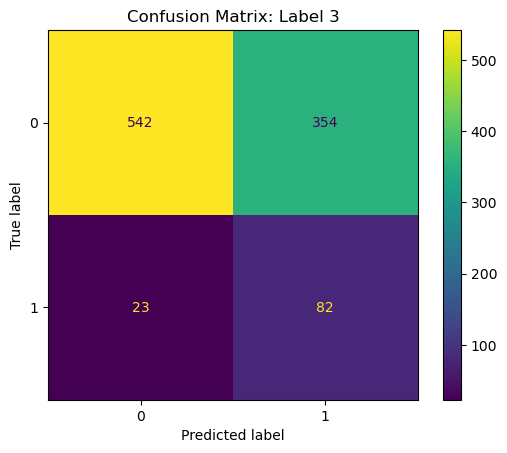

TypeError: 'NoneType' object is not subscriptable

In [690]:
reports.full_report_multilabel(y_true_v, y_pred_v, None, plot=True)

## Extended Case

In [692]:
extended_cnn_model = models.ConfigurableTwoBranchCNN(
     num_aux_feats=len(AUX_COLS_EXT),
     num_labels=NUM_CLASSES,
     conv_channels=[32, 64, 128],
     pool_sizes=[(2,2), (2,2), (2,1)],
             sensor_shape=(128, 6),
     in_channels=1)

In [693]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(extended_cnn_model.parameters(),
                      lr=1e-5,
                      weight_decay=1e-3)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                 patience=2,
                                                 min_lr=1e-10,
                                                 factor=0.2)
extended_cnn = learners.MultiClassLearner(extended_cnn_model,
                                        optimizer,
                                        criterion,
                                        loaders_class_w['train_ext'],
                                        loaders_class_w['val_ext'],
                                        scheduler=scheduler,
                                        metrics=metrics_multiclass,
                                        model_name='ExtendedCNNStandartDataMulticlass')
                                        
                                        

In [694]:
history_extended_cnn = extended_cnn.fit(500)

### Starting ExtendedCNNStandartDataMulticlass_brilliant_voyager_20250616_133317
  model: ConfigurableTwoBranchCNN
  optimizer: Adam
  criterion: CrossEntropyLoss
  scheduler: ReduceLROnPlateau
  patience: 10
  metrics: ['accuracy', 'micro_f1', 'macro_f1', 'micro_precision', 'micro_recall', 'roc_auc_ovo_macro', 'roc_auc_ovr_macro']
Epoch 001 — loss 2.4385/2.3876 — lr 1.0e-05
                                              accuracy         :  0.4433 | micro_f1         :  0.4433 | macro_f1         :  0.0512
                                              micro_precision  :  0.4433 | micro_recall     :  0.4433 | roc_auc_ovo_macro:  0.7148
                                              roc_auc_ovr_macro:  0.6966
Epoch 002 — loss 2.3320/2.2312 — lr 1.0e-05
                                              accuracy         :  0.4433 | micro_f1         :  0.4433 | macro_f1         :  0.0512
                                              micro_precision  :  0.4433 | micro_recall     :  0.4433 | roc_auc_

<Figure size 640x480 with 0 Axes>

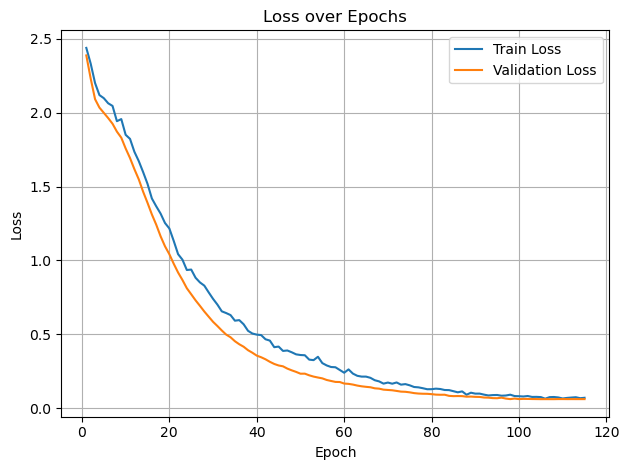

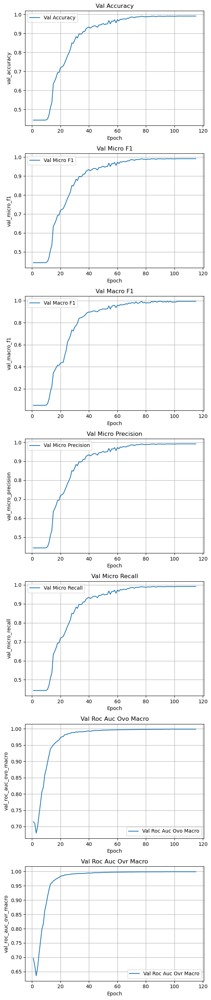

In [695]:
reports.plot_history(history_extended_cnn)

In [697]:
y_true, y_pred, y_score = reports.predict_multiclass(extended_cnn_model, loaders_class['test_ext'])

=== Multiclass Classification Report ===
              precision    recall  f1-score   support

           0       0.65      0.39      0.49       593
           1       0.91      0.10      0.17       104
           2       0.63      0.11      0.19       105
           3       0.00      0.00      0.00         0
           4       0.29      0.10      0.15       103
           5       0.00      0.00      0.00        96
           6       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.26      1001
   macro avg       0.25      0.07      0.10      1001
weighted avg       0.58      0.26      0.34      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/s

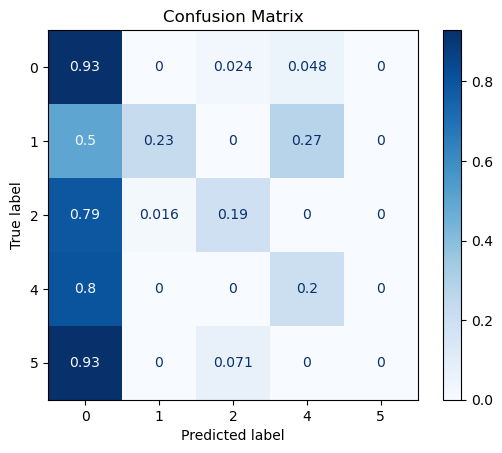

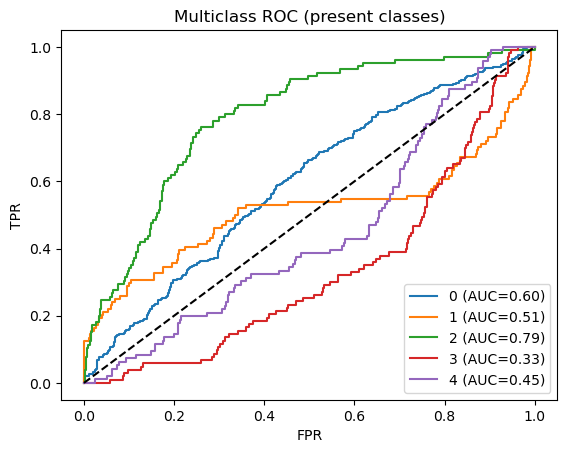

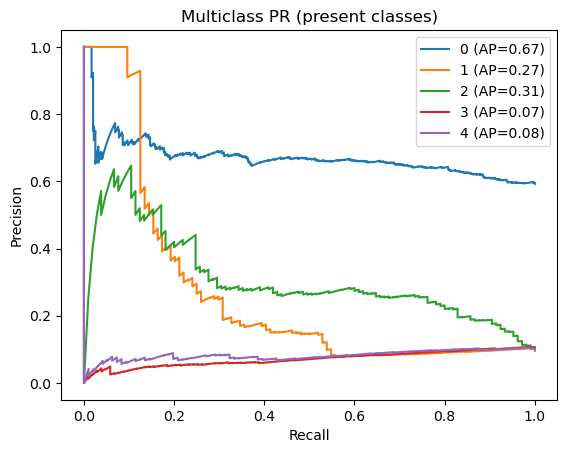

In [698]:
reports.full_report_multiclass(y_true, y_pred, y_score, plot=True);

In [239]:
y_pred_c = np.vstack(list(map(tupler, y_pred))).squeeze()
y_true_c = np.vstack(list(map(tupler, y_true))).squeeze()


=== Multiclass Classification Report ===
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.84      0.34      0.48       593
           1       0.29      0.05      0.08       104
           2       0.17      0.25      0.20       105
           3       0.00      0.00      0.00         0
           4       0.23      0.15      0.18       103
           5       0.24      0.25      0.24        96
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0

    accuracy                           0.27      1001
   macro avg       0.14      0.08      0.09      1001
weighted avg       0.59      0.27      0.35      1001



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


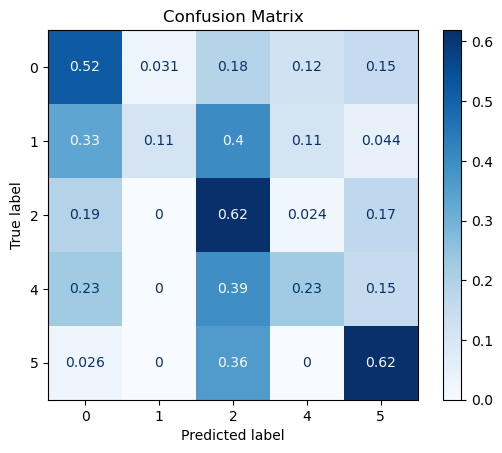

In [240]:
reports.full_report_multiclass(y_true_c, y_pred_c, None)

/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:24:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:24:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:24:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:24:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i


Classification Report:

              precision    recall  f1-score   support

  front_left       0.16      0.62      0.25       103
 front_right       0.21      0.70      0.33        96
   rear_left       0.27      0.58      0.36       104
  rear_right       0.15      0.51      0.24       105

   micro avg       0.19      0.60      0.29       408
   macro avg       0.20      0.60      0.30       408
weighted avg       0.20      0.60      0.29       408
 samples avg       0.17      0.24      0.19       408


Subset Accuracy: 0.2488
Hamming Accuracy: 0.6976

Per-label Accuracy:
front_left: 0.6214
front_right: 0.7253
rear_left: 0.7902
rear_right: 0.6533


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


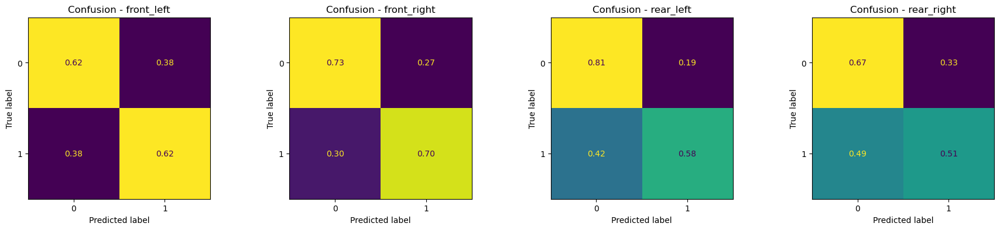

In [1007]:
import torch
import pickle
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
from typing import Tuple
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import classification_report, accuracy_score, hamming_loss, multilabel_confusion_matrix, ConfusionMatrixDisplay
from sklearn.multioutput import ClassifierChain
from xgboost import XGBClassifier
from scipy.stats import skew, kurtosis

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

set_seed()

def load_pickle(path):
    with open(path, 'rb') as f:
        return pickle.load(f)

def label_to_tuple(label: int) -> Tuple[bool, bool, bool, bool]:
    match label:
        case 0: return (False, False, False, False)
        case 1: return (False, False, True, False)
        case 2: return (False, False, False, True)
        case 3: return (False, False, True, True)
        case 4: return (True, False, False, False)
        case 5: return (False, True, False, False)
        case 6: return (True, True, False, False)
        case 7: return (True, False, True, False)
        case 8: return (False, True, False, True)
        case 9: return (True, False, False, True)
        case 10: return (False, True, True, False)
        case 11: return (True, True, True, True)
    raise ValueError(f"Invalid label: {label}")

def extract_advanced_sensor_features(sensor_array):
    fft_features = np.fft.rfft(sensor_array, axis=1).real
    fft_mean = fft_features.mean(axis=1)
    fft_std = fft_features.std(axis=1)
    return np.concatenate([
        sensor_array.mean(axis=1),
        sensor_array.std(axis=1),
        sensor_array.max(axis=1),
        sensor_array.min(axis=1),
        skew(sensor_array, axis=1),
        kurtosis(sensor_array, axis=1),
        fft_mean,
        fft_std
    ], axis=1)

def oversample_multilabel(X, y, target_per_class=1000):
    y_tuples = [tuple(row) for row in y]
    unique, counts = np.unique(y_tuples, axis=0, return_counts=True)
    X_aug, y_aug = [], []
    for label, count in zip(unique, counts):
        mask = np.all(y == label, axis=1)
        idx = np.where(mask)[0]
        n_needed = target_per_class - count
        if n_needed <= 0:
            continue
        for _ in range(n_needed):
            i = np.random.choice(idx)
            X_aug.append(X[i])
            y_aug.append(y[i])
    if not X_aug:
        return X, y
    return np.vstack([X, np.array(X_aug)]), np.vstack([y, np.array(y_aug)])

train_data = train
test_data = test
train_data = train_data.drop(columns=["model"])
test_data = test_data.drop(columns=["model"])

combined = pd.concat([train_data.drop(columns=["label"]), test_data.drop(columns=["label"])]).reset_index(drop=True)
knn_imputer = KNNImputer(n_neighbors=5)
knn_imputer.fit(train_data.drop(columns=["label"]).select_dtypes(include=[np.number]))
combined_columns = combined.select_dtypes(include=[np.number]).columns
test_data.loc[:, combined_columns] = knn_imputer.transform(test_data.drop(columns=["label"]).select_dtypes(include=[np.number]))

X_train = train_data.drop(columns=["label"])
y_train = train_data["label"]
X_test = test_data.drop(columns=["label"])
y_test = test_data["label"]
X_train_sensor = np.stack(X_train["sensor_data"].values)
X_test_sensor = np.stack(X_test["sensor_data"].values)
X_train_tab = X_train.drop(columns=["sensor_data"])
X_test_tab = X_test.drop(columns=["sensor_data"])

tab_scaler = StandardScaler()
X_train_tab_scaled = tab_scaler.fit_transform(X_train_tab)
X_test_tab_scaled = tab_scaler.transform(X_test_tab)

sensor_scaler = RobustScaler()
flat_train = X_train_sensor.reshape(-1, 6)
flat_test = X_test_sensor.reshape(-1, 6)
flat_train_scaled = sensor_scaler.fit_transform(flat_train)
flat_test_scaled = sensor_scaler.transform(flat_test)
X_train_sensor_scaled = flat_train_scaled.reshape(X_train_sensor.shape)
X_test_sensor_scaled = flat_test_scaled.reshape(X_test_sensor.shape)

sensor_train_feat = extract_advanced_sensor_features(X_train_sensor_scaled)
sensor_test_feat = extract_advanced_sensor_features(X_test_sensor_scaled)
X_train_combined = np.concatenate([X_train_tab_scaled, sensor_train_feat], axis=1)
X_test_combined = np.concatenate([X_test_tab_scaled, sensor_test_feat], axis=1)

y_train_multi = np.array(y_train.apply(label_to_tuple).tolist()).astype(np.int32)
y_test_multi = np.array(y_test.apply(label_to_tuple).tolist()).astype(np.int32)

X_train_bal, y_train_bal = oversample_multilabel(X_train_combined, y_train_multi, target_per_class=1000)

base_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', scale_pos_weight=5)
chains = [ClassifierChain(base_model, order='random', random_state=i) for i in range(5)]

for chain in chains:
    chain.fit(X_train_bal, y_train_bal)

y_pred_ensemble = sum(chain.predict_proba(X_test_combined) for chain in chains) / len(chains)
thresholds = np.array([0.3, 0.3, 0.25, 0.2])
y_pred_final = (y_pred_ensemble > thresholds).astype(int)

print("\nClassification Report:\n")
print(classification_report(y_test_multi, y_pred_final, target_names=["front_left", "front_right", "rear_left", "rear_right"]))

subset_acc = accuracy_score(y_test_multi, y_pred_final)
hamming = hamming_loss(y_test_multi, y_pred_final)
label_acc = (y_pred_final == y_test_multi).mean(axis=0)

print(f"\nSubset Accuracy: {subset_acc:.4f}")
print(f"Hamming Accuracy: {1 - hamming:.4f}")
print("\nPer-label Accuracy:")
for name, acc in zip(["front_left", "front_right", "rear_left", "rear_right"], label_acc):
    print(f"{name}: {acc:.4f}")

# Normalize confusion matrices to show proportions instead of counts
conf_matrices = multilabel_confusion_matrix(y_test_multi, y_pred_final)
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for i, ax in enumerate(axes):
    cm = conf_matrices[i]
    cm_sum = cm.sum(axis=1, keepdims=True)
    # Avoid division by zero
    cm_norm = np.divide(cm, cm_sum, where=cm_sum != 0)
    disp = ConfusionMatrixDisplay(cm_norm, display_labels=["0", "1"])
    disp.plot(ax=ax, colorbar=False, values_format=".2f")
    ax.set_title(f"Confusion - {['front_left', 'front_right', 'rear_left', 'rear_right'][i]}")
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:38:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:38:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:38:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [00:38:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i

              precision    recall  f1-score   support

  front_left       0.16      0.62      0.25       103
 front_right       0.22      0.72      0.33        96
   rear_left       0.24      0.57      0.33       104
  rear_right       0.15      0.50      0.23       105

   micro avg       0.18      0.60      0.28       408
   macro avg       0.19      0.60      0.29       408
weighted avg       0.19      0.60      0.29       408
 samples avg       0.16      0.24      0.19       408

Pipeline has been saved to 'pipeline.pkl'.


/opt/anaconda3/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_c

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()